# Extinguish emission lines with Fnu  v3


- author Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNRS
- creation date : 2023-06-19
- update : 2023-06-19


From this mergin work on spectra and photometry can start

In [1]:
import h5py
import pandas as pd
import numpy as np
import os
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
from collections import OrderedDict
import re
import matplotlib.gridspec as gridspec


In [2]:
from astropy import units as u
from astropy import constants as const
U_FNU = u.def_unit(u'fnu',  u.erg / (u.cm**2 * u.s * u.Hz))
U_FL = u.def_unit(u'fl',  u.erg / (u.cm**2 * u.s * u.AA))

In [3]:
def ConvertFlambda_to_Fnu(wl, flambda):
    """
    Convert spectra density flambda to fnu.
    parameters:
        - Flambda : flux density in erg/s/cm2 /AA or W/cm2/AA

    return
         - Fnu : flux density in erg/s/cm2/Hz or W/cm2/Hz


    Compute Fnu = wl**2/c Flambda
    check the conversion units with astropy units and constants 
    
    """
    
    fnu = (flambda*U_FL*(wl*u.AA)**2/const.c).to(U_FNU)/(1*U_FNU)
    #fnu = (flambda* (u.erg / (u.cm**2 * u.s * u.AA)) *(wl*u.AA)**2/const.c).to( u.erg / (u.cm**2 * u.s * u.Hz))/(u.erg / (u.cm**2 * u.s * u.Hz))
    
    return fnu
 

In [4]:
lambda_red = 6231
lambda_width = 50
lambda_sel_min = lambda_red-lambda_width /2.
lambda_sel_max = lambda_red+lambda_width /2.

In [5]:
def flux_norm(wl,fl):
    idx_wl_sel = np.where(np.logical_and(wl>= lambda_sel_min,wl<= lambda_sel_max))[0]
    flarr_norm = fl[idx_wl_sel]
    return np.median(flarr_norm)

In [6]:
from GalaxyLineDict import build_emissionlinesdict

In [7]:
from sklearn.gaussian_process import GaussianProcessRegressor, kernels

In [8]:
ordered_keys = ['name','num','ra','dec', 'redshift','Rmag','RT', 'RV','eRV','Nsp','lines',
                'ra_galex','dec_galex','fuv_mag', 'fuv_magerr','nuv_mag', 'nuv_magerr', 
                'fuv_flux', 'fuv_fluxerr','nuv_flux', 'nuv_fluxerr','asep_galex',
                'ID', 'KIDS_TILE','RAJ2000','DECJ2000','Z_ML', 'Z_B','asep_kids','CLASS_STAR',
                'MAG_GAAP_u','MAG_GAAP_g','MAG_GAAP_r','MAG_GAAP_i','MAG_GAAP_Z','MAG_GAAP_Y','MAG_GAAP_J', 'MAG_GAAP_H','MAG_GAAP_Ks',
                'MAGERR_GAAP_u','MAGERR_GAAP_g','MAGERR_GAAP_r','MAGERR_GAAP_i','MAGERR_GAAP_Z','MAGERR_GAAP_Y','MAGERR_GAAP_J','MAGERR_GAAP_H','MAGERR_GAAP_Ks',
                'FLUX_GAAP_u','FLUX_GAAP_g','FLUX_GAAP_r','FLUX_GAAP_i','FLUX_GAAP_Z','FLUX_GAAP_Y','FLUX_GAAP_J', 'FLUX_GAAP_H','FLUX_GAAP_Ks',
                'FLUXERR_GAAP_u','FLUXERR_GAAP_g','FLUXERR_GAAP_r','FLUXERR_GAAP_i','FLUXERR_GAAP_Z','FLUXERR_GAAP_Y','FLUXERR_GAAP_J','FLUXERR_GAAP_H','FLUXERR_GAAP_Ks',
                'FLUX_RADIUS', 'EXTINCTION_u','EXTINCTION_g','EXTINCTION_r', 'EXTINCTION_i',]
                

In [9]:
class Fors2DataAcess(object):
    def __init__(self,filename):
        if os.path.isfile(filename):
            self.hf = h5py.File(filename, 'r')
            self.list_of_groupkeys = list(self.hf.keys())      
             # pick one key    
            key_sel =  self.list_of_groupkeys[0]
            # pick one group
            group = self.hf.get(key_sel)  
            #pickup all attribute names
            self.list_of_subgroup_keys = []
            for k in group.attrs.keys():
                self.list_of_subgroup_keys.append(k)
        else:
            self.hf = None
            self.list_of_groupkeys = []
            self.list_of_subgroup_keys = []
    def close_file(self):
        self.hf.close() 
        
    def get_list_of_groupkeys(self):
        return self.list_of_groupkeys 
    def get_list_subgroup_keys(self):
        return self.list_of_subgroup_keys
    def getattribdata_fromgroup(self,groupname):
        attr_dict = OrderedDict()
        if groupname in self.list_of_groupkeys:       
            group = self.hf.get(groupname)  
            for  nameval in self.list_of_subgroup_keys:
                attr_dict[nameval] = group.attrs[nameval]
        else:
            print(f'getattribdata_fromgroup : No group {groupname}')
        return attr_dict
    def getspectrum_fromgroup(self,groupname):
        spec_dict = {}
        if groupname in self.list_of_groupkeys:       
            group = self.hf.get(groupname)  
            wl = np.array(group.get("wl"))
            fl = np.array(group.get("fl")) 
            spec_dict["wl"] = wl
            spec_dict["fl"] = fl

            #convert to fnu
            fnu = ConvertFlambda_to_Fnu(wl, fl)
            fnorm = flux_norm(wl,fnu)
            spec_dict["fnu"] = fnu/fnorm
            
            
        else:
            print(f'getspectrum_fromgroup : No group {groupname}')
        return spec_dict
    
    #kernel = kernels.RBF(0.5, (8000, 10000.0))
    #gp = GaussianProcessRegressor(kernel=kernel ,random_state=0)

    def getspectrumcleanedemissionlines_fromgroup(self,groupname,gp,nsigs=8):
        spec_dict = {}
        if groupname in self.list_of_groupkeys:       
            group = self.hf.get(groupname)  
            wl = np.array(group.get("wl"))
            fl = np.array(group.get("fl")) 

            #convert to fnu
            fnu = ConvertFlambda_to_Fnu(wl, fl)
            fnorm = flux_norm(wl,fnu)
            
            
           
            # fit gaussian pricess 
            X = wl
            Y = fnu/fnorm
            
            DeltaY = Y - gp.predict(X[:, None], return_std=False)
            background = np.sqrt(np.median(DeltaY**2))
            indexes_toremove = np.where(np.abs(DeltaY)> nsigs * background)[0]
            
            Xclean = np.delete(X,indexes_toremove)
            Yclean  = np.delete(Y,indexes_toremove)
            
            spec_dict["wl"] = Xclean
            spec_dict["fnu"] = Yclean
    
            
        else:
            print(f'getspectrum_fromgroup : No group {groupname}')
        return spec_dict
        
        

In [10]:
def plot_line(ax,line_name,redshift=0):
    
    #keys = lines_to_plot.keys()
    #for the_key in keys:
    #    if the_key in line_name:
    #        print("the_key=",the_key," line_name=",line_name)
    #        line_name=the_key
    #        break
            
    posx0=0.0
    posy0=0.05
    fontsize=12
    the_color = {"emission":'pink',"absorption":"g","break":"purple"}
    the_line_to_plot = lines_to_plot[line_name]
    wls = the_line_to_plot["wls"]*(1+redshift)
    tag = the_line_to_plot["name"]
    typ = the_line_to_plot["type"]
    
    xlim = ax.get_xlim()
    for wl in wls:
        ax.axvline(wl, lw=0.5, color=the_color[typ])
        xpos = (wl - xlim[0]) / (xlim[1] - xlim[0])+posx0 
        if 0 < xpos < 1:
            ax.annotate(tag, xy=(xpos, posy0), rotation=0, ha='left', va='bottom',
                            xycoords='axes fraction', color=the_color[typ], fontsize=fontsize)
    return ax


# Emission liens

In [11]:
lines_to_plot=build_emissionlinesdict()

In [12]:
#lines_to_plot

# Read Fors2 / Galex and Kids

In [13]:
input_file_h5  = '../data/FORS2spectraGalexKidsPhotom.hdf5'

In [14]:
fors2 = Fors2DataAcess(input_file_h5)

In [15]:
list_of_keys = fors2.get_list_of_groupkeys()
list_of_attributes = fors2.get_list_subgroup_keys()

## Must sort spectra name

In [16]:
list_of_keys = np.array(list_of_keys)

In [17]:
list_of_keysnum = [ int(re.findall("SPEC(.*)",specname)[0]) for specname in  list_of_keys ]

In [18]:
sorted_indexes = np.argsort(list_of_keysnum)

In [19]:
list_of_keys = list_of_keys[sorted_indexes]

In [20]:
# fors2.getattribdata_fromgroup('SPEC102')

In [21]:
# fors2.getspectrum_fromgroup('SPEC102')

In [22]:
df_info = pd.DataFrame(columns=list_of_attributes)
all_df = []

In [23]:
for idx,key in enumerate(list_of_keys):
    attrs = fors2.getattribdata_fromgroup(key)
    spectr = fors2.getspectrum_fromgroup(key)
    df_info.loc[idx] = [*attrs.values()] # hope the order of attributes is kept
    df = pd.DataFrame({"wl":spectr["wl"],"fnu":spectr["fnu"]})
    all_df.append(df)
    

/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [24]:
df_info.reset_index(drop=True, inplace=True) 

In [25]:
df_info = df_info[ordered_keys]

In [26]:
df_info

,name,num,ra,dec,redshift,Rmag,RT,RV,eRV,Nsp,...,FLUXERR_GAAP_Z,FLUXERR_GAAP_Y,FLUXERR_GAAP_J,FLUXERR_GAAP_H,FLUXERR_GAAP_Ks,FLUX_RADIUS,EXTINCTION_u,EXTINCTION_g,EXTINCTION_r,EXTINCTION_i
0,SPEC2,2,13.52997,-28.44776,0.34555,21.18,12.3,103665,40,1,...,179.816220,356.027740,290.613160,594.538760,694.397200,2.967994,0.072517,0.056505,0.039090,0.029048
1,SPEC3,3,13.52552,-28.42080,0.68660,21.45,11.6,210642,48,4,...,179.913452,352.837769,287.987885,588.559448,685.337463,3.020974,0.075065,0.058490,0.040463,0.030069
2,SPEC9,9,13.50219,-28.40641,0.29266,21.60,13.1,87798,58,1,...,185.288483,330.740845,268.486725,579.864075,606.197693,2.671784,0.074299,0.057893,0.040050,0.029762
3,SPEC13,13,13.49261,-28.38272,0.68870,23.14,0.0,206610,0,1,...,180.381531,323.638702,260.288177,NaN,NaN,2.192928,0.077572,0.060444,0.041815,0.031073
4,SPEC19,19,13.60758,-28.43452,0.48395,21.70,7.1,145185,104,1,...,123.689148,238.951889,225.177338,544.024658,507.931976,2.992076,0.075642,0.058940,0.040774,0.030300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,SPEC734,734,13.68083,-28.23290,0.23012,0.00,7.2,69036,71,1,...,98.486717,243.505157,196.822708,461.214691,495.400299,3.462931,0.073033,0.056906,0.039368,0.029254
546,SPEC735,735,13.69958,-28.23161,0.36169,19.28,8.2,108507,107,1,...,102.504509,254.145142,206.989441,479.774139,521.821655,3.587435,0.072326,0.056356,0.038987,0.028971
547,SPEC736,736,13.66431,-28.22849,0.55777,21.64,10.5,167331,31,1,...,108.492714,222.538773,185.683838,429.756744,456.459747,4.769248,0.074087,0.057728,0.039936,0.029677
548,SPEC737,737,13.62722,-28.22692,0.52001,21.40,10.2,156003,53,1,...,105.423523,216.082657,179.259644,419.079620,434.556122,2.864109,0.079347,0.061827,0.042772,0.031784


# Select good match with galex

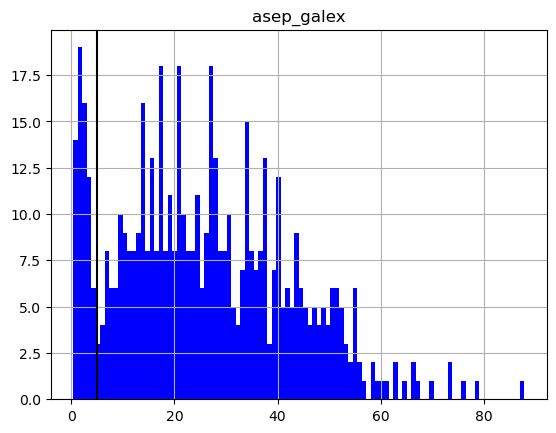

In [27]:
df_info.hist("asep_galex",bins=100,color="b")
plt.axvline(5,c="k")

array([[<Axes: title={'center': 'asep_kids'}>]], dtype=object)

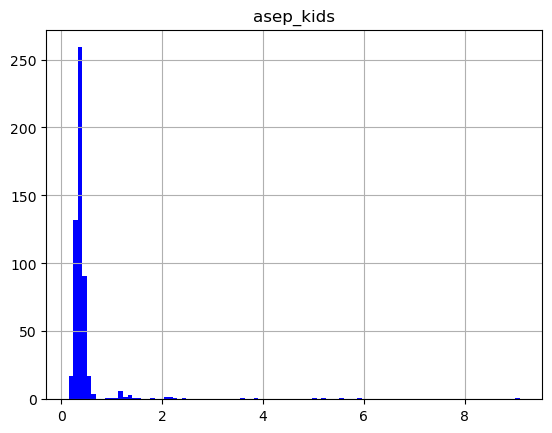

In [28]:
df_info.hist("asep_kids",bins=100,color='b')

## Select  Those spectra having GALEX

In [29]:
df = df_info[df_info["asep_galex"] <= 5]

In [30]:
df.index

Int64Index([ 13,  38,  70,  98,  99, 113, 158, 159, 163, 171, 172, 182, 193,
            205, 210, 215, 228, 232, 241, 243, 244, 245, 253, 256, 257, 263,
            275, 276, 278, 285, 292, 312, 313, 316, 331, 345, 348, 382, 384,
            386, 387, 395, 409, 411, 413, 416, 425, 428, 431, 442, 458, 459,
            461, 463, 469, 473, 480, 483, 504, 511, 512, 528, 530, 533, 535,
            536, 538, 543],
           dtype='int64')

## Remove NaN

- remove those row with no FUV

In [31]:
#df = df.dropna()

## Remove rows with Rmag = 0

In [32]:
#df = df[df["Rmag"] > 0]

# Plot Spectra

https://en.wikipedia.org/wiki/Photometric_system

In [33]:
lambda_FUV = 1528.
lambda_NUV = 2271.
lambda_U = 3650.
lambda_B = 4450.
lambda_G = 4640.
lambda_R = 5580.
lambda_I = 8060.
lambda_Z = 9000.
lambda_Y = 10200.
lambda_J = 12200.
lambda_H = 16300.
lambda_K = 21900.
lambda_L = 34500.

WL = [lambda_FUV, lambda_NUV, lambda_B, lambda_G, lambda_R ,lambda_I, lambda_Z, lambda_Y, lambda_J, lambda_H, lambda_K ]

In [34]:
df

,name,num,ra,dec,redshift,Rmag,RT,RV,eRV,Nsp,...,FLUXERR_GAAP_Z,FLUXERR_GAAP_Y,FLUXERR_GAAP_J,FLUXERR_GAAP_H,FLUXERR_GAAP_Ks,FLUX_RADIUS,EXTINCTION_u,EXTINCTION_g,EXTINCTION_r,EXTINCTION_i
13,SPEC36,36,13.56870,-28.43129,0.82266,19.96,13.0,246798,80,1,...,175.896149,340.098511,277.472107,570.941833,660.577942,4.946754,0.075650,0.058946,0.040779,0.030303
38,SPEC85,85,13.53755,-28.38375,0.97900,23.21,0.0,0,0,1,...,180.088974,323.638702,260.301910,556.272217,609.571655,1.904666,0.080195,0.062487,0.043228,0.032123
70,SPEC151,151,13.54459,-28.38795,0.49762,22.23,11.1,149286,33,1,...,184.057159,332.456512,269.498627,576.139160,628.552673,3.000832,0.080068,0.062388,0.043160,0.032072
98,SPEC214,214,13.54850,-28.42296,0.29266,19.80,16.1,87798,23,1,...,178.927719,348.236633,284.142151,584.317017,679.517578,4.766320,0.076636,0.059715,0.041310,0.030698
99,SPEC218,218,13.54348,-28.43490,0.43800,21.27,0.0,131400,0,1,...,189.295288,375.119659,309.391968,636.975586,740.847229,4.821135,0.073811,0.057513,0.039787,0.029566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
533,SPEC722,722,13.69932,-28.26123,1.21050,20.99,17.5,363150,234,1,...,123.030487,253.777481,205.343628,464.147339,514.735779,2.023525,0.071443,0.055668,0.038511,0.028618
535,SPEC724,724,13.66411,-28.25705,0.23168,21.07,13.5,69504,36,1,...,118.080482,242.339783,191.391754,440.170135,480.001190,3.872675,0.070691,0.055082,0.038105,0.028316
536,SPEC725,725,13.69168,-28.25586,0.23010,20.86,14.1,69030,29,1,...,122.323341,252.362854,204.230362,465.261749,512.764404,4.971230,0.071652,0.055831,0.038623,0.028701
538,SPEC727,727,13.69381,-28.25005,0.23060,22.59,5.9,69180,81,1,...,127.273331,261.258026,214.011581,488.609253,536.854980,3.747046,0.070389,0.054846,0.037942,0.028195


In [35]:
df['index0'] = df.index
df = df.reset_index()

/var/folders/cq/vms8st5136z3q5xx4rd9xqfr0000gw/T/ipykernel_13355/1867917747.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['index0'] = df.index


In [36]:
df['index0']

0      13
1      38
2      70
3      98
4      99
     ... 
63    533
64    535
65    536
66    538
67    543
Name: index0, Length: 68, dtype: int64

In [37]:
df.columns

Index(['index', 'name', 'num', 'ra', 'dec', 'redshift', 'Rmag', 'RT', 'RV',
       'eRV', 'Nsp', 'lines', 'ra_galex', 'dec_galex', 'fuv_mag', 'fuv_magerr',
       'nuv_mag', 'nuv_magerr', 'fuv_flux', 'fuv_fluxerr', 'nuv_flux',
       'nuv_fluxerr', 'asep_galex', 'ID', 'KIDS_TILE', 'RAJ2000', 'DECJ2000',
       'Z_ML', 'Z_B', 'asep_kids', 'CLASS_STAR', 'MAG_GAAP_u', 'MAG_GAAP_g',
       'MAG_GAAP_r', 'MAG_GAAP_i', 'MAG_GAAP_Z', 'MAG_GAAP_Y', 'MAG_GAAP_J',
       'MAG_GAAP_H', 'MAG_GAAP_Ks', 'MAGERR_GAAP_u', 'MAGERR_GAAP_g',
       'MAGERR_GAAP_r', 'MAGERR_GAAP_i', 'MAGERR_GAAP_Z', 'MAGERR_GAAP_Y',
       'MAGERR_GAAP_J', 'MAGERR_GAAP_H', 'MAGERR_GAAP_Ks', 'FLUX_GAAP_u',
       'FLUX_GAAP_g', 'FLUX_GAAP_r', 'FLUX_GAAP_i', 'FLUX_GAAP_Z',
       'FLUX_GAAP_Y', 'FLUX_GAAP_J', 'FLUX_GAAP_H', 'FLUX_GAAP_Ks',
       'FLUXERR_GAAP_u', 'FLUXERR_GAAP_g', 'FLUXERR_GAAP_r', 'FLUXERR_GAAP_i',
       'FLUXERR_GAAP_Z', 'FLUXERR_GAAP_Y', 'FLUXERR_GAAP_J', 'FLUXERR_GAAP_H',
       'FLUXERR_GAAP_Ks', 'FL

# Plot

## Plot Magnitude correlation

In [38]:
df_rmag = df[df["Rmag"] > 0]

<Axes: title={'center': 'Kids R magnitude vs Fors2 R Petrosian magnitude'}, xlabel='Rmag', ylabel='MAG_GAAP_r'>

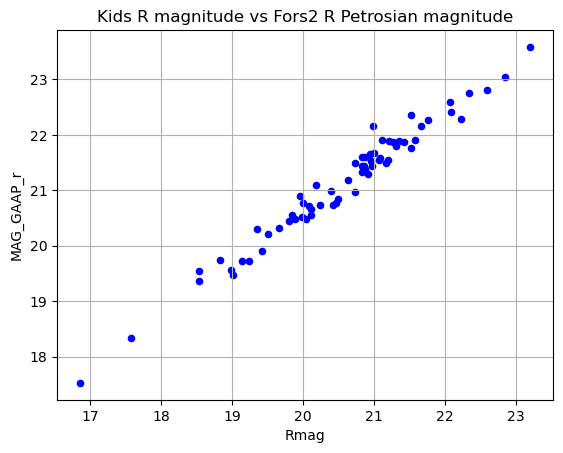

In [39]:
df_rmag.plot.scatter(x="Rmag",y="MAG_GAAP_r",color="b",title="Kids R magnitude vs Fors2 R Petrosian magnitude",grid=True)

# Plots

# Fit Gaussian process to remove abs lines

In [40]:
kernel = kernels.RBF(0.5, (8000, 10000.0))
gp = GaussianProcessRegressor(kernel=kernel ,random_state=0)


0  ==  SPEC36 36 13
the_lines =  b'[OII],H9,H8,K,H{beta},[OIII]                                                \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


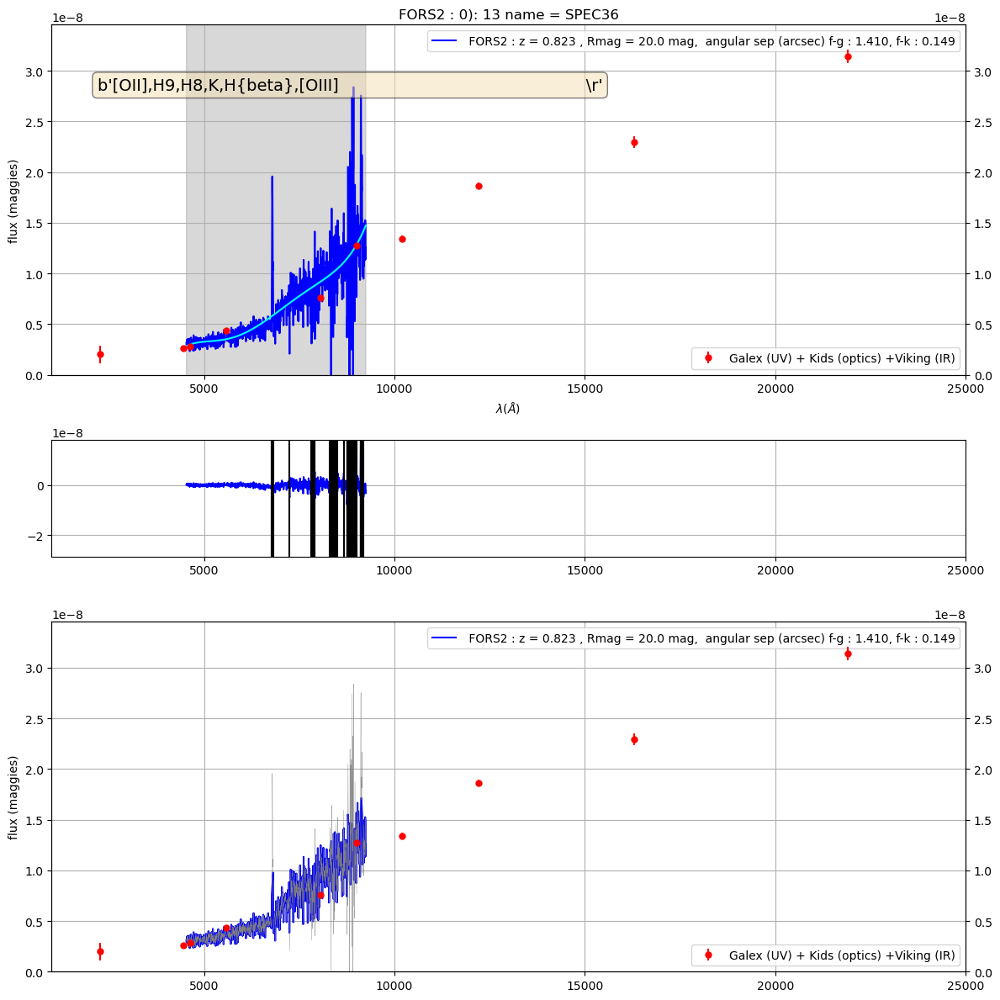

1  ==  SPEC85 85 38
the_lines =  b'MgII,[OII],H                                                                \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


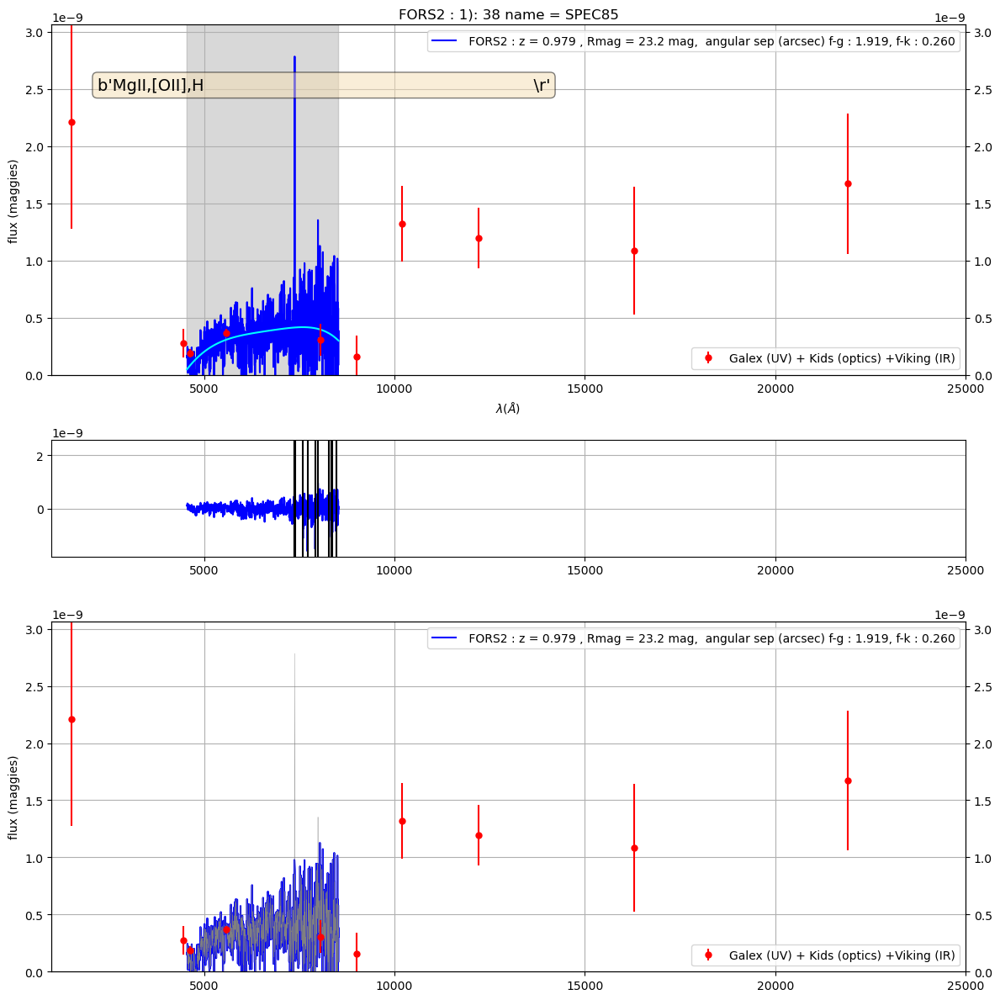

2  ==  SPEC151 151 70
the_lines =  b'[OII],K,H,H{beta}                                                           \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


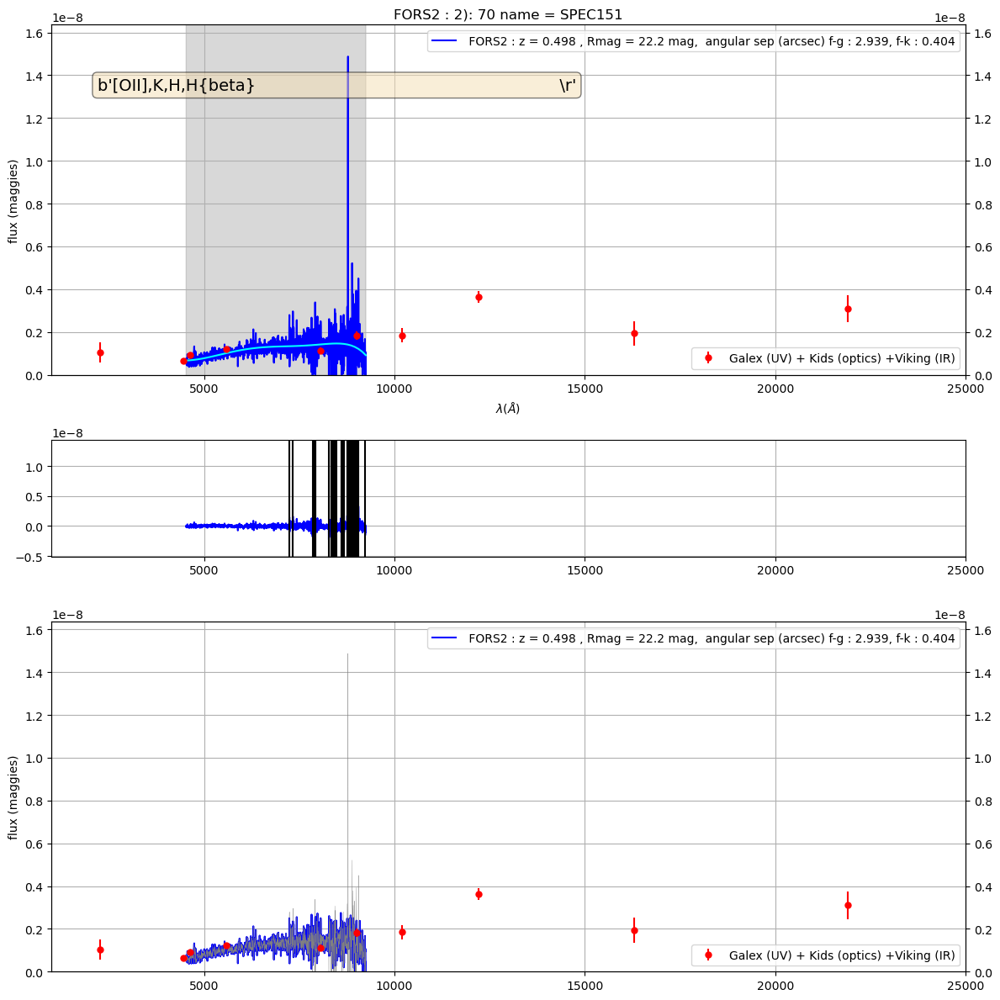

3  ==  SPEC214 214 98
the_lines =  b'[OII],H10,H9,H8,K,H,H{beta},[OIII]                                          \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


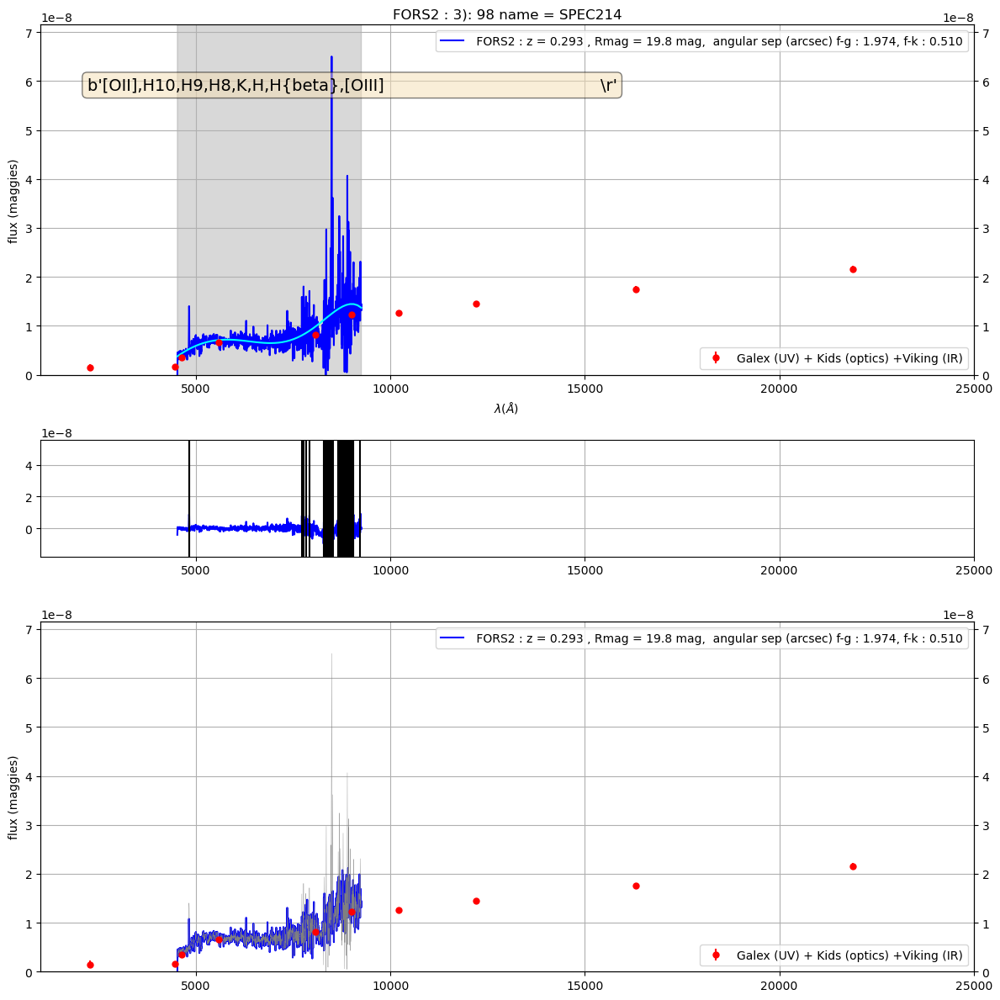

4  ==  SPEC218 218 99
the_lines =  b'[OII]                                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


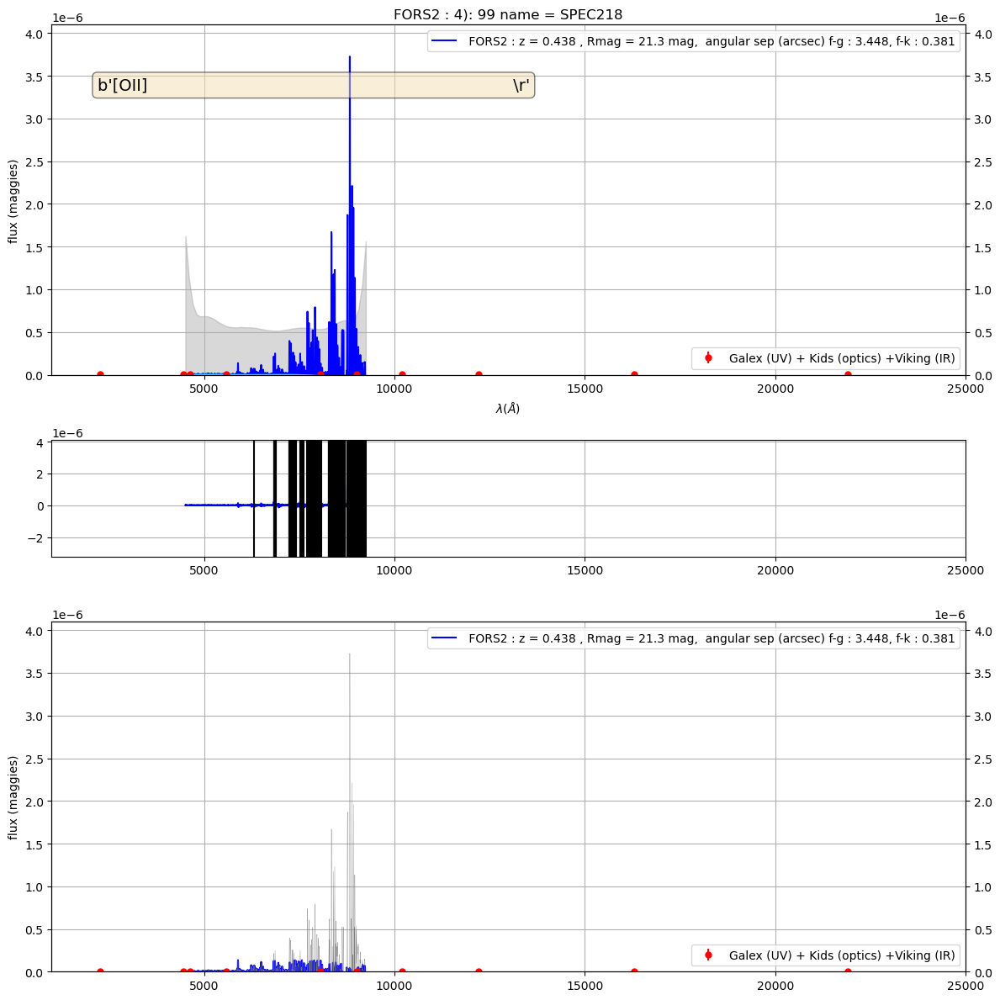

5  ==  SPEC242 242 113
the_lines =  b'[OIII],H{alpha}                                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


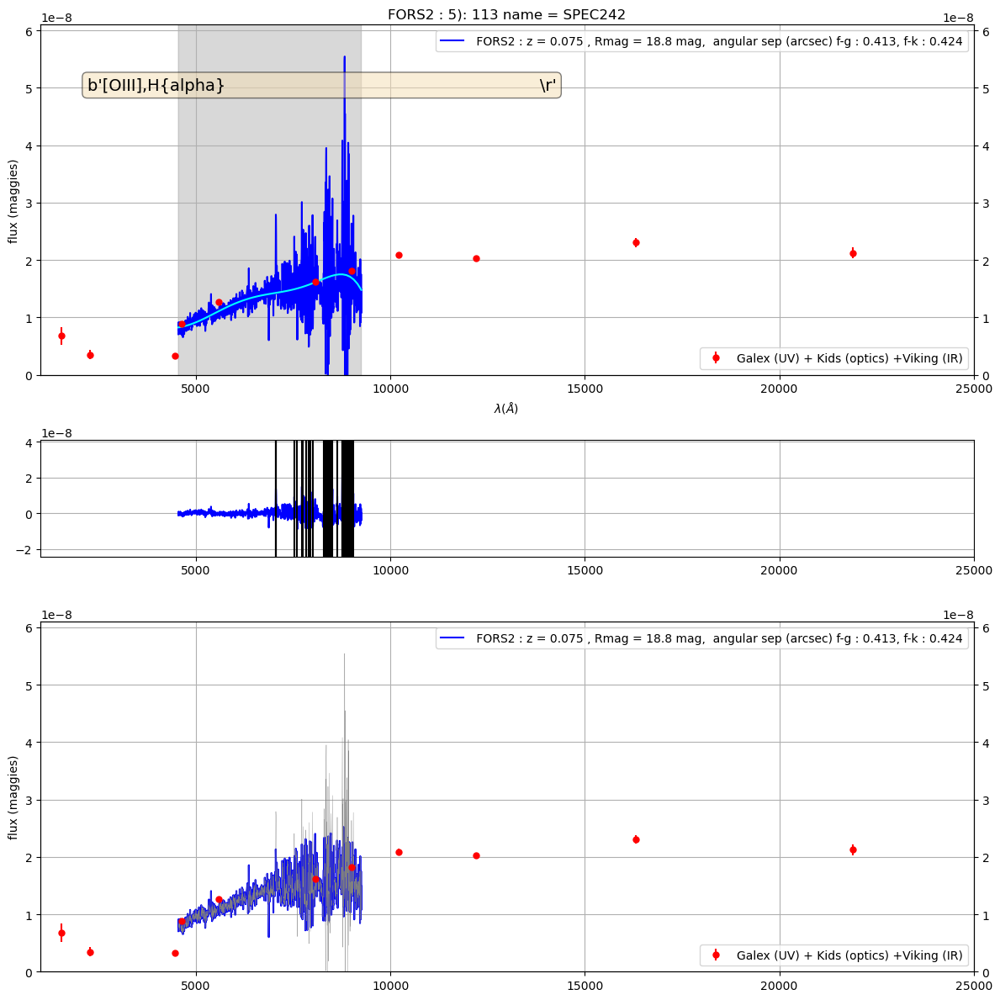

6  ==  SPEC306 306 158
the_lines =  b'MgII,[OII],H10,H9,K                                                         \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


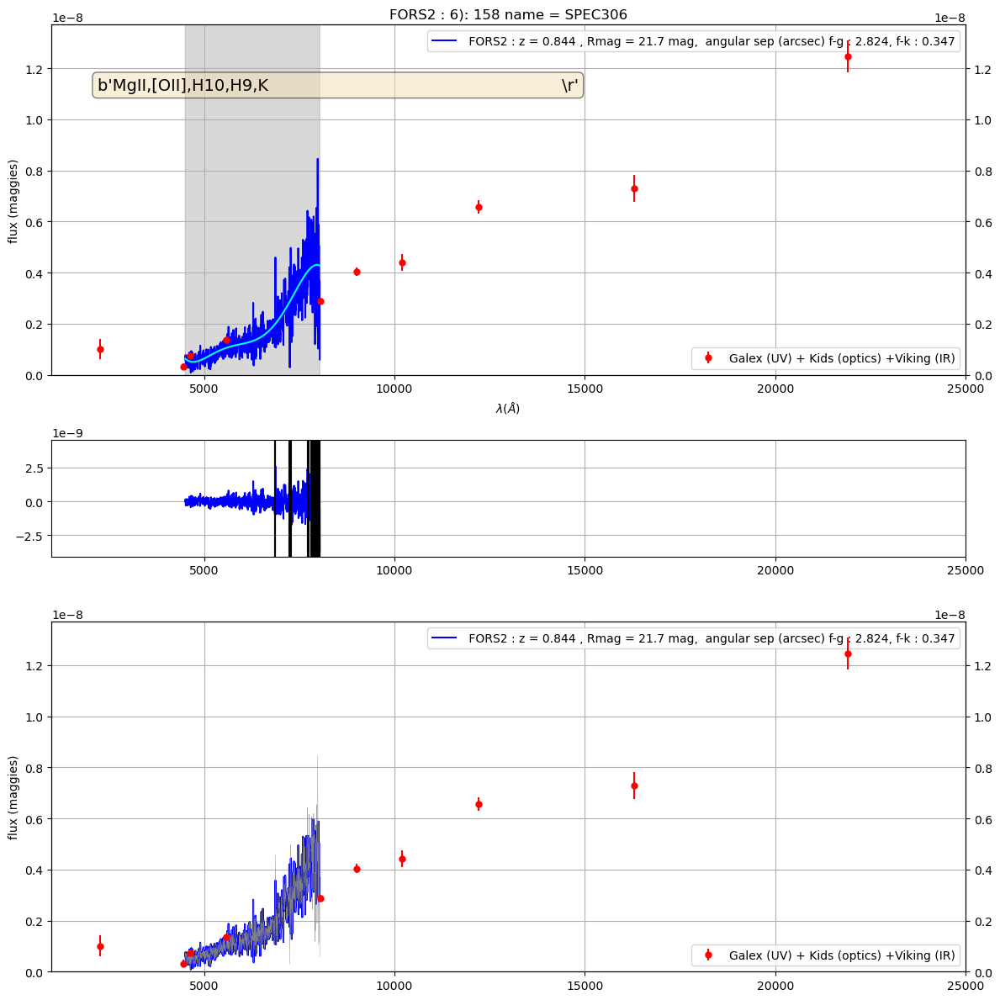

7  ==  SPEC307 307 159
the_lines =  b'[OII],H{alpha}                                                              \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


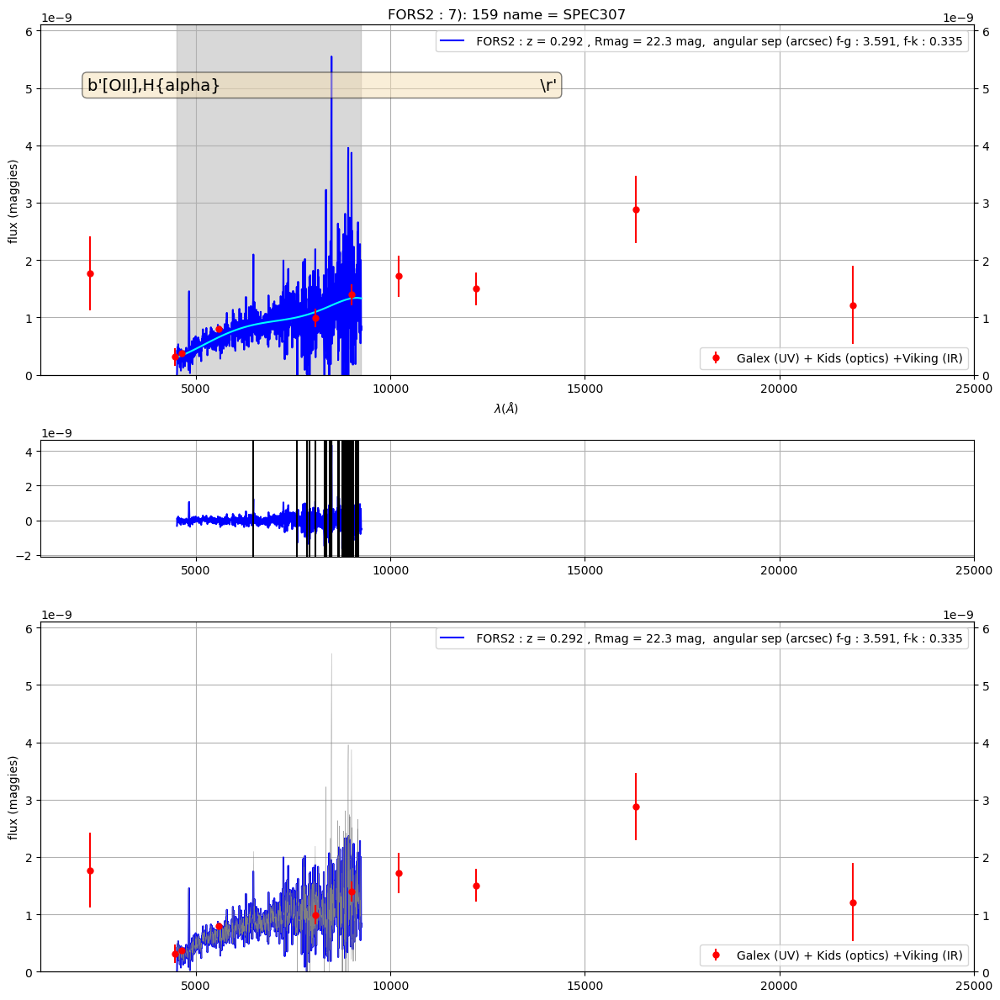

8  ==  SPEC315 315 163
the_lines =  b'[OII],H{beta}                                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


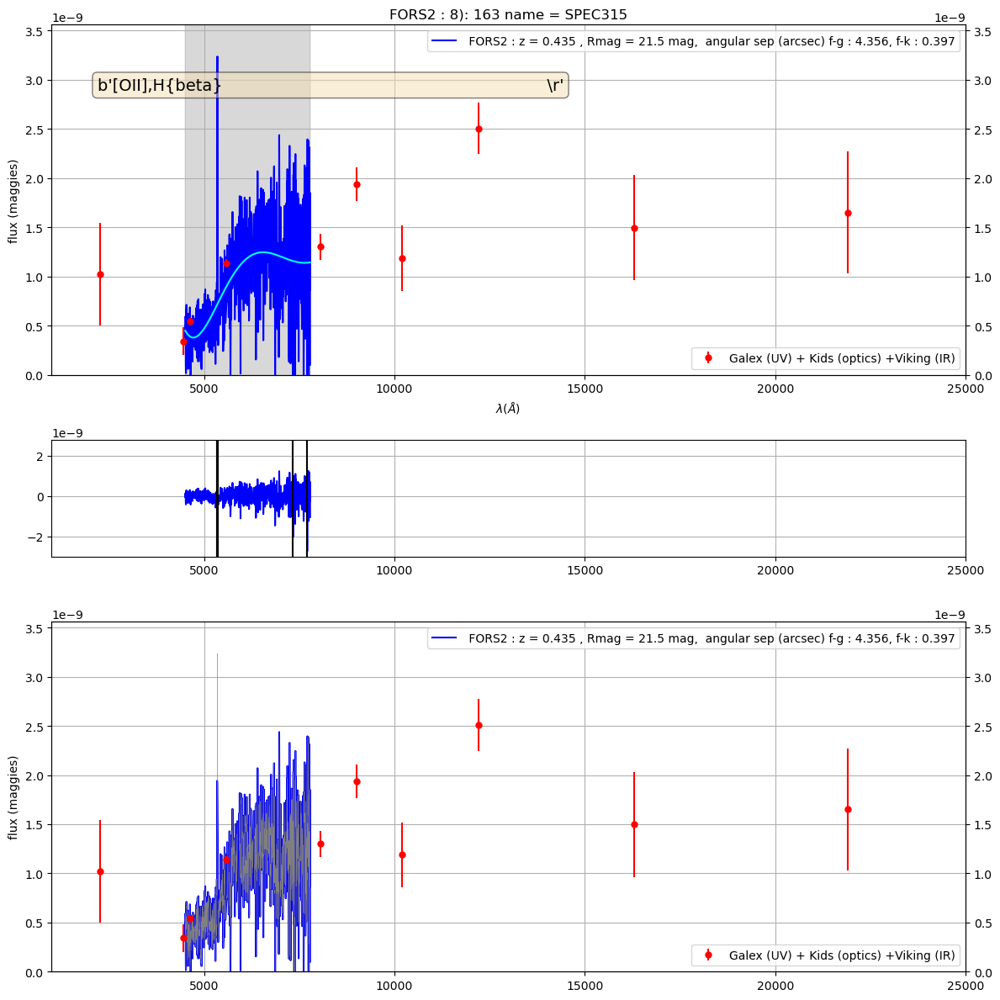

9  ==  SPEC325 325 171
the_lines =  b'[OII],H10,H9,H8,H,H{delta},H{beta},[OIII],H{alpha}                          \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


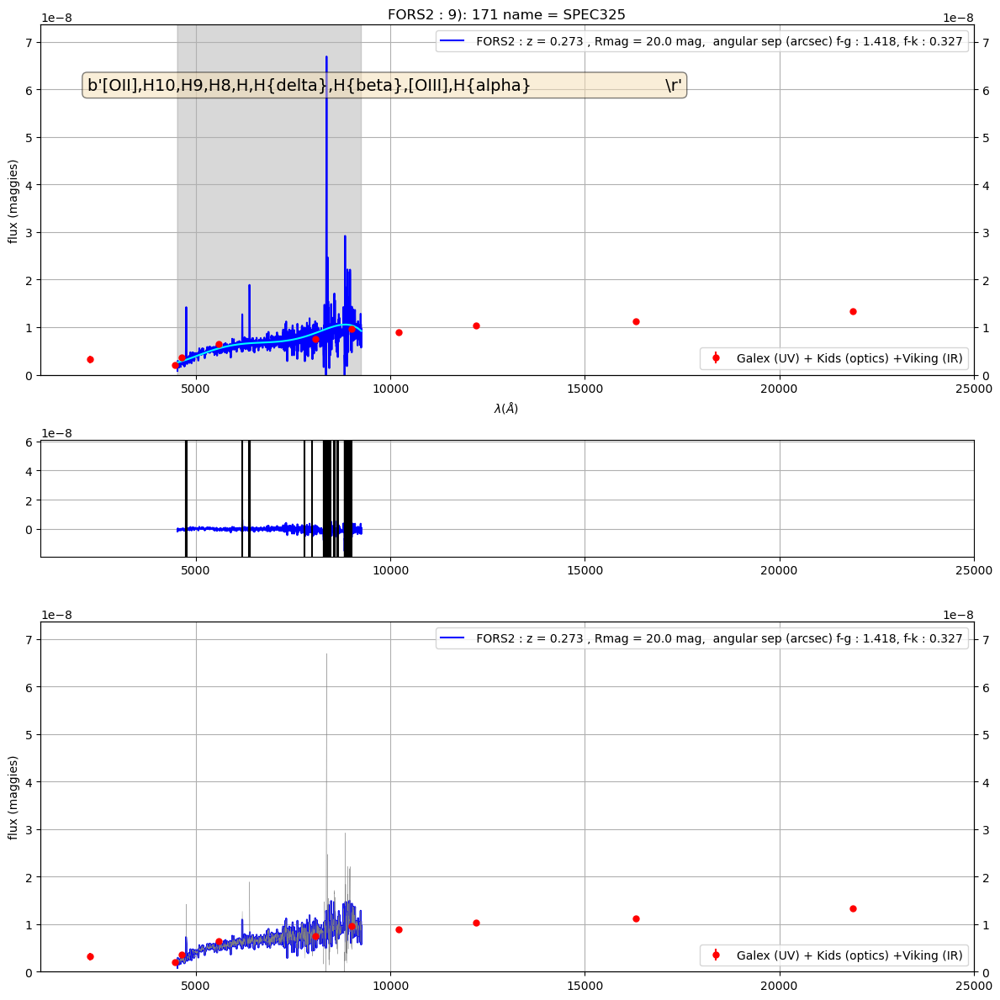

10  ==  SPEC326 326 172
the_lines =  b'[OII],H9,K,H,[OIII],H{alpha}                                                \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


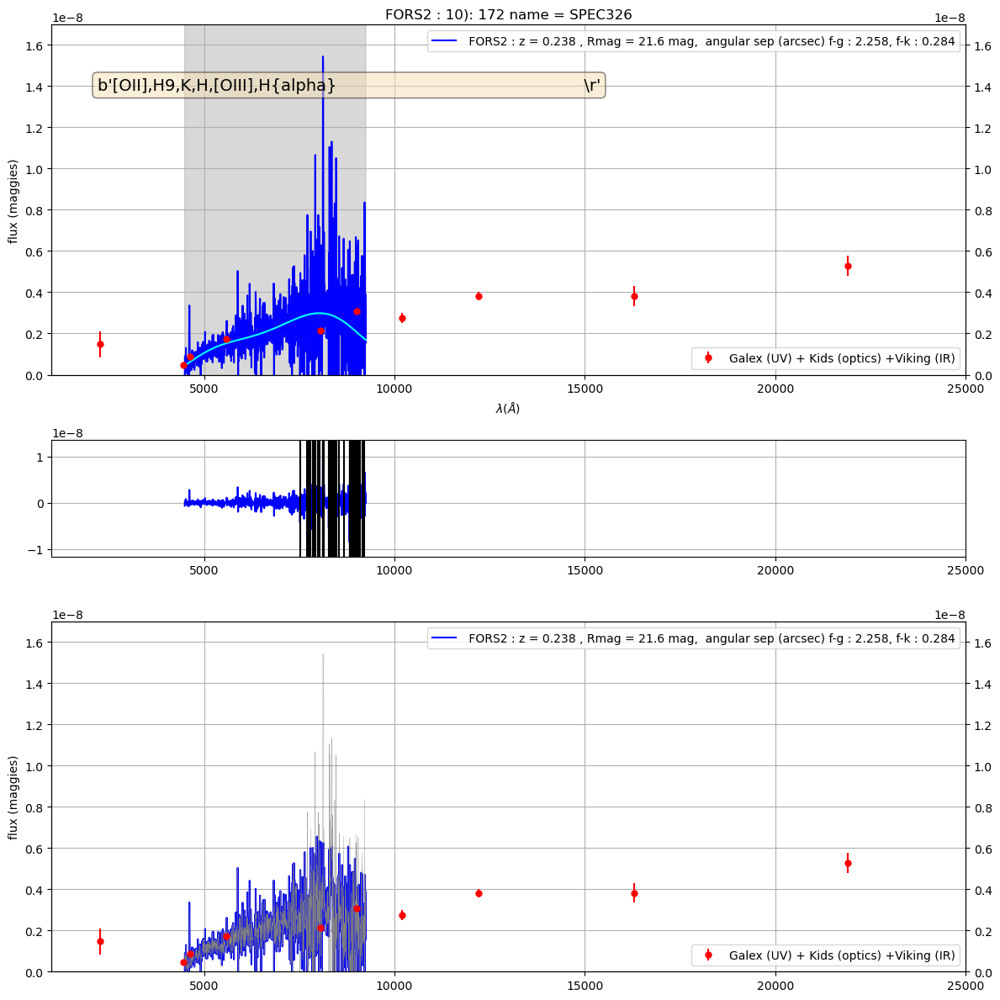

11  ==  SPEC337 337 182
the_lines =  b'[OII],H                                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


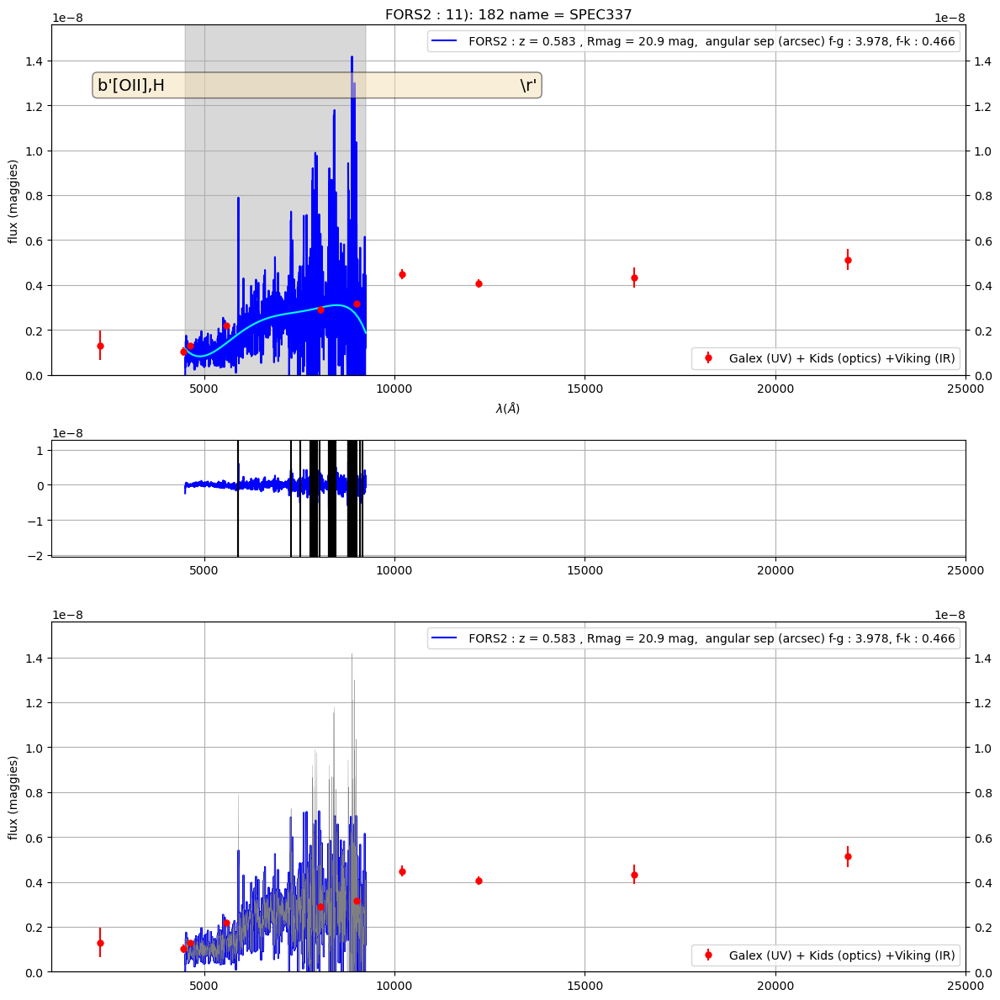

12  ==  SPEC350 350 193
the_lines =  b'[OII],H{beta},[OIII]                                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


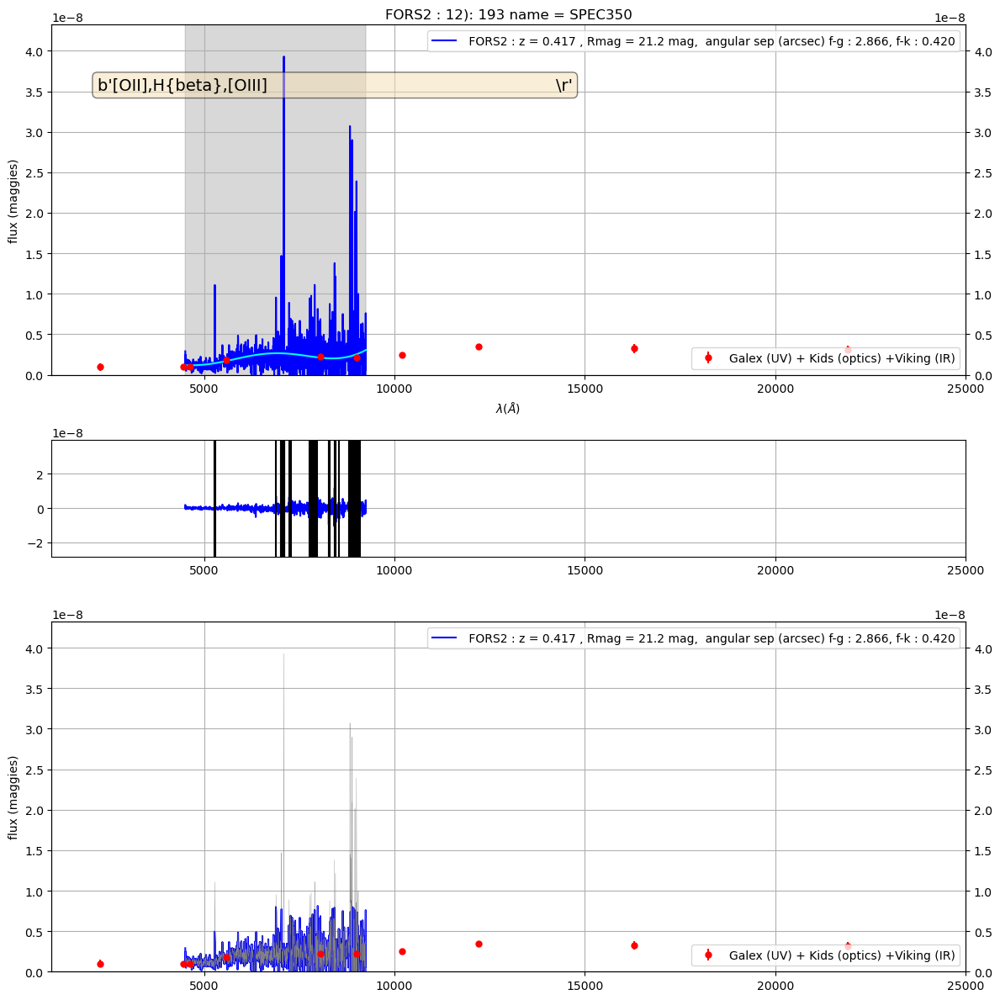

13  ==  SPEC363 363 205
the_lines =  b'H9,H8,H,H{delta},[OIII],H{alpha}                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


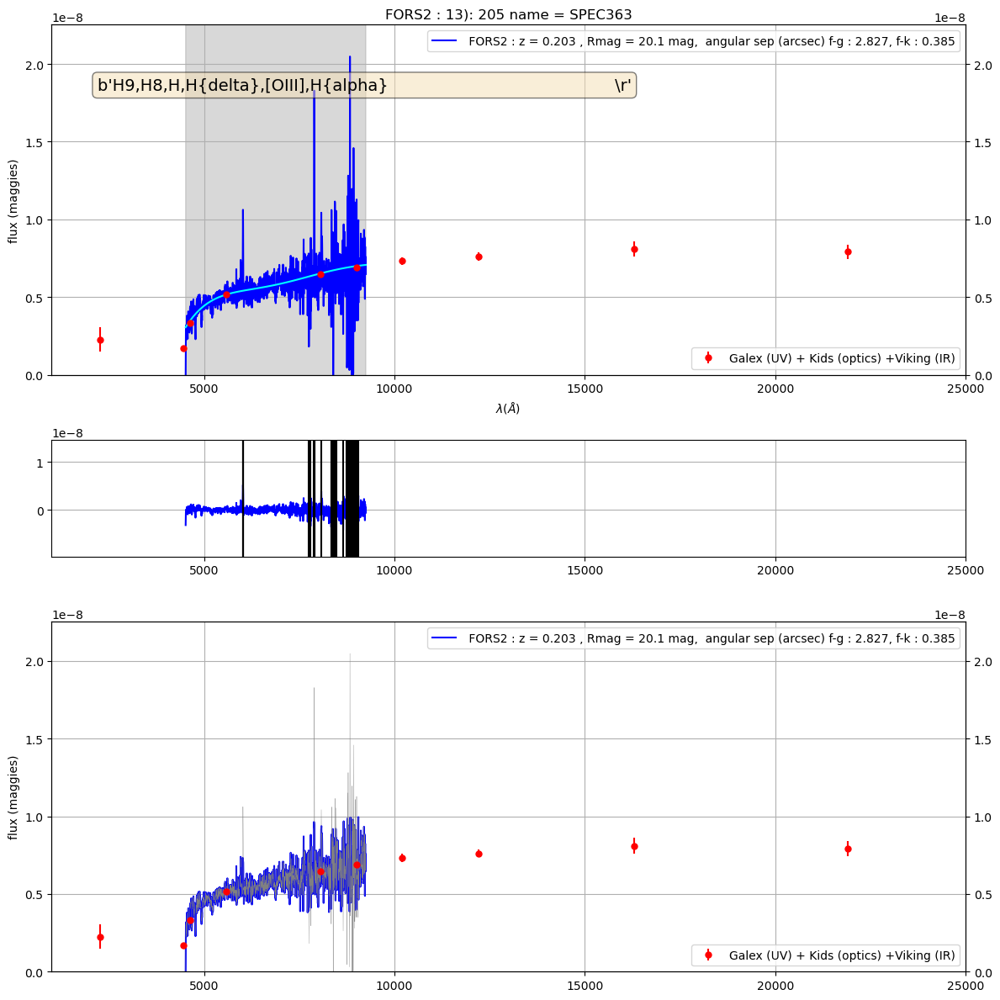

14  ==  SPEC368 368 210
the_lines =  b'[OII],H{delta},H{beta},[OIII]                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


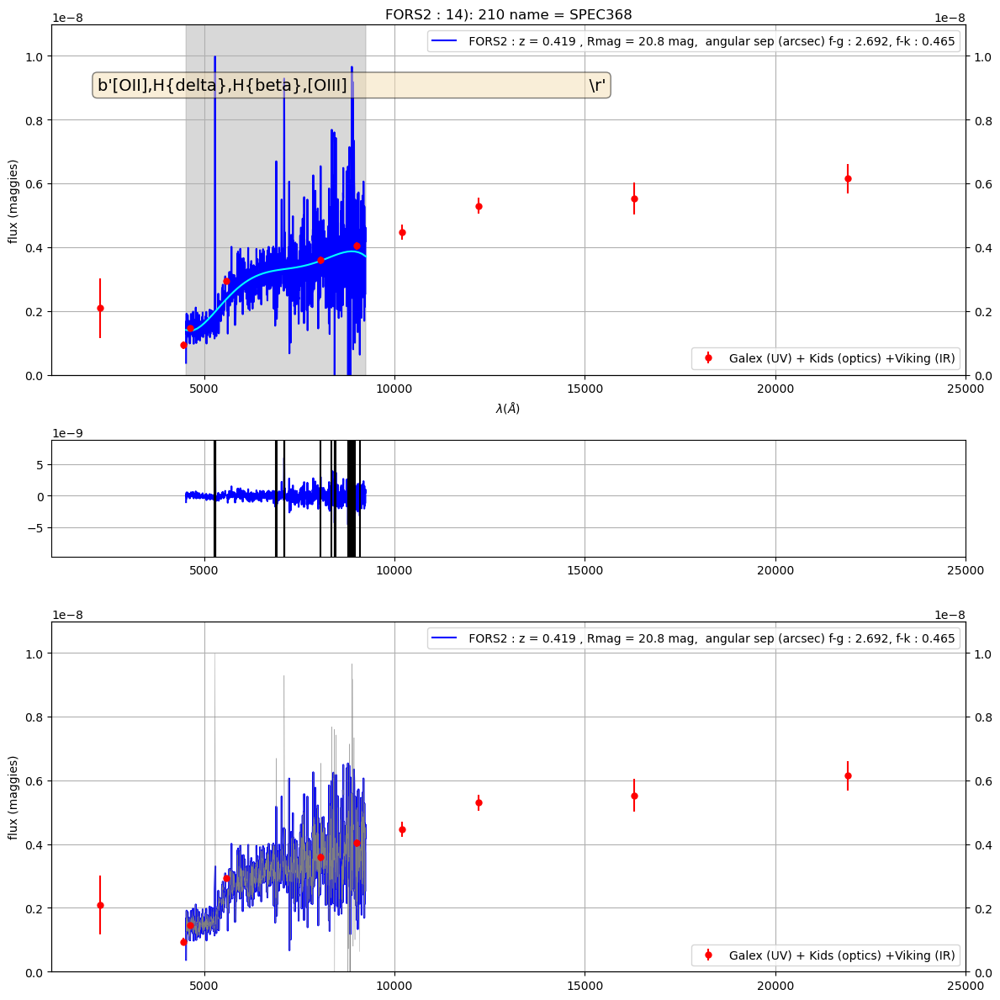

15  ==  SPEC373 373 215
the_lines =  b'[OII],H9,K,H,H{beta},[OIII],H{alpha}                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


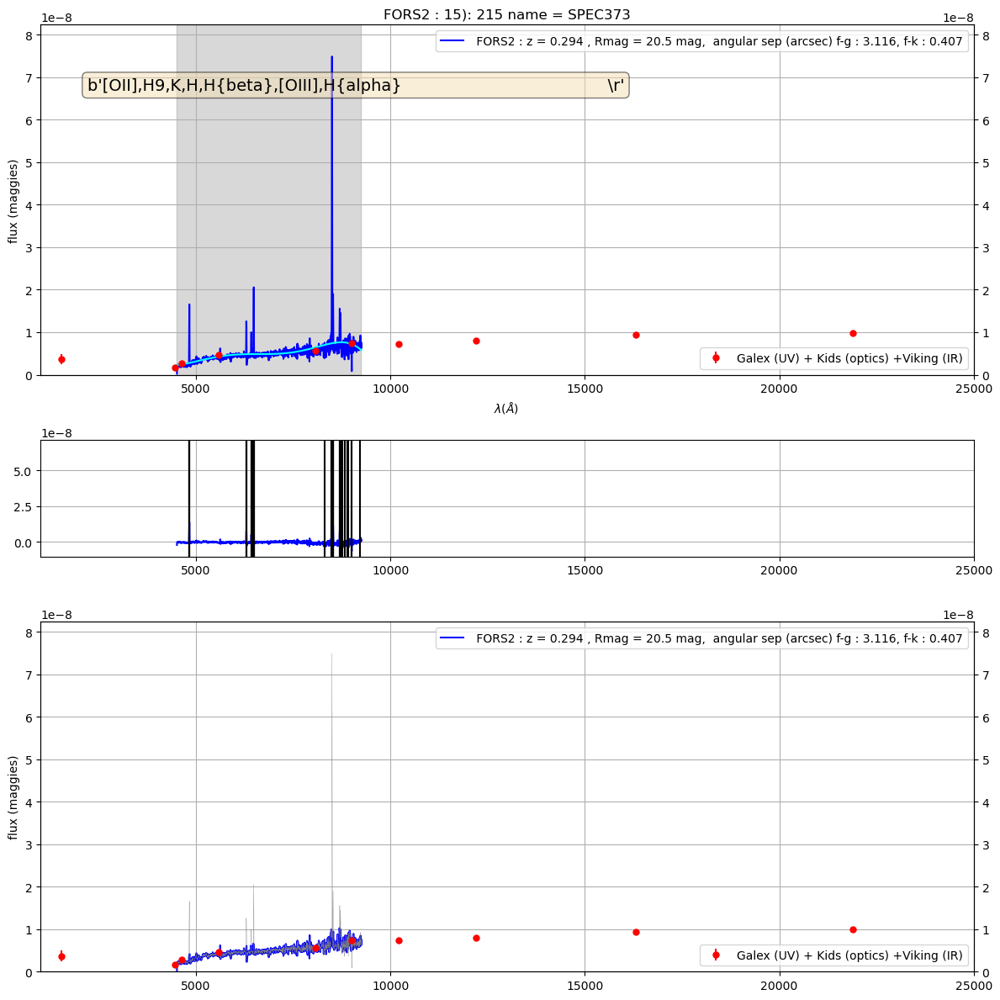

16  ==  SPEC386 386 228
the_lines =  b'[OII],H,H{delta}                                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


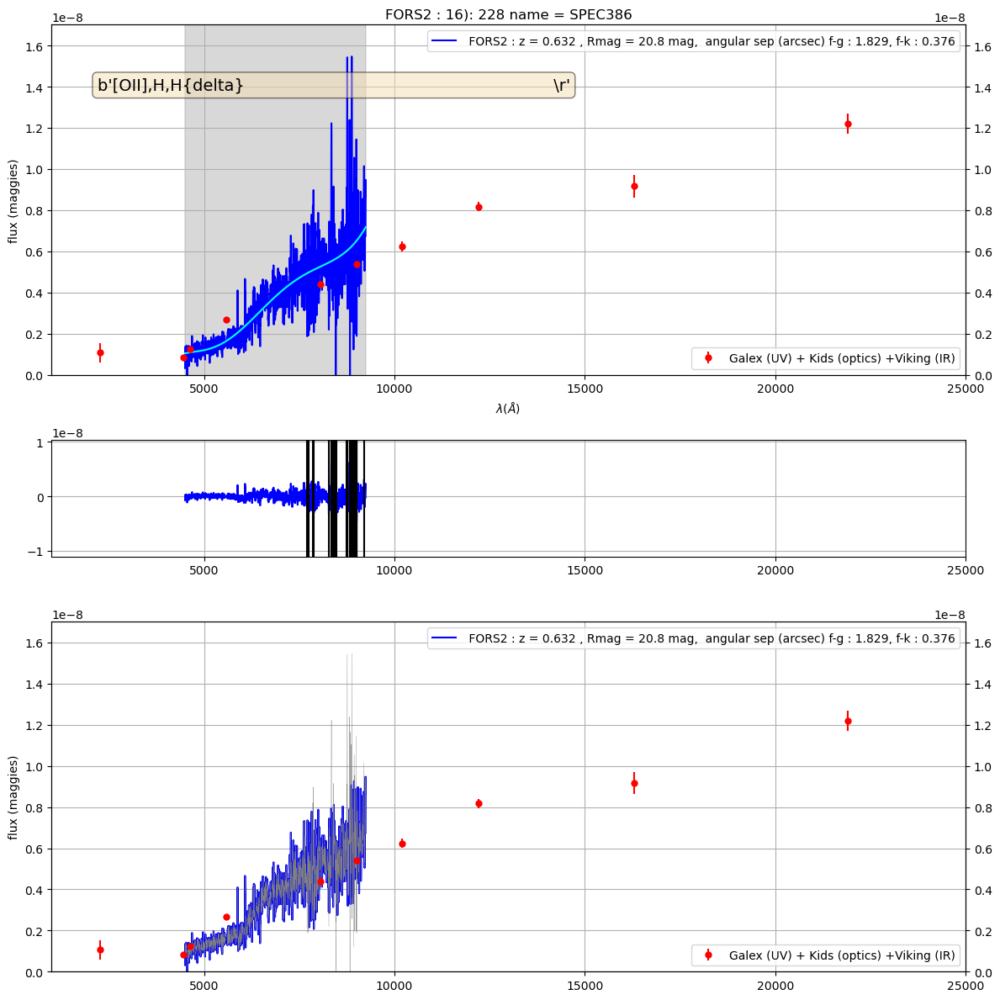

17  ==  SPEC390 390 232
the_lines =  b'[OII],H,H{beta},[OIII]                                                      \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


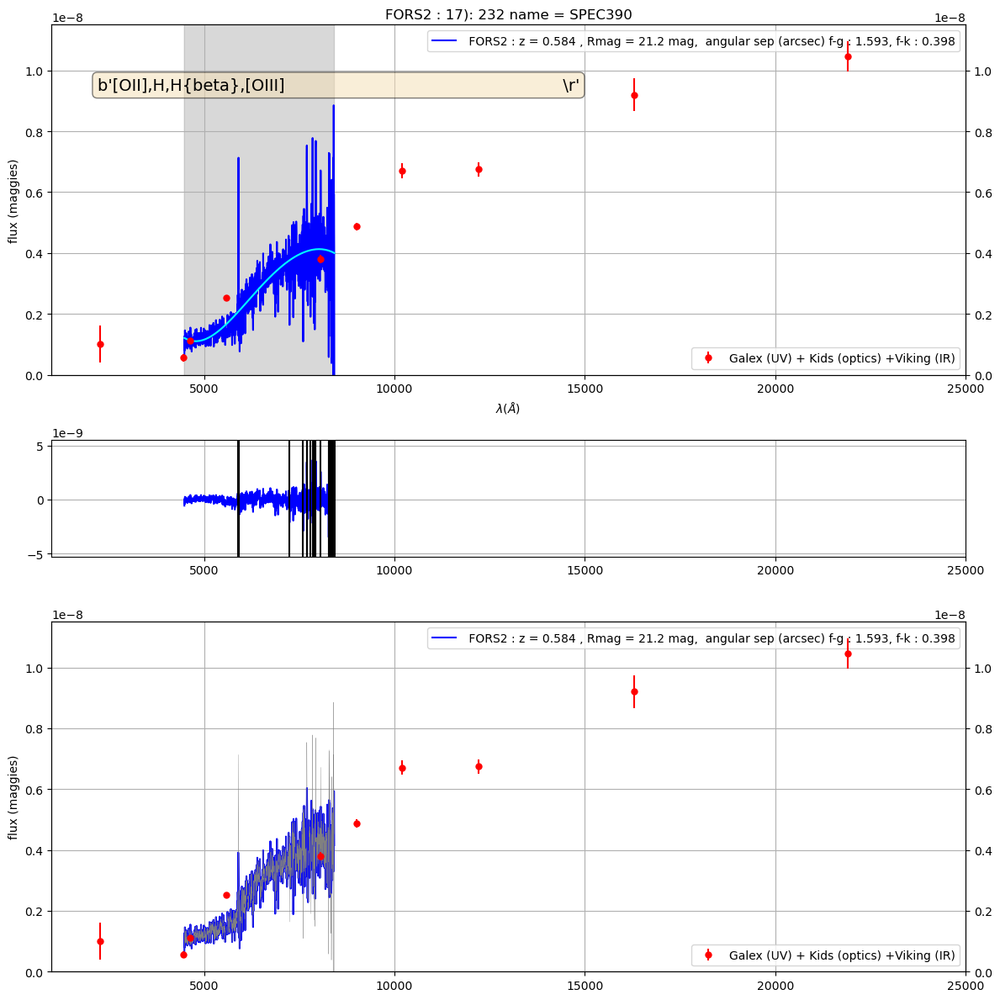

18  ==  SPEC399 399 241
the_lines =  b'[OII],H{gamma},H{beta},[OIII],H{alpha}                                      \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


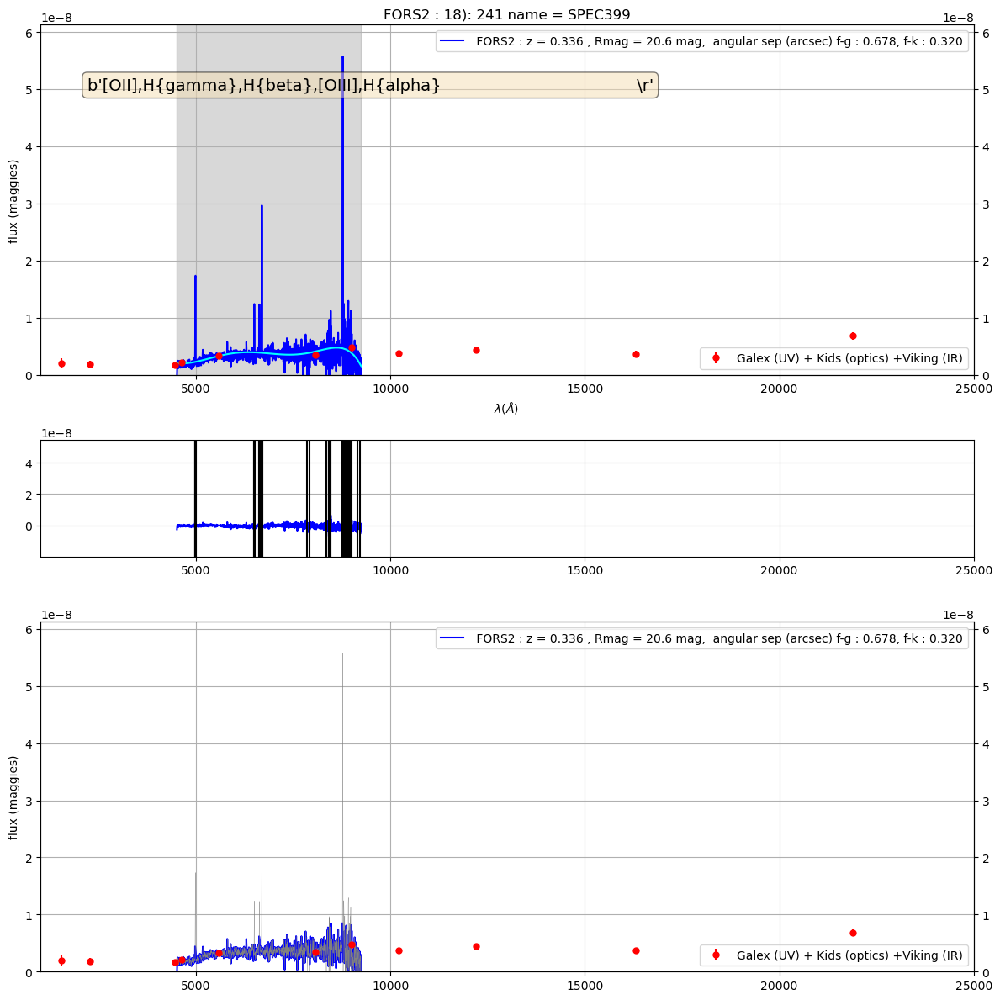

19  ==  SPEC401 401 243
the_lines =  b'[OII],H,H{beta}                                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


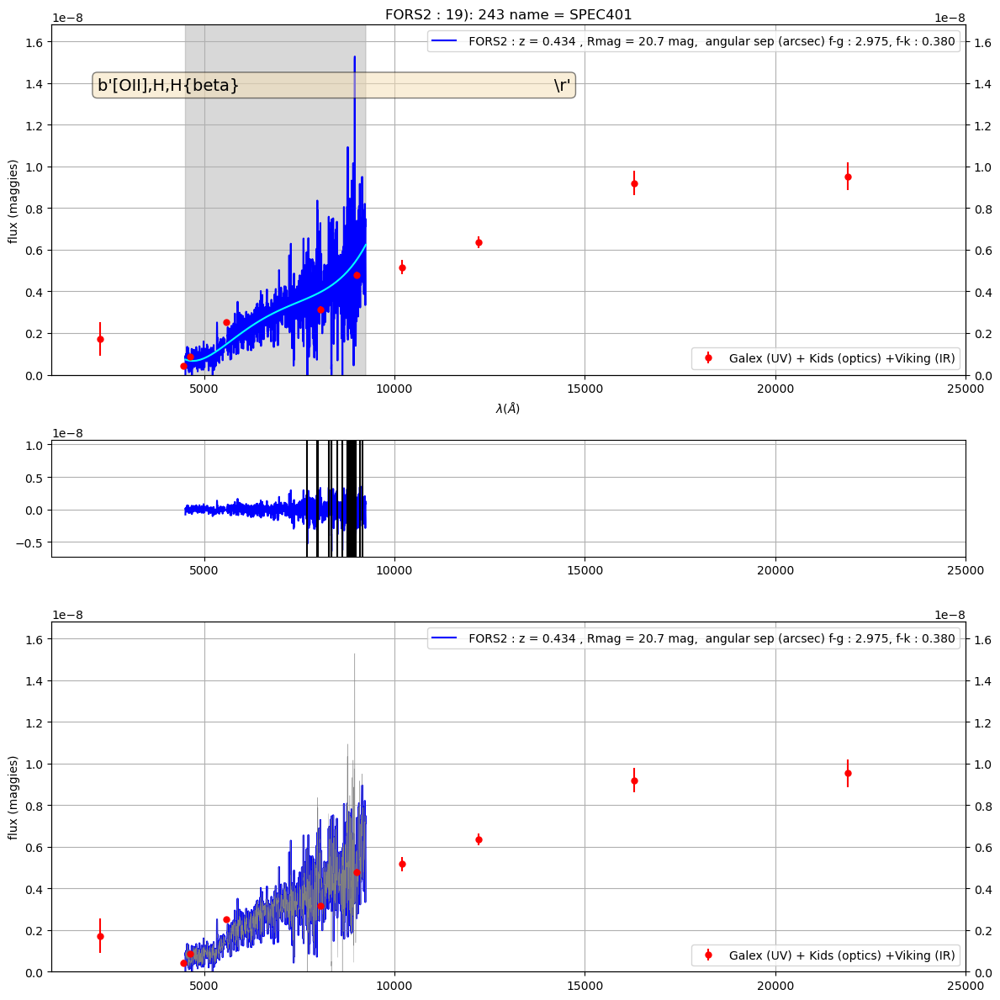

20  ==  SPEC402 402 244
the_lines =  b'[OII],H9,K,H,H{delta}                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


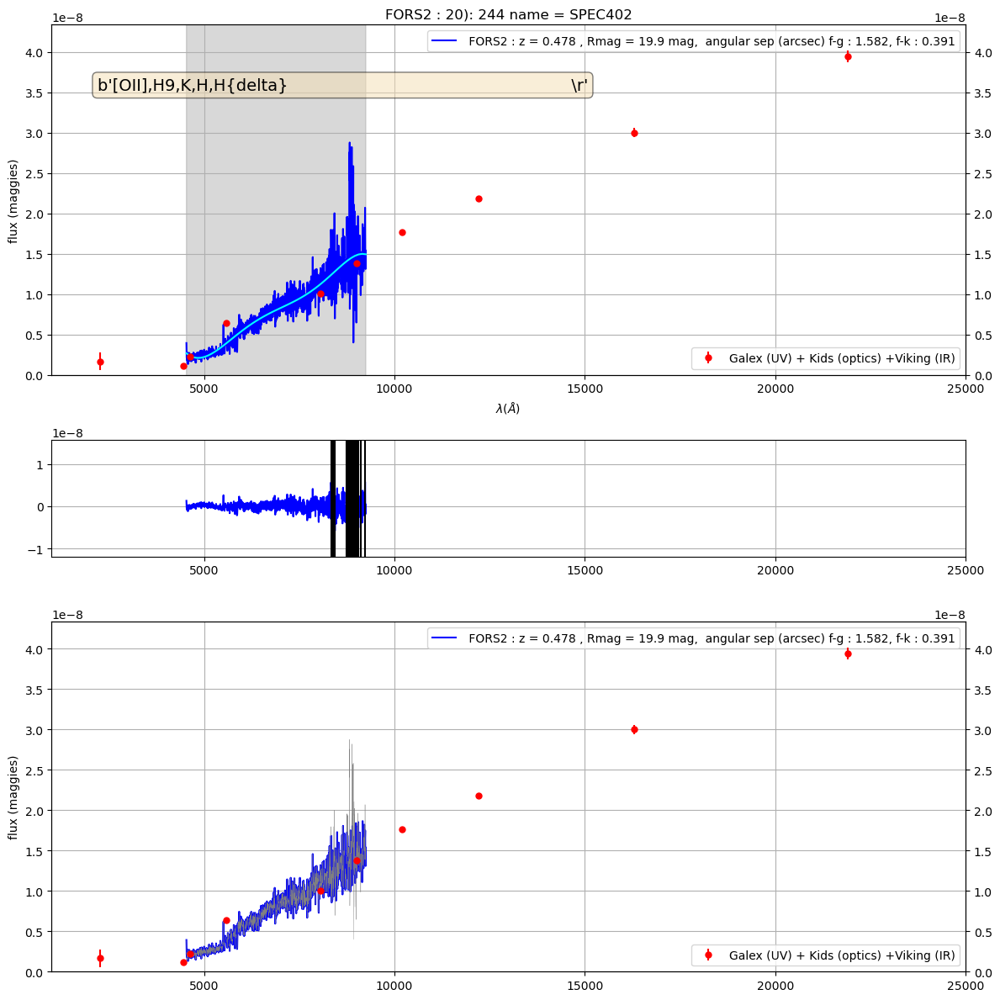

21  ==  SPEC403 403 245
the_lines =  b'[OII],H,H{alpha}                                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


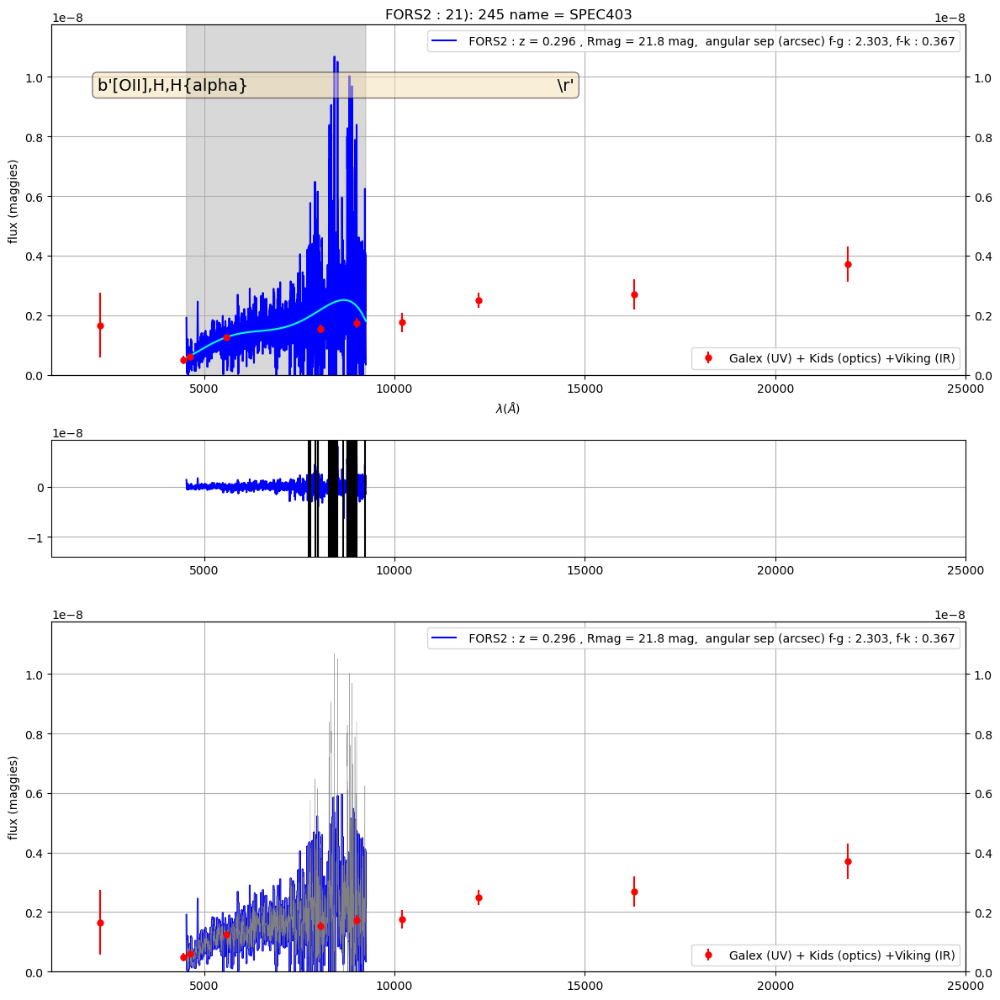

22  ==  SPEC411 411 253
the_lines =  b'[OII],H8,K,H,H{delta}                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


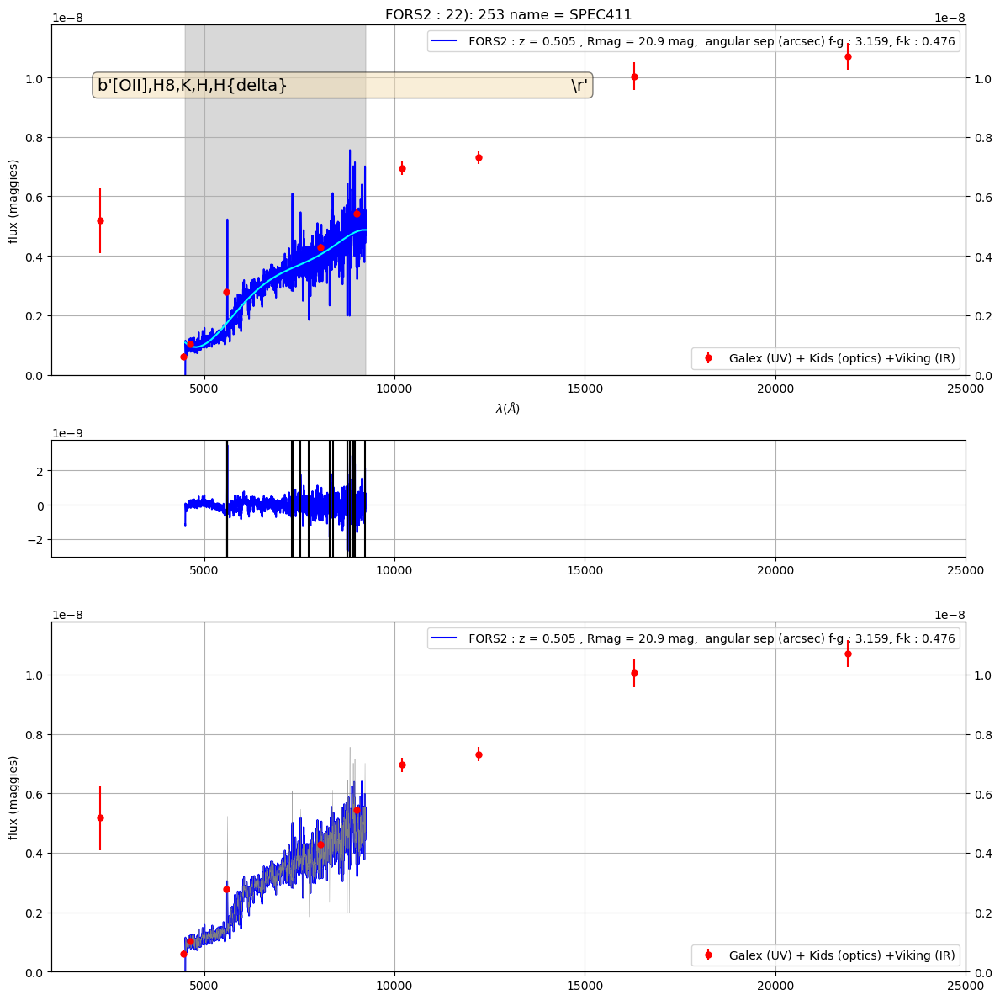

23  ==  SPEC414 414 256
the_lines =  b'MgII,[OII],H10,H9,H8,H,H{delta}                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


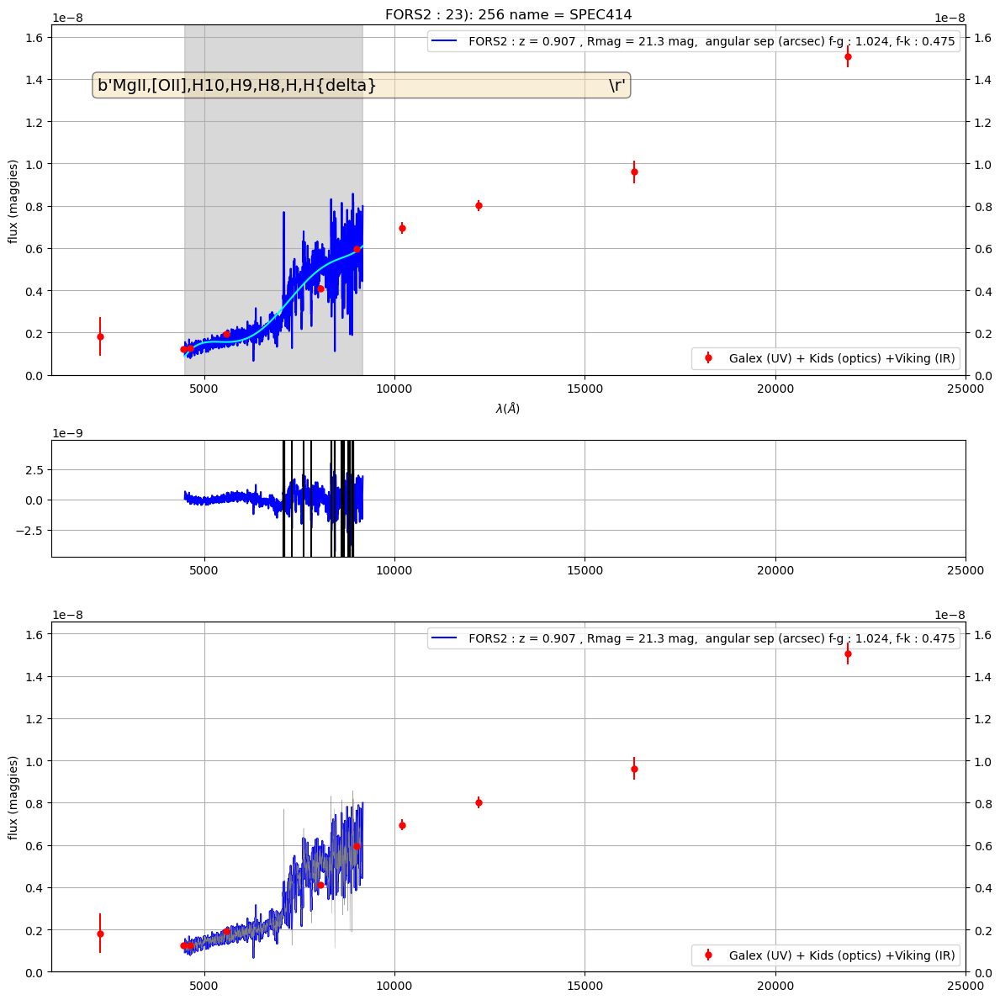

24  ==  SPEC415 415 257
the_lines =  b'[OIII],H{alpha}                                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


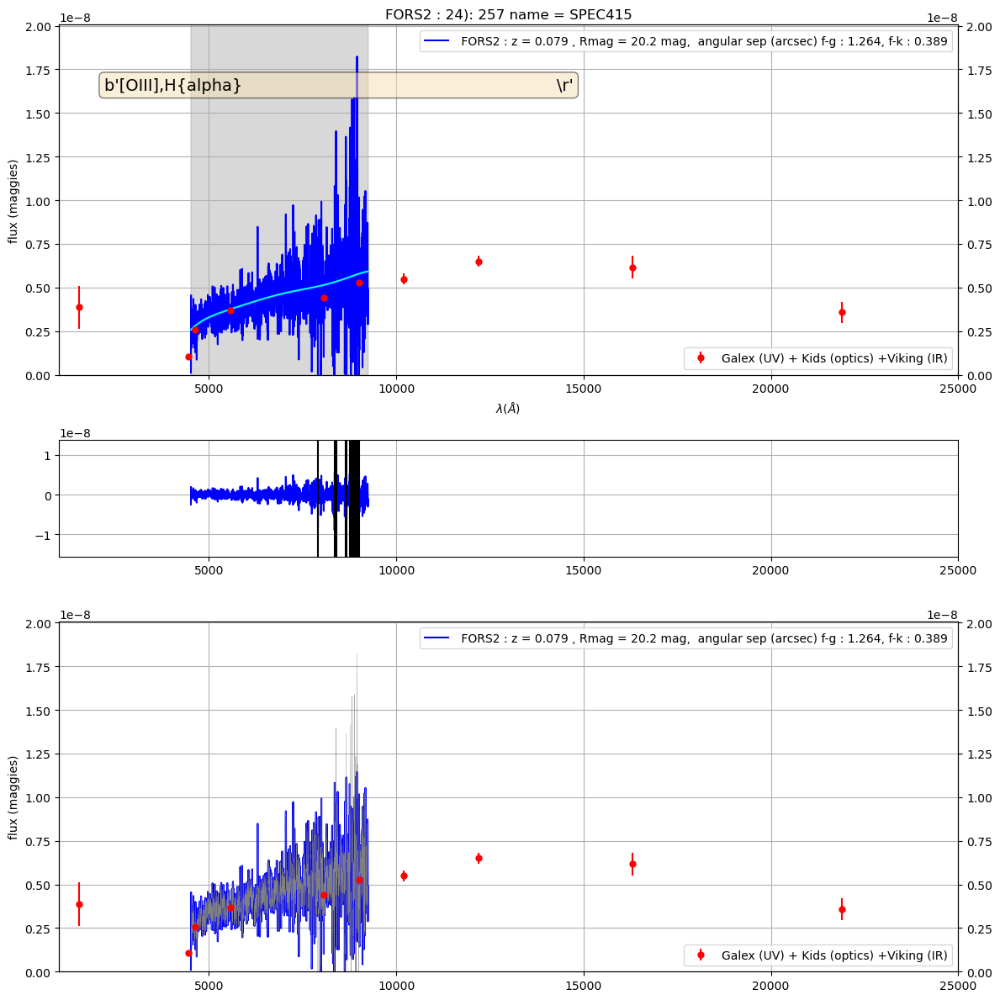

25  ==  SPEC421 421 263
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


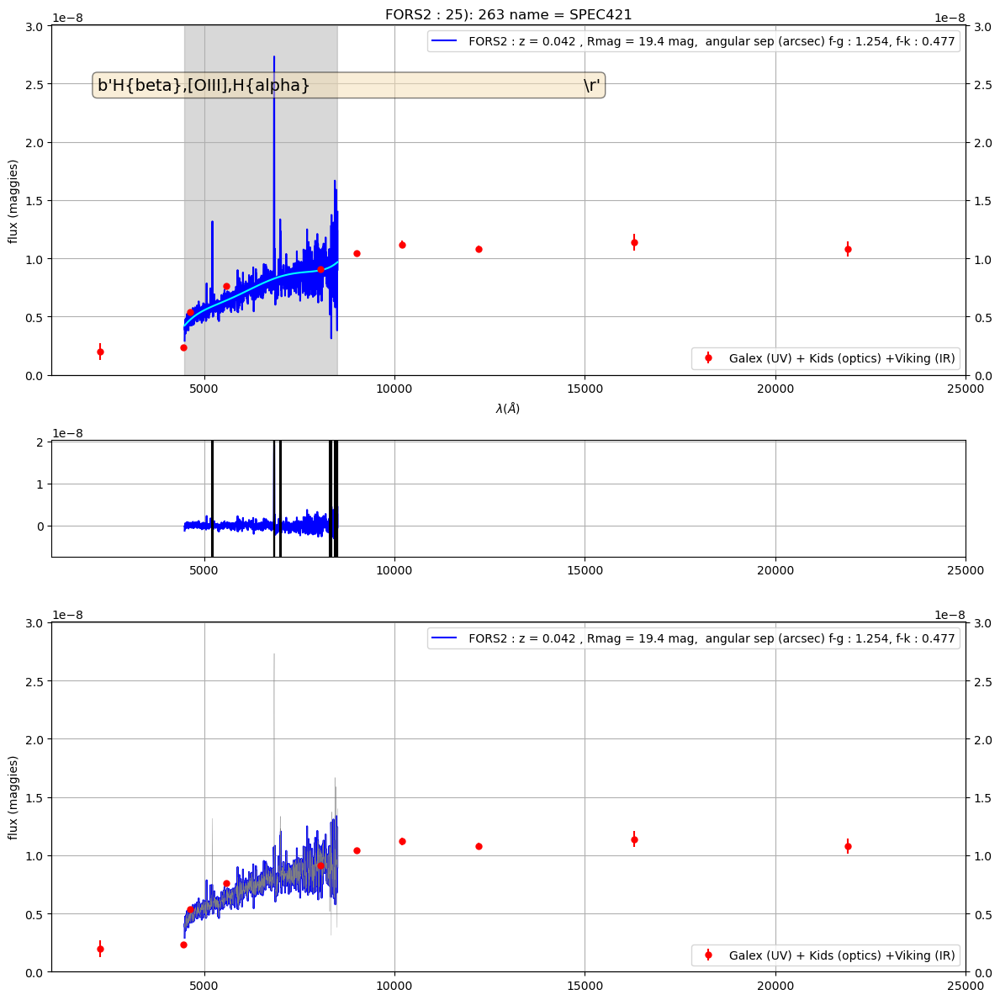

26  ==  SPEC434 434 275
the_lines =  b'[OII],H{beta},[OIII],H{alpha}                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


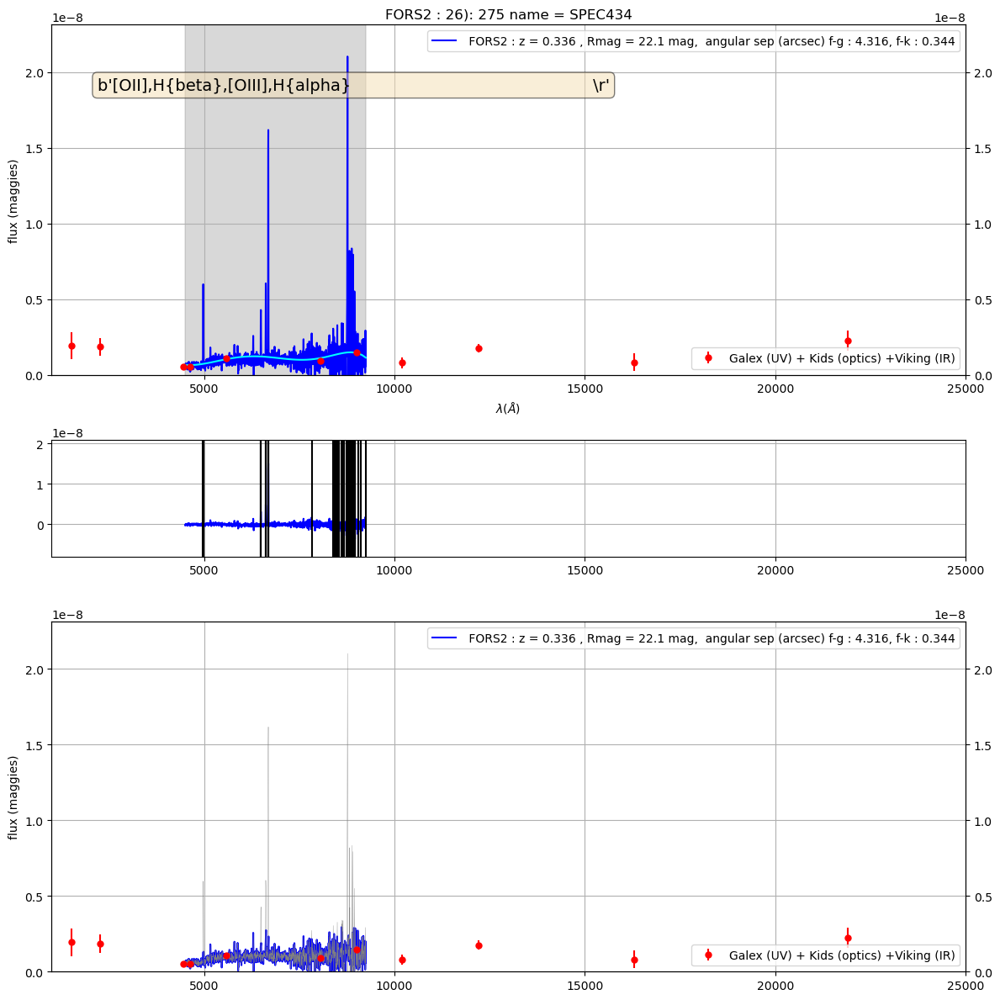

27  ==  SPEC435 435 276
the_lines =  b'[OII],K,H,H{beta},[OIII],H{alpha}                                           \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


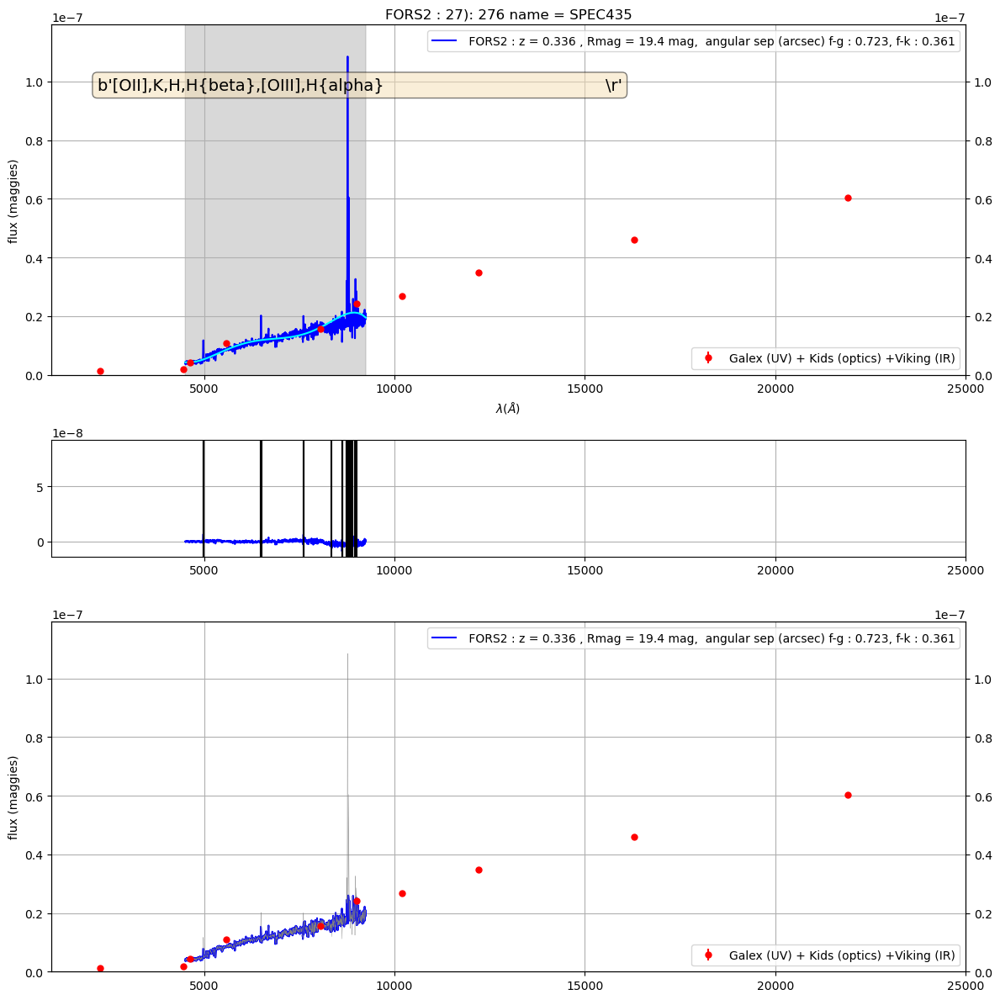

28  ==  SPEC437 437 278
the_lines =  b'[OII],H{beta},[OIII],H{alpha}                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


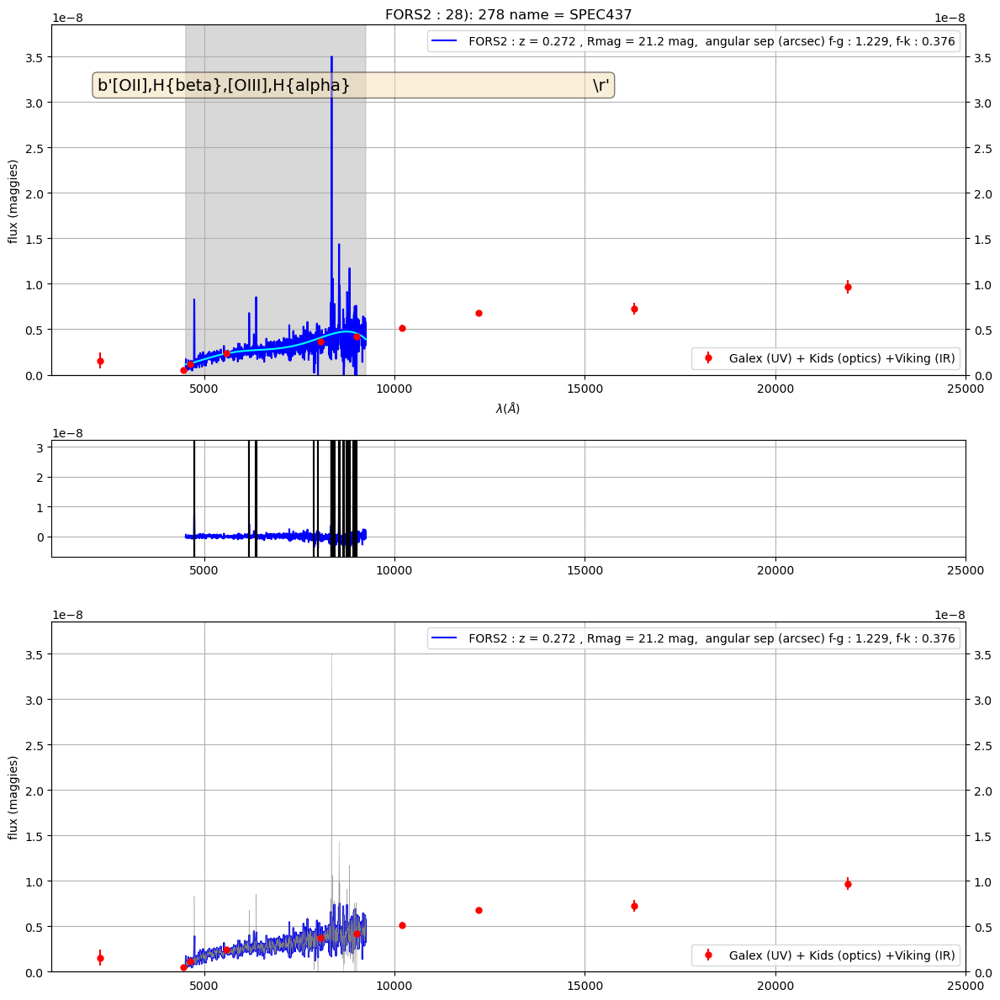

29  ==  SPEC444 444 285
the_lines =  b'[OII],K,H,H{beta}                                                           \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


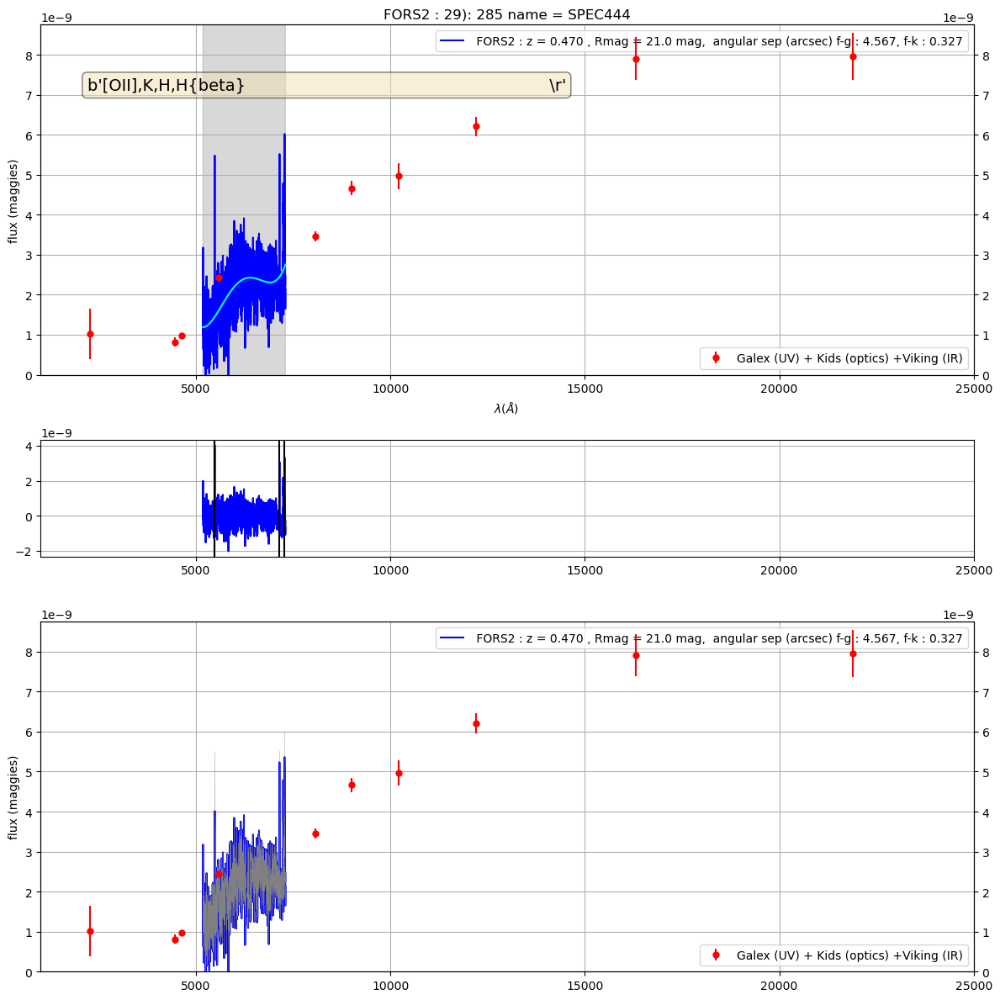

30  ==  SPEC451 451 292
the_lines =  b'K,H,4000{AA}-break,H{delta}                                                 \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


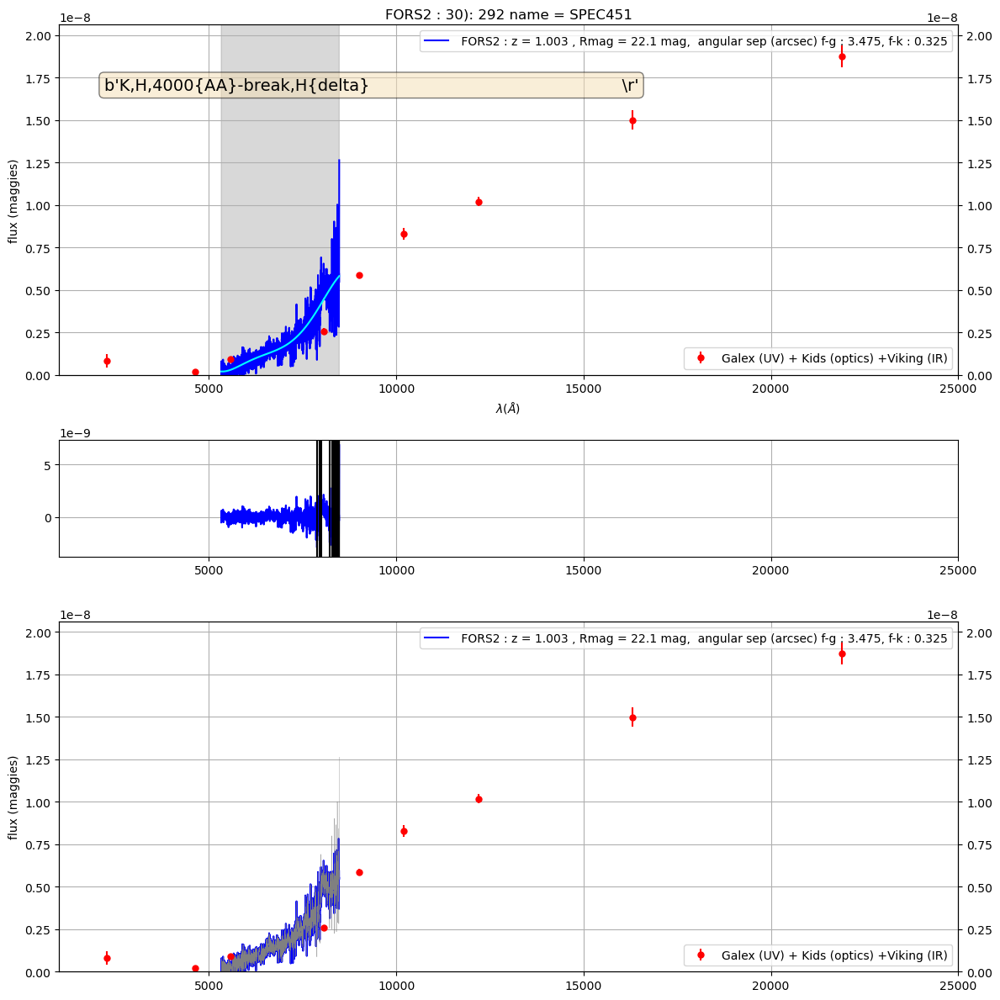

31  ==  SPEC471 471 312
the_lines =  b'[OII],H{beta},[OIII]                                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


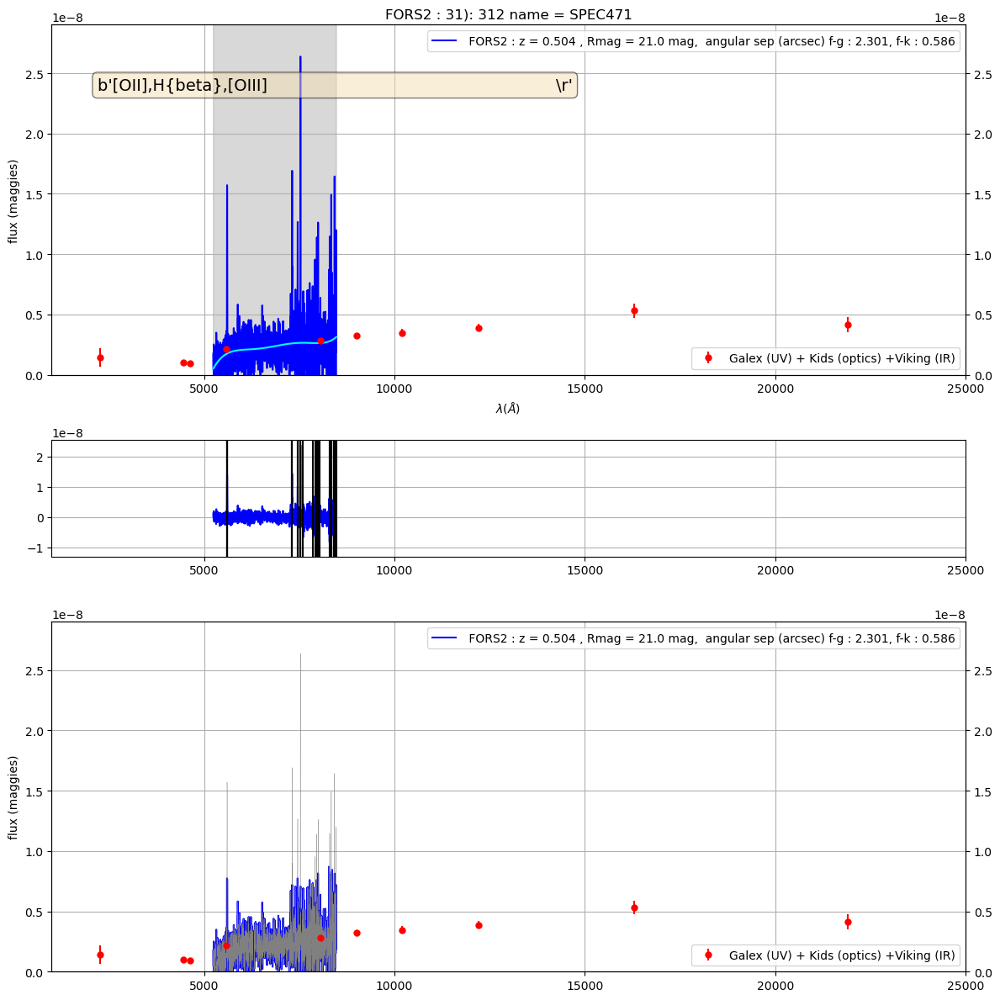

32  ==  SPEC472 472 313
the_lines =  b'[OII],H{beta},[OIII]                                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


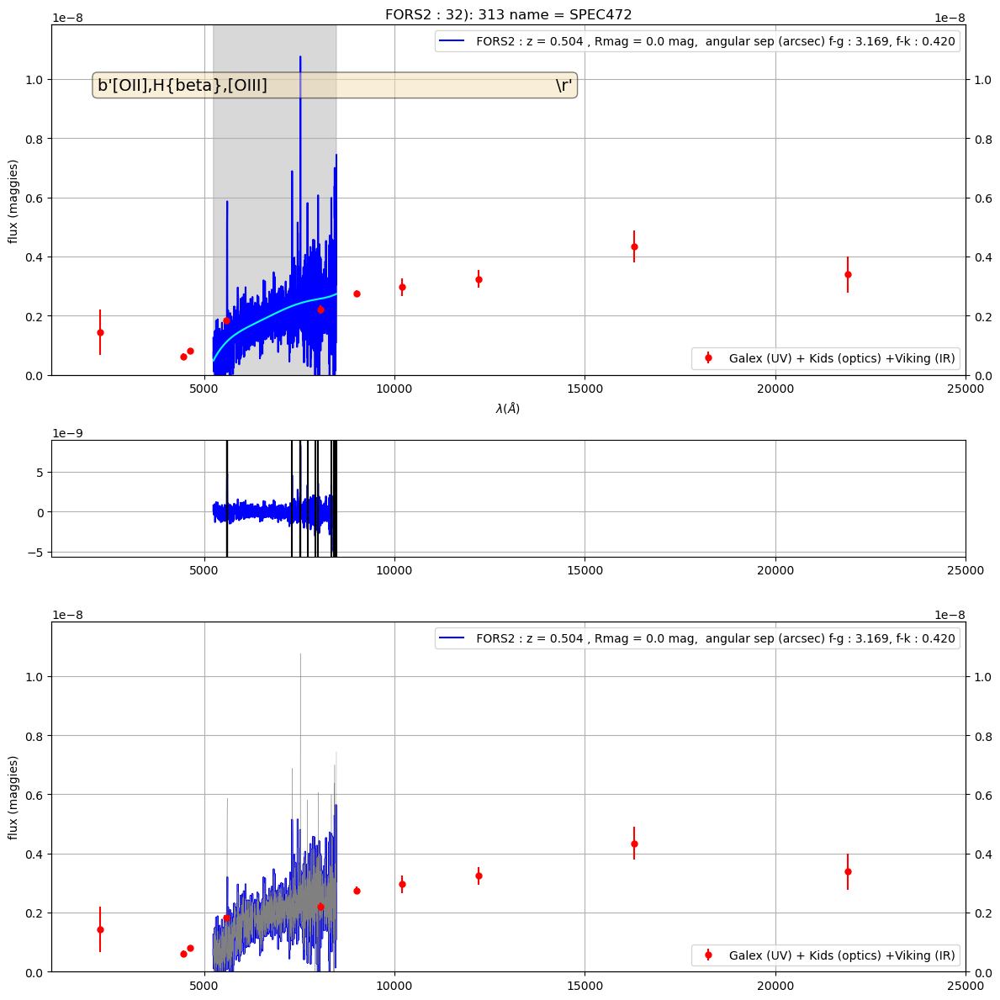

33  ==  SPEC476 476 316
the_lines =  b'[OIII],H{alpha}                                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


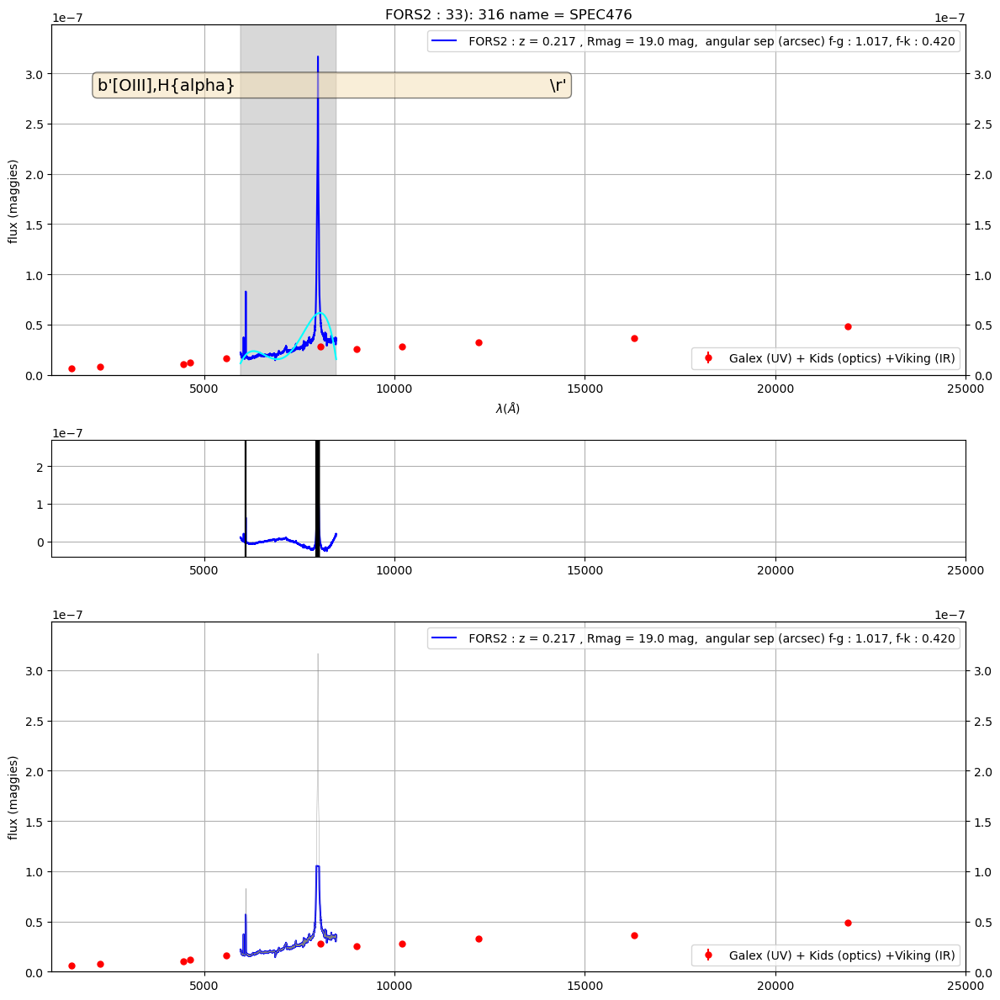

34  ==  SPEC499 499 331
the_lines =  b'[OII],H{beta},[OIII]                                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


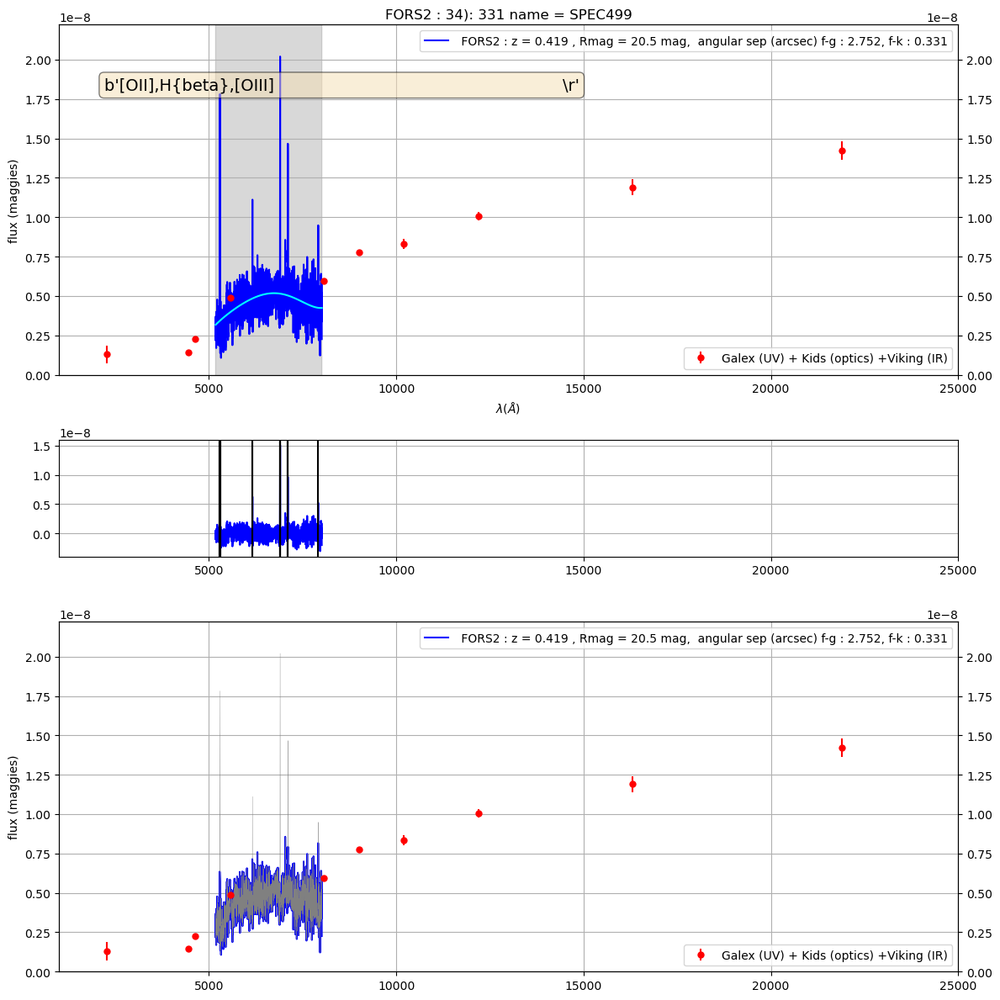

35  ==  SPEC516 516 345
the_lines =  b'                                                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


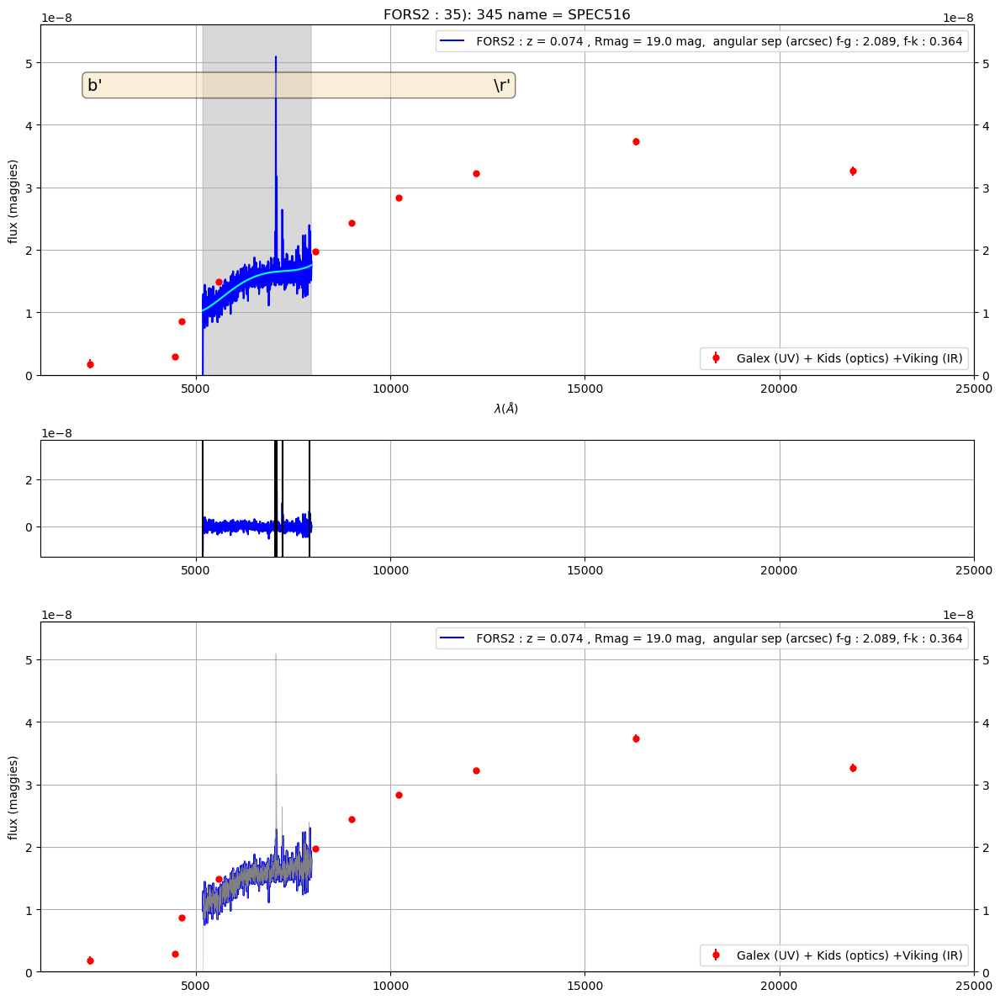

36  ==  SPEC519 519 348
the_lines =  b'K,H,G,Fe43,Fe45,H{beta},Mgb                                                 \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


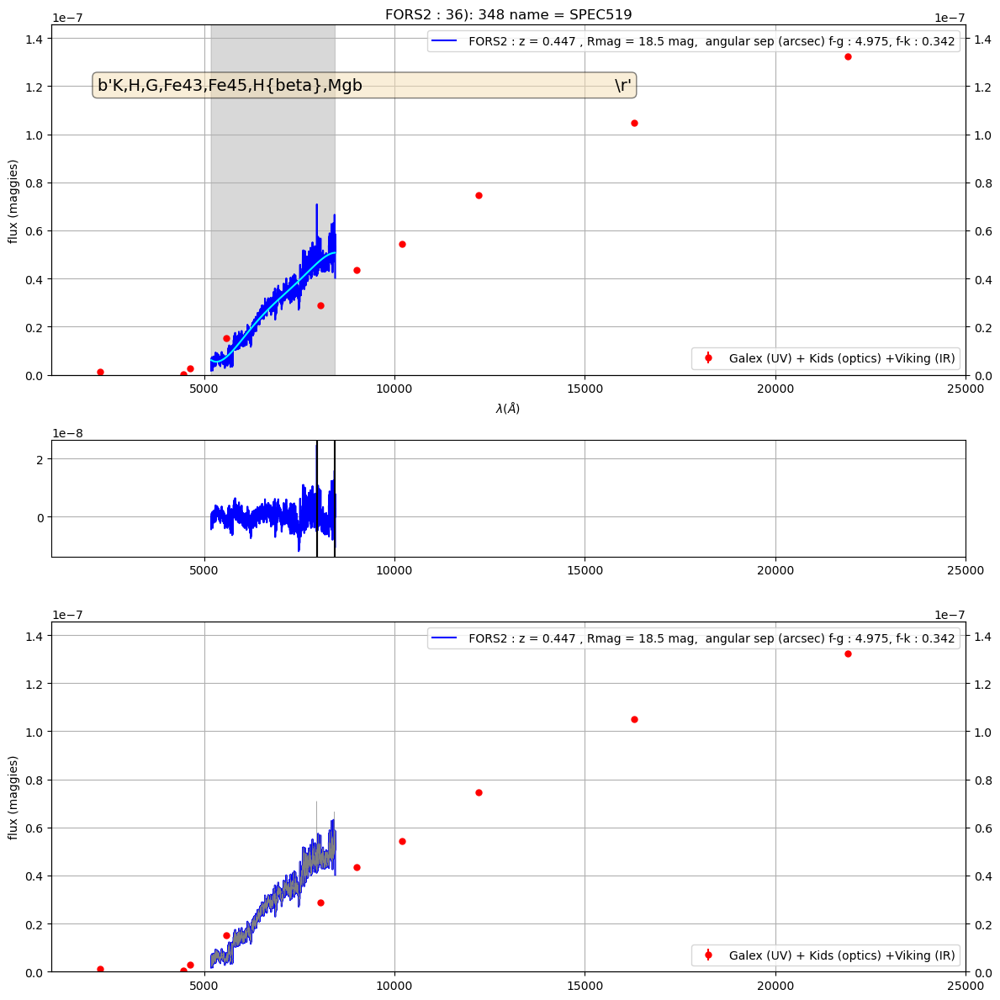

37  ==  SPEC558 558 382
the_lines =  b'[OII],H9,K,H,H{beta},[OIII]                                                 \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


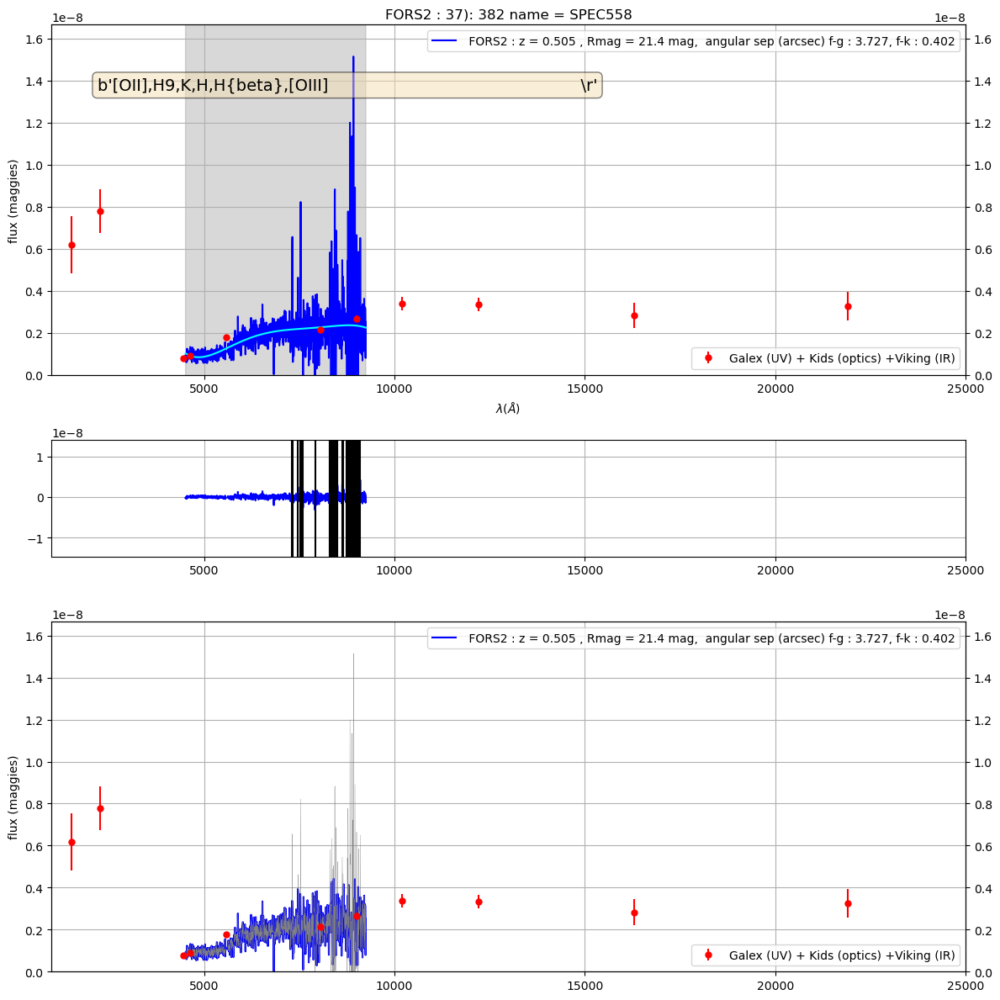

38  ==  SPEC560 560 384
the_lines =  b'G,H{beta},Mgb,NaD                                                           \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


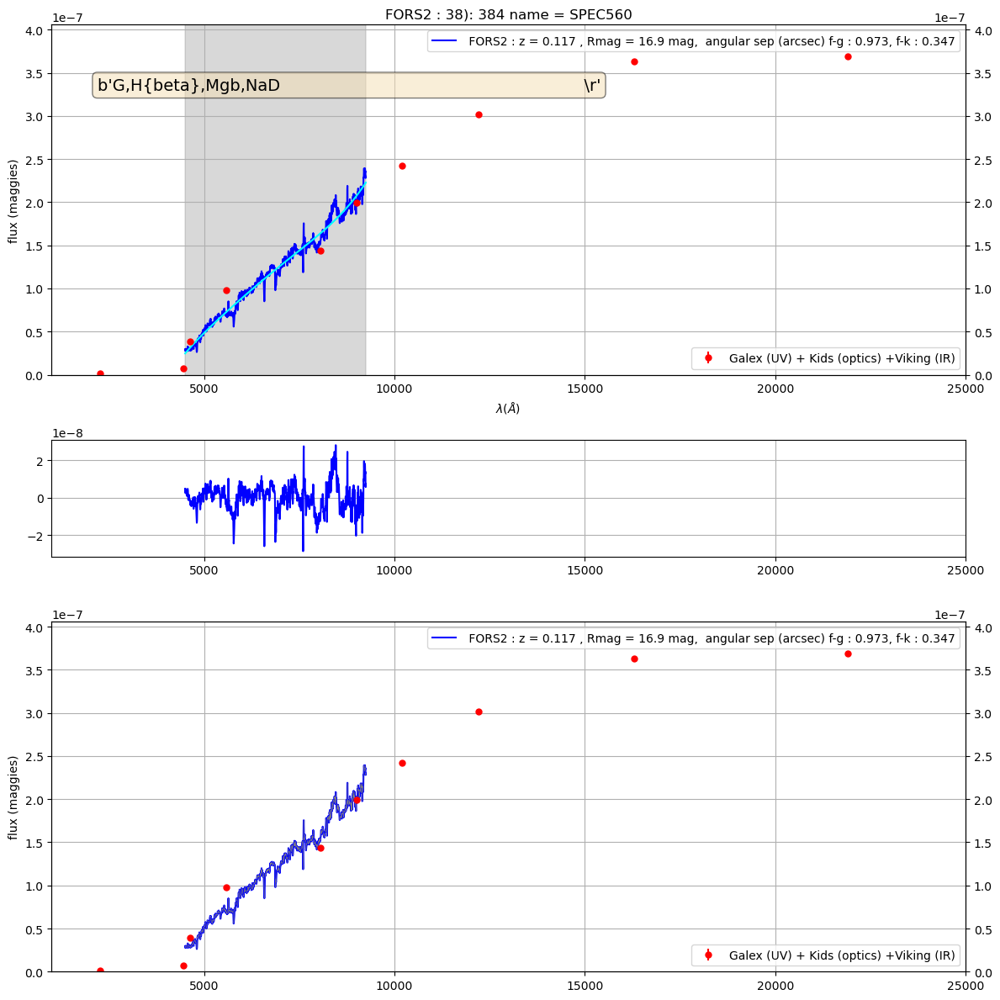

39  ==  SPEC563 563 386
the_lines =  b'H{delta},G,Mgb,NaD,H{alpha}                                                 \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


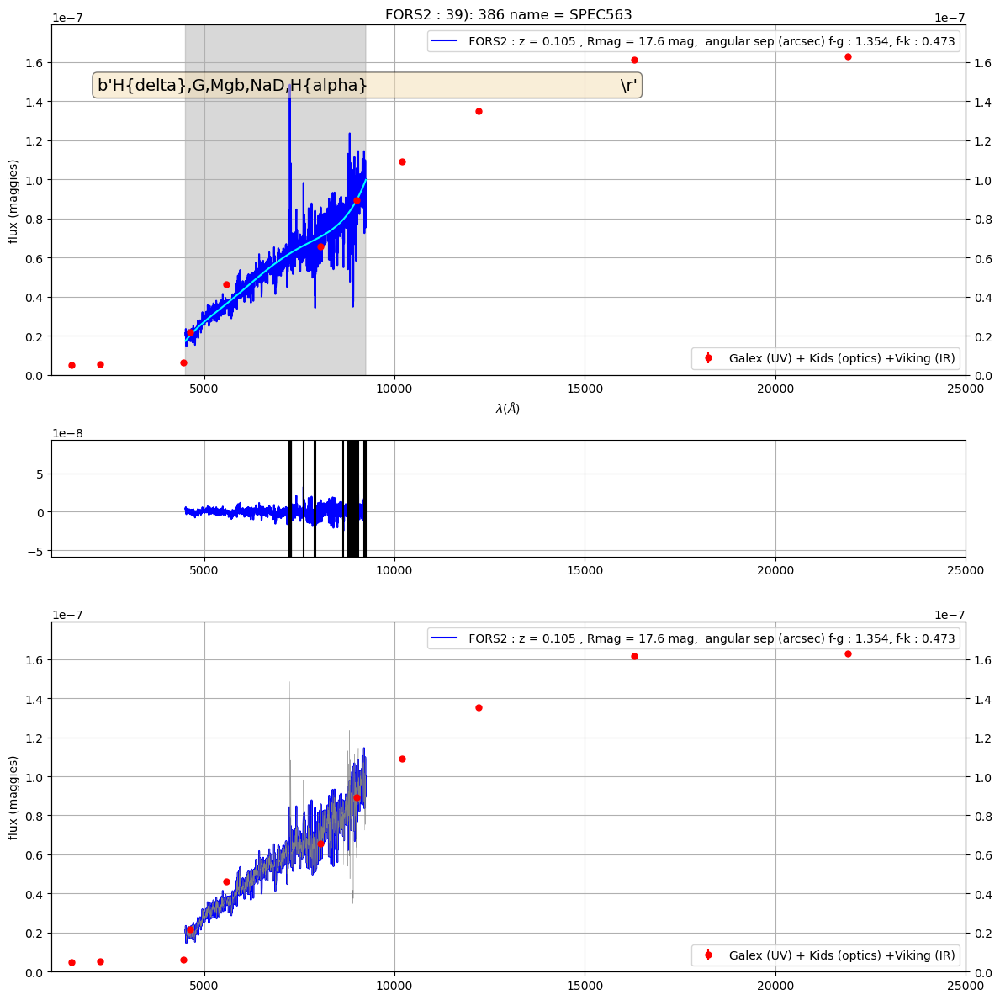

40  ==  SPEC564 564 387
the_lines =  b'[OII],H{delta},H{gamma},H{beta},[OIII],H{alpha}                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


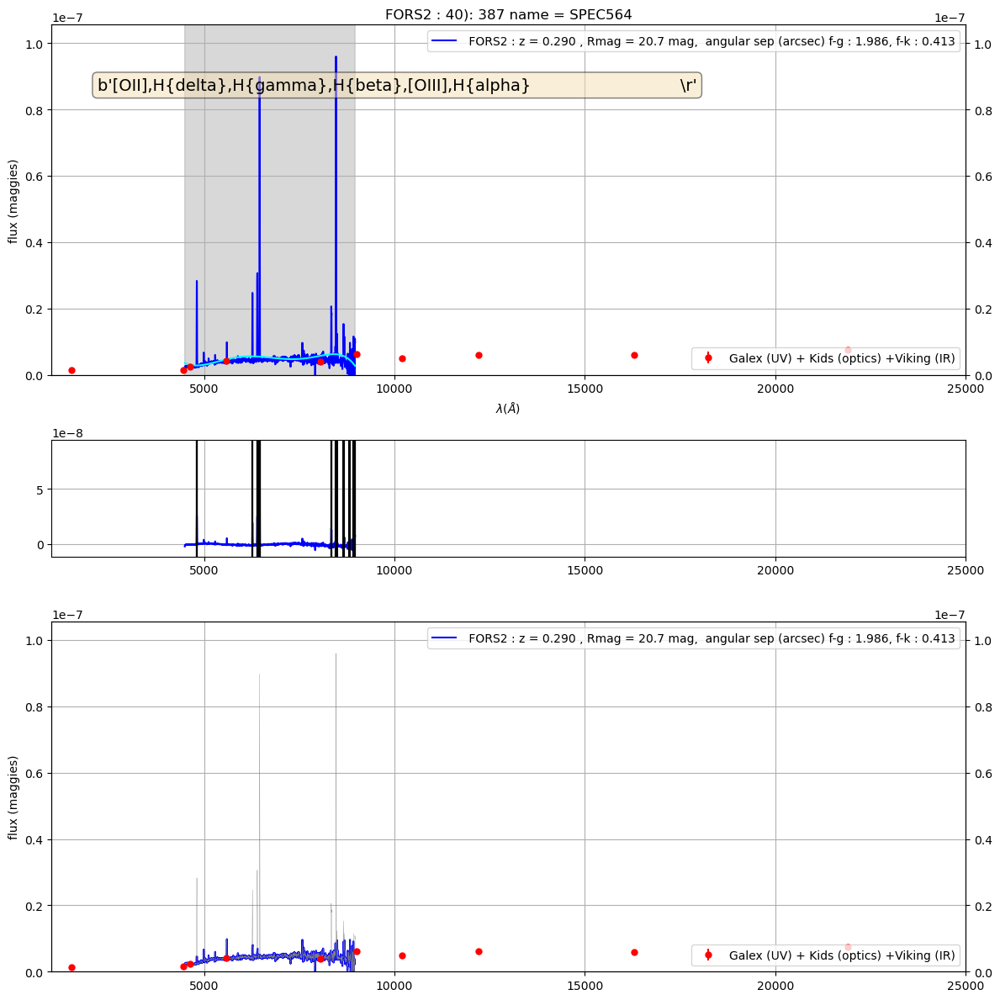

41  ==  SPEC572 572 395
the_lines =  b'[OII],H10,H9,H8,K,H,H{beta},[OIII],H{alpha}                                 \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


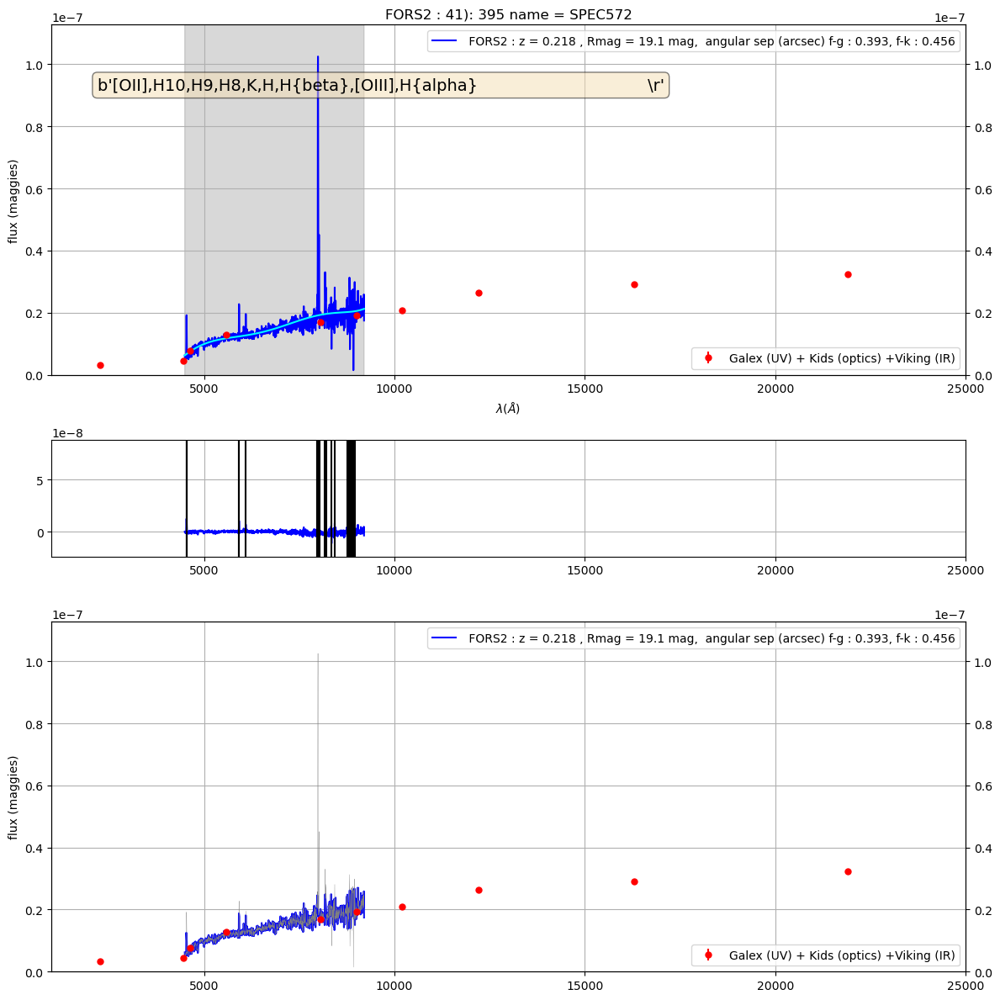

42  ==  SPEC587 587 409
the_lines =  b'[OII],H9,H,H{beta},[OIII]                                                   \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


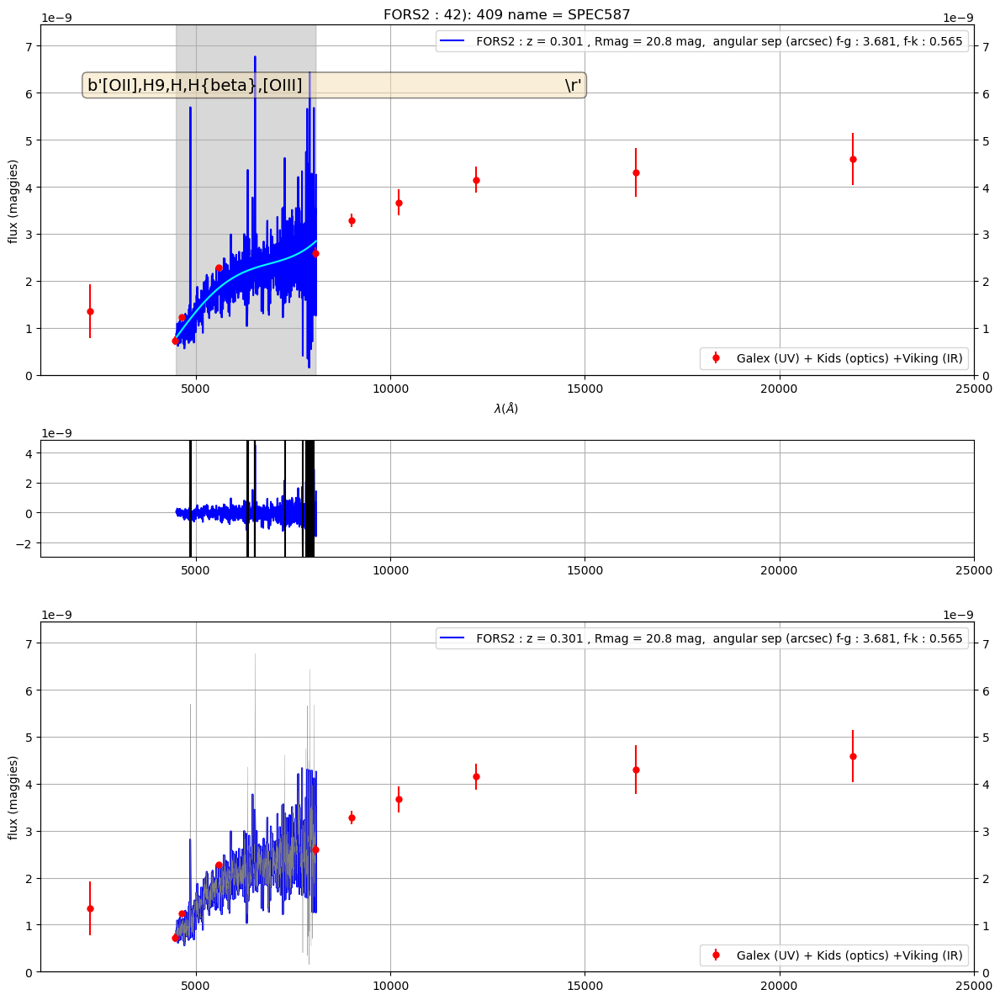

43  ==  SPEC589 589 411
the_lines =  b'[OII],H9,H,H{delta}                                                         \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


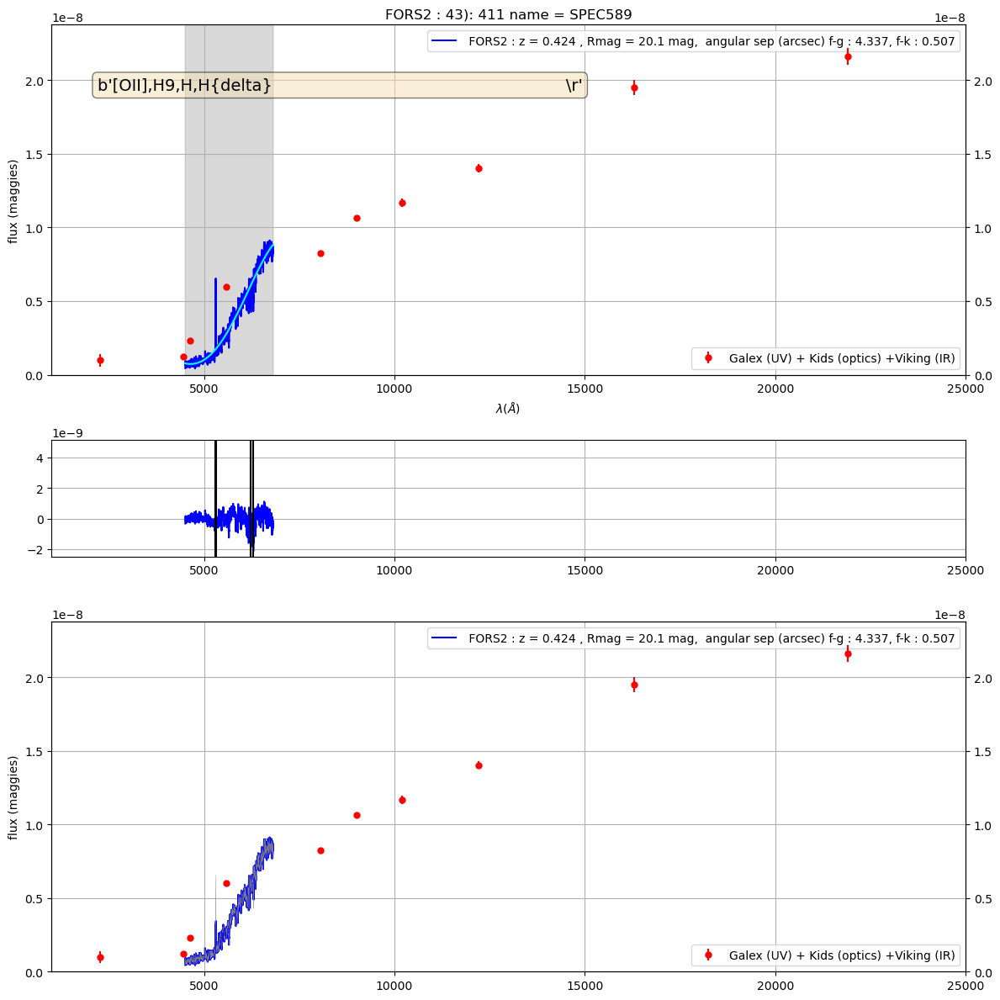

44  ==  SPEC591 591 413
the_lines =  b'broad,MgII,[OII],(QSO)                                                      \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


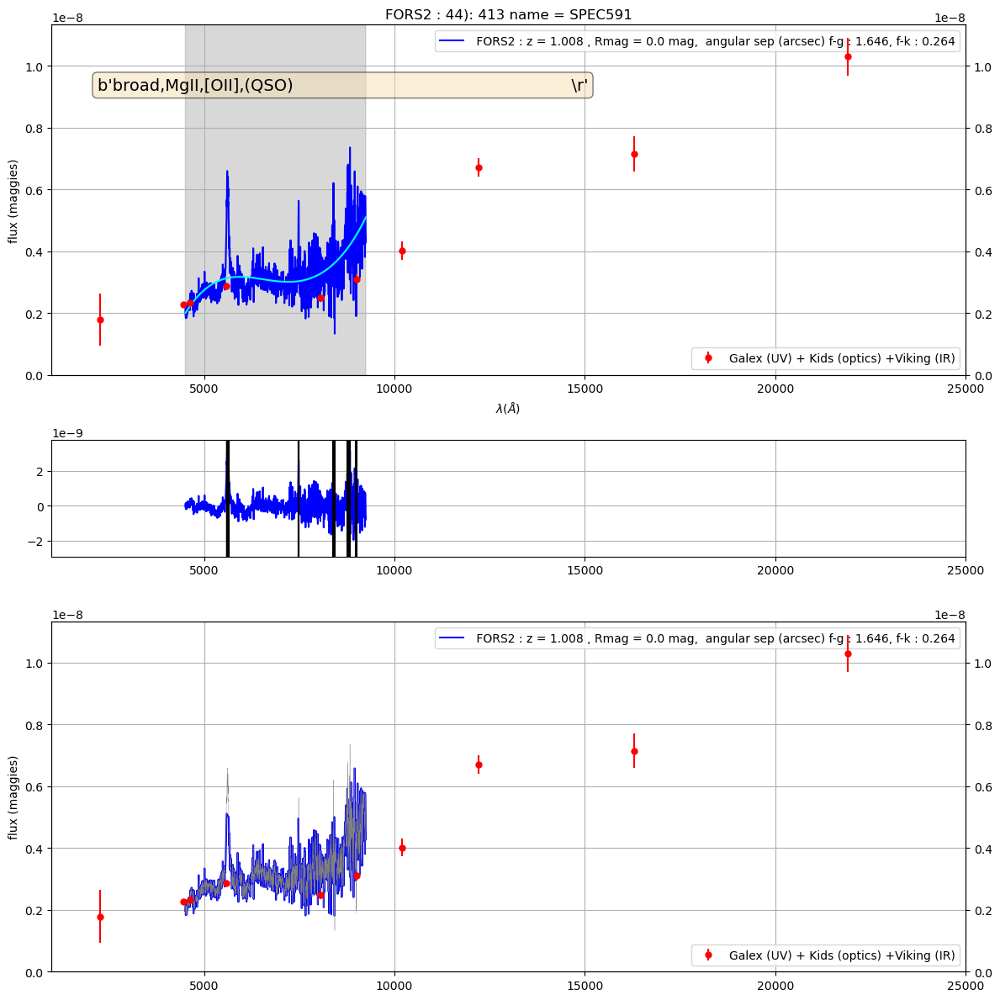

45  ==  SPEC595 595 416
the_lines =  b'[OII],H11,H10,H9,H8,K,H,H{delta},H{beta},[OIII]                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


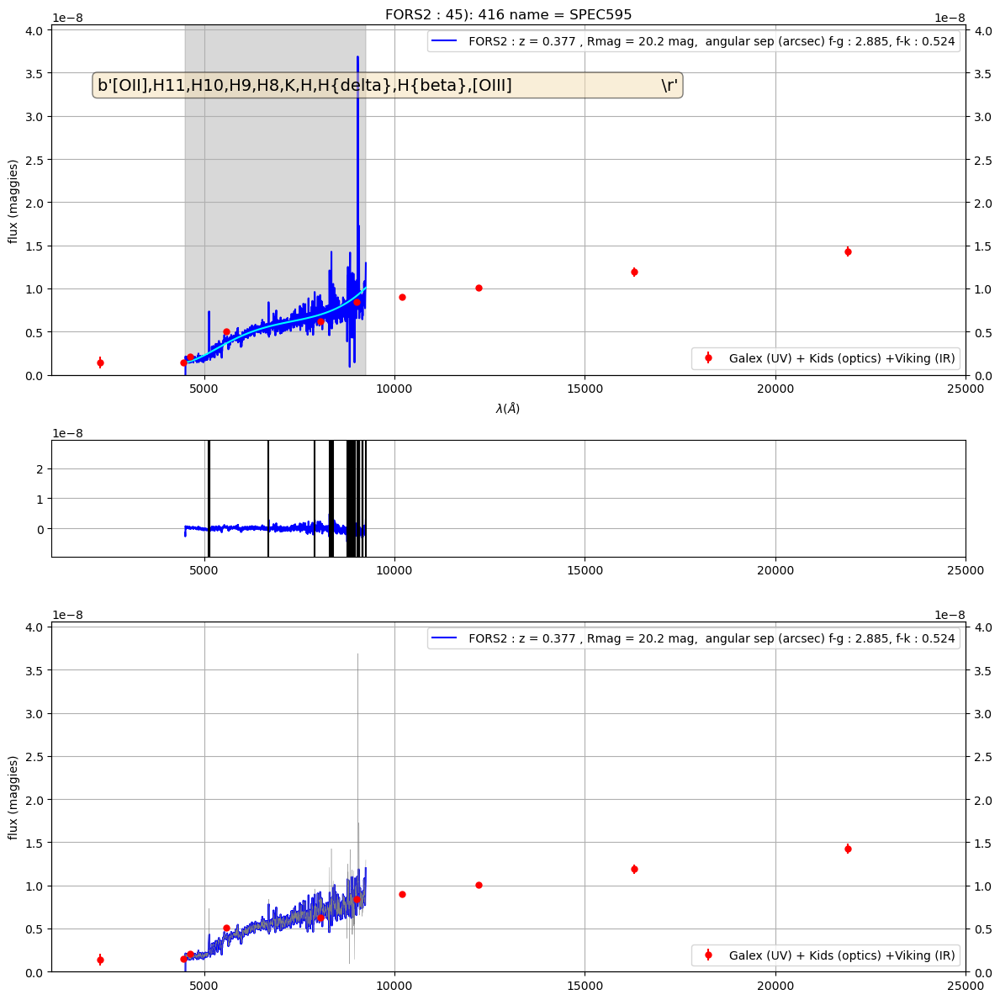

46  ==  SPEC604 604 425
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


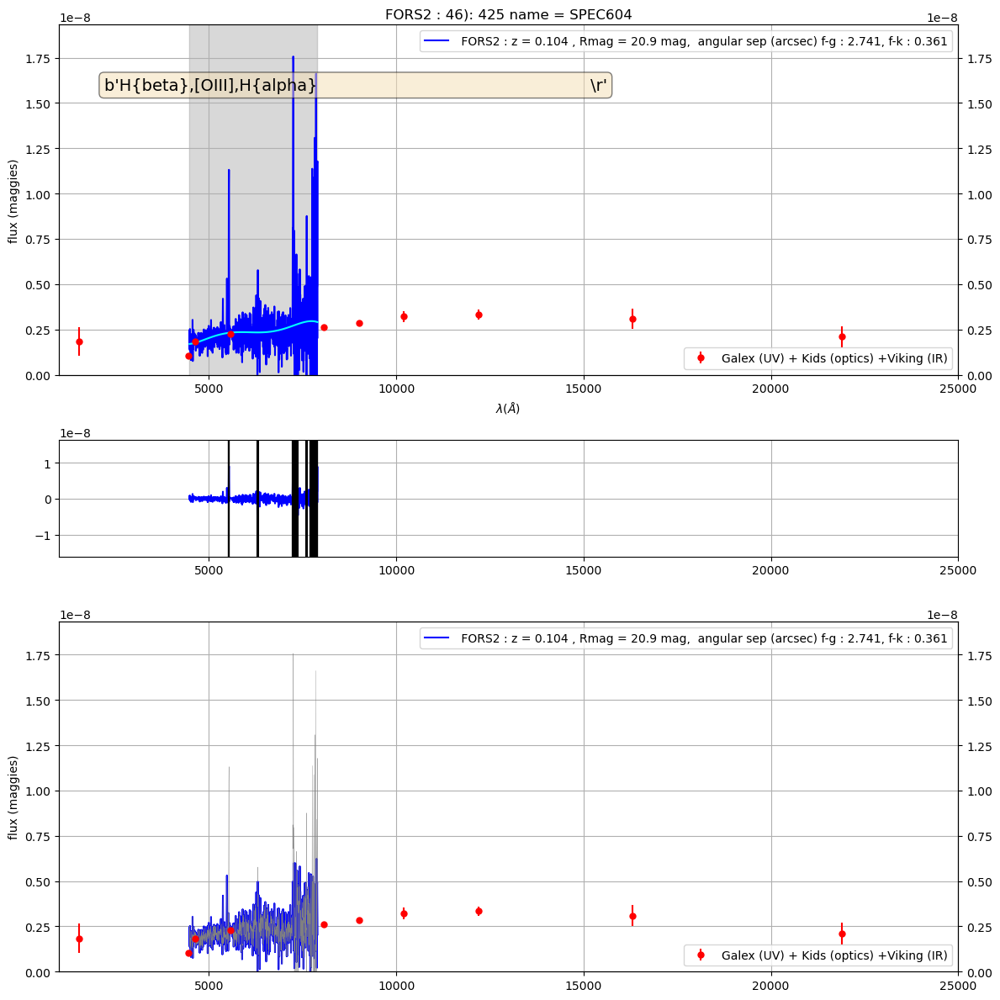

47  ==  SPEC608 608 428
the_lines =  b'weak,[OII],K,H,4000{AA}-break                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


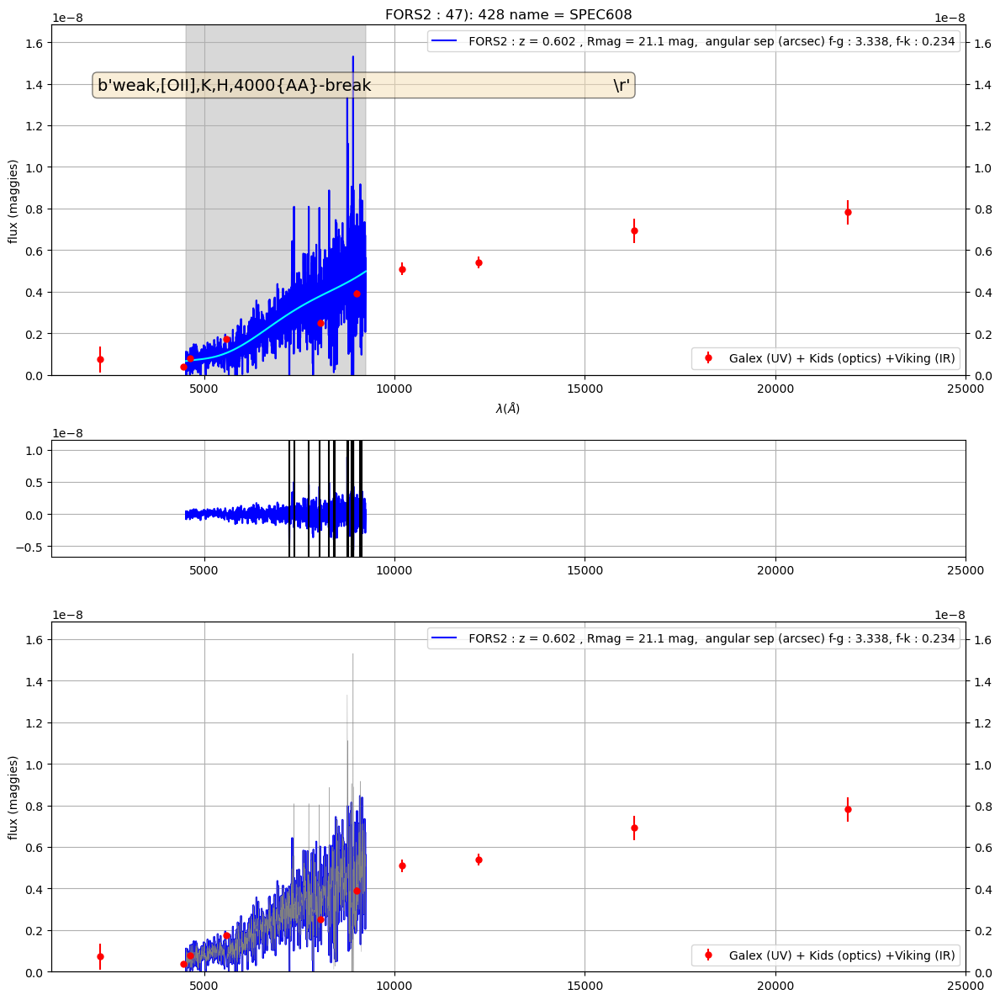

48  ==  SPEC611 611 431
the_lines =  b'[OII],H8,K,H,H{delta}                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


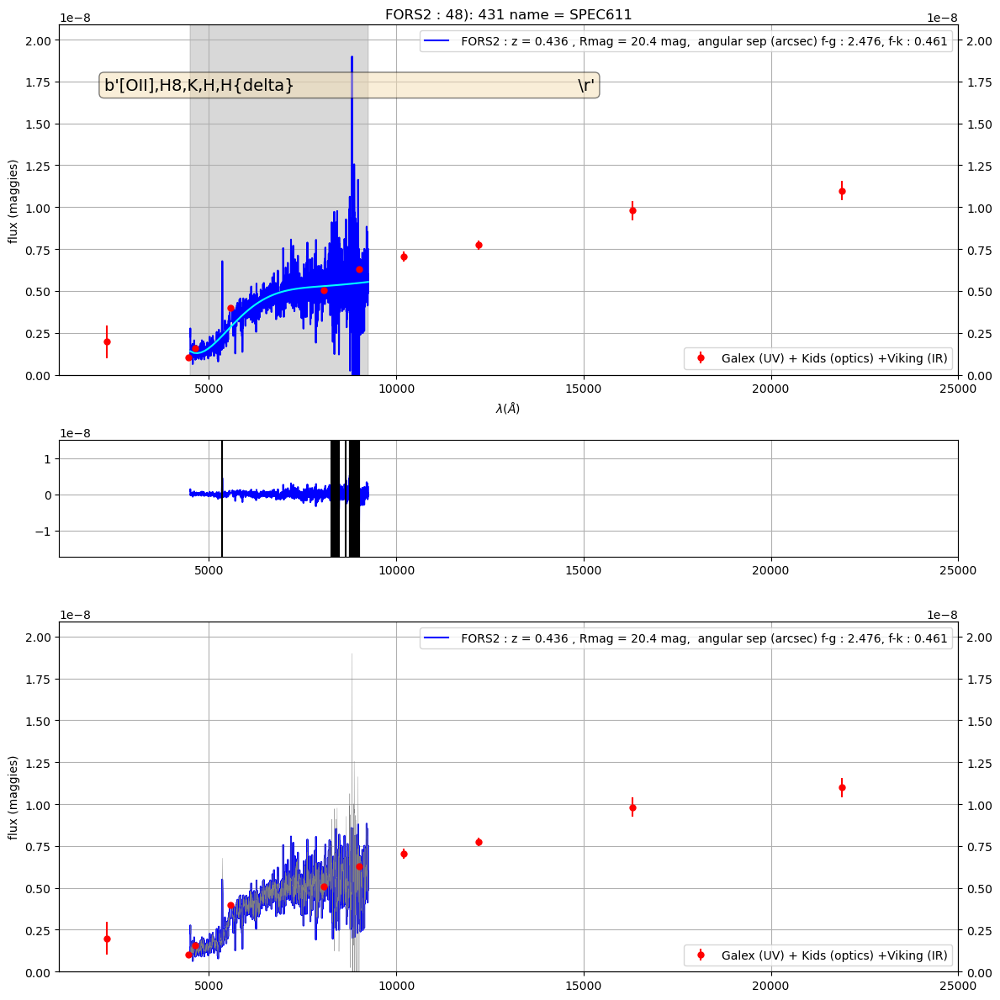

49  ==  SPEC626 626 442
the_lines =  b'[OII],H8,K,H                                                                \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


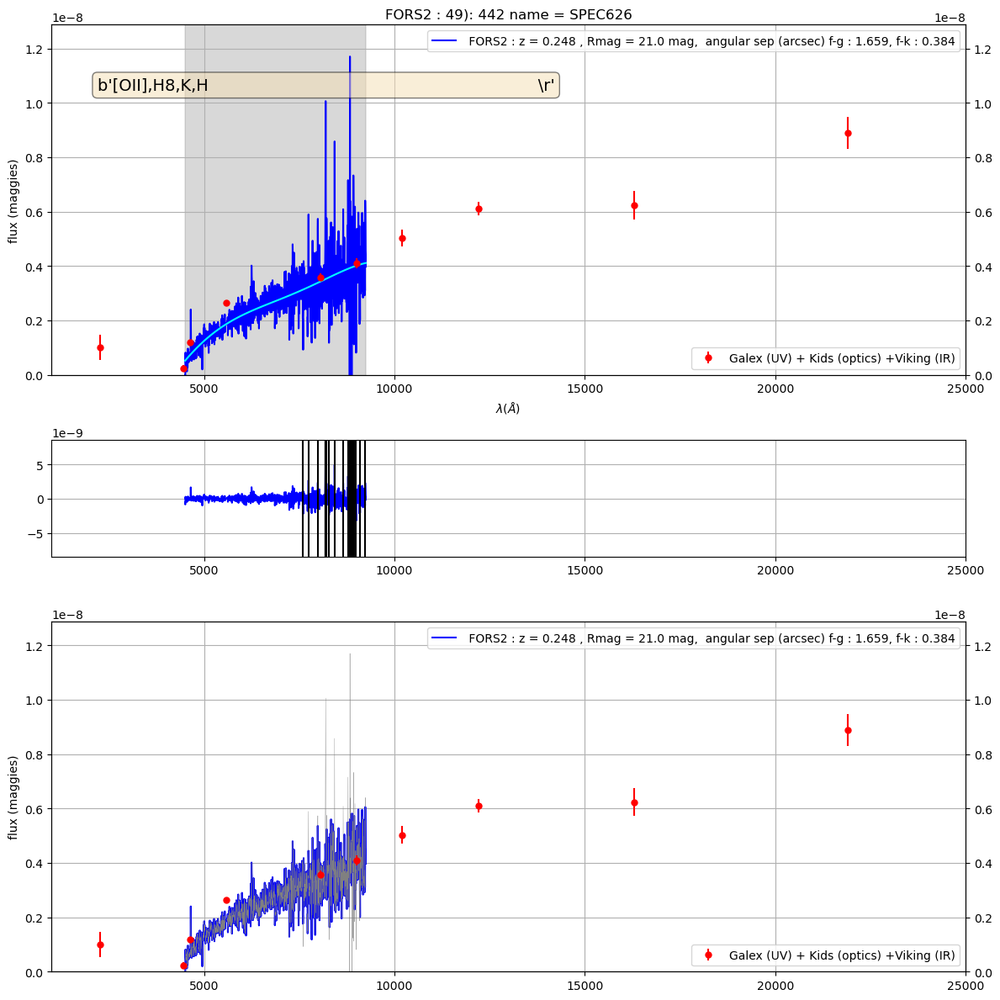

50  ==  SPEC642 642 458
the_lines =  b'[OII],H10,H{gamma},H{beta},[OIII]                                           \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


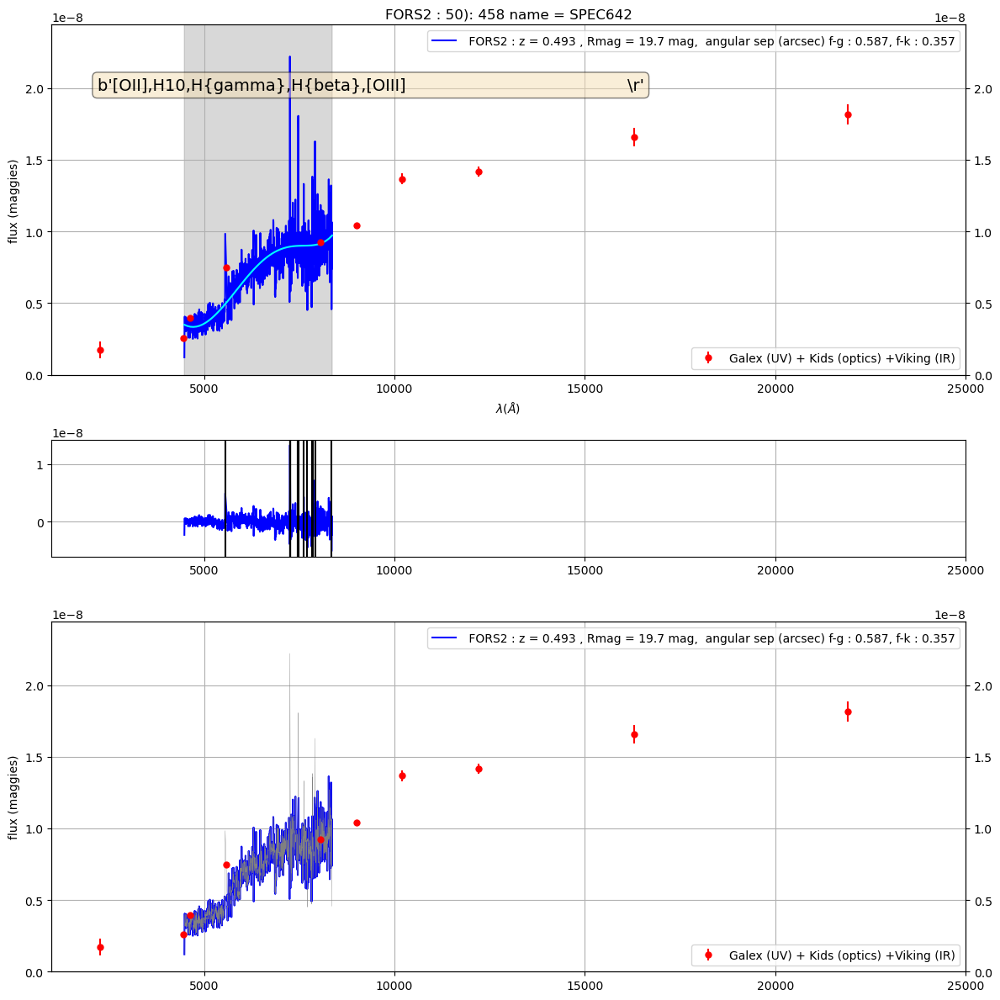

51  ==  SPEC643 643 459
the_lines =  b'H8,K,H,4000{AA}-break                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


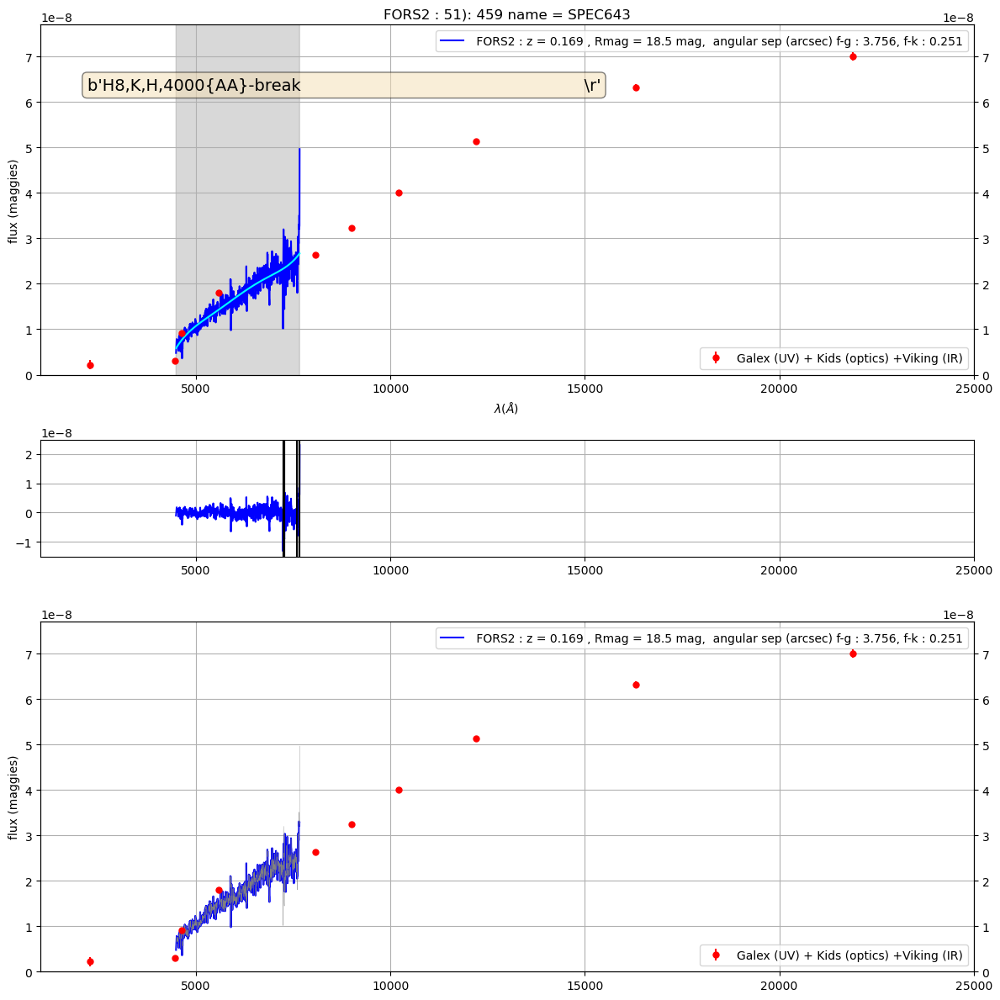

52  ==  SPEC645 645 461
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


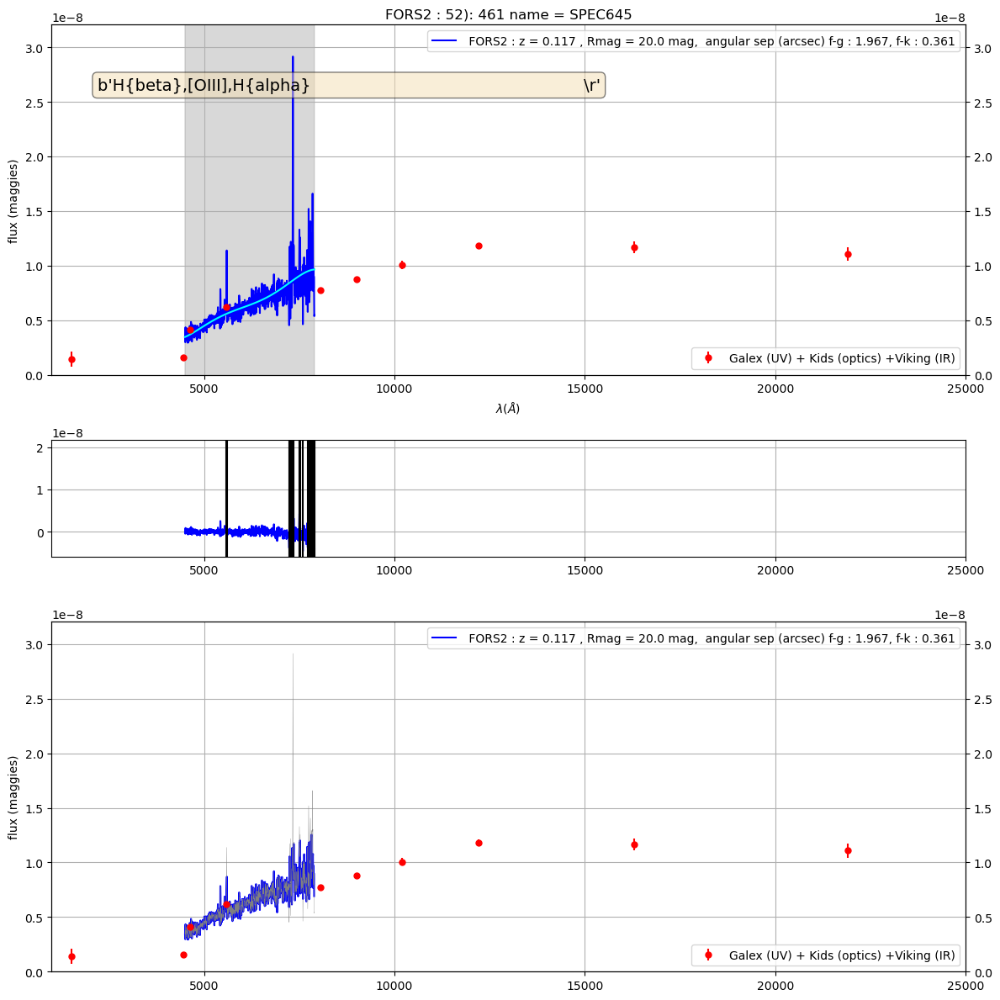

53  ==  SPEC647 647 463
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


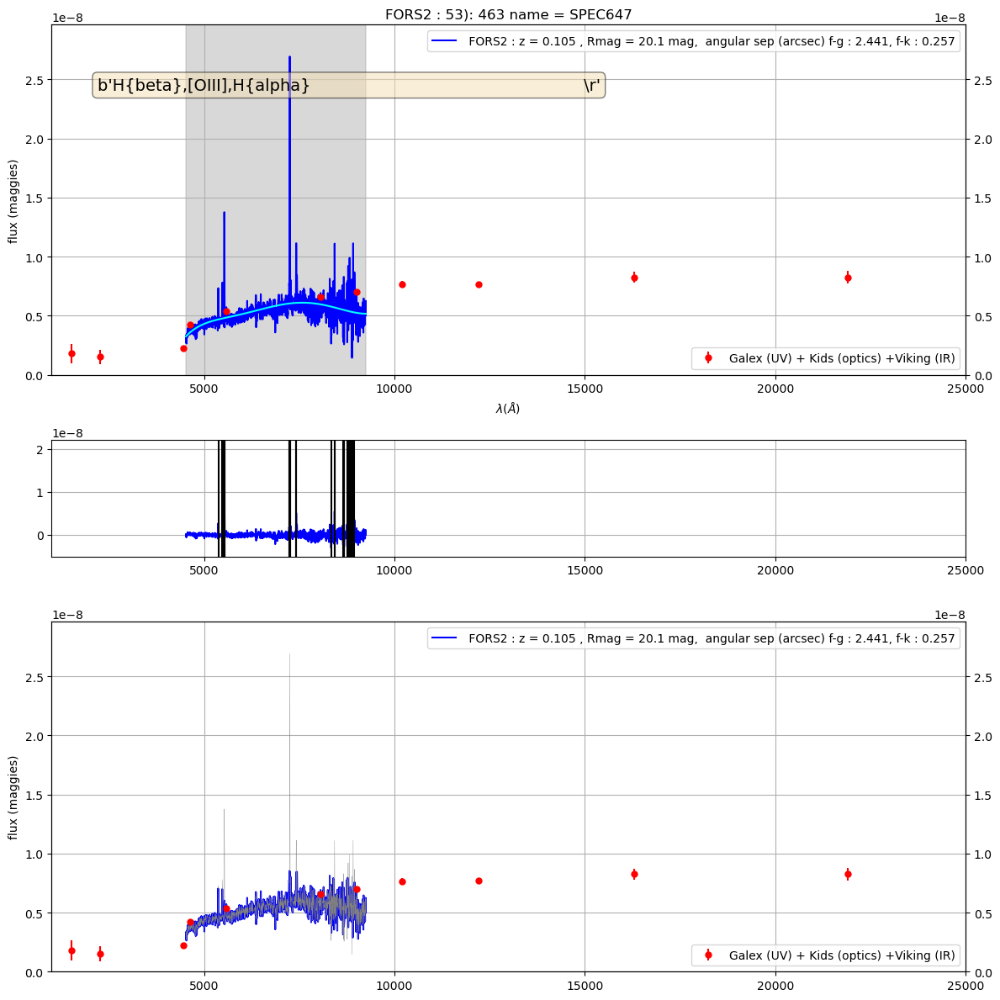

54  ==  SPEC653 653 469
the_lines =  b'[OII],H9,H8,K,H,H{beta},H{alpha}                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


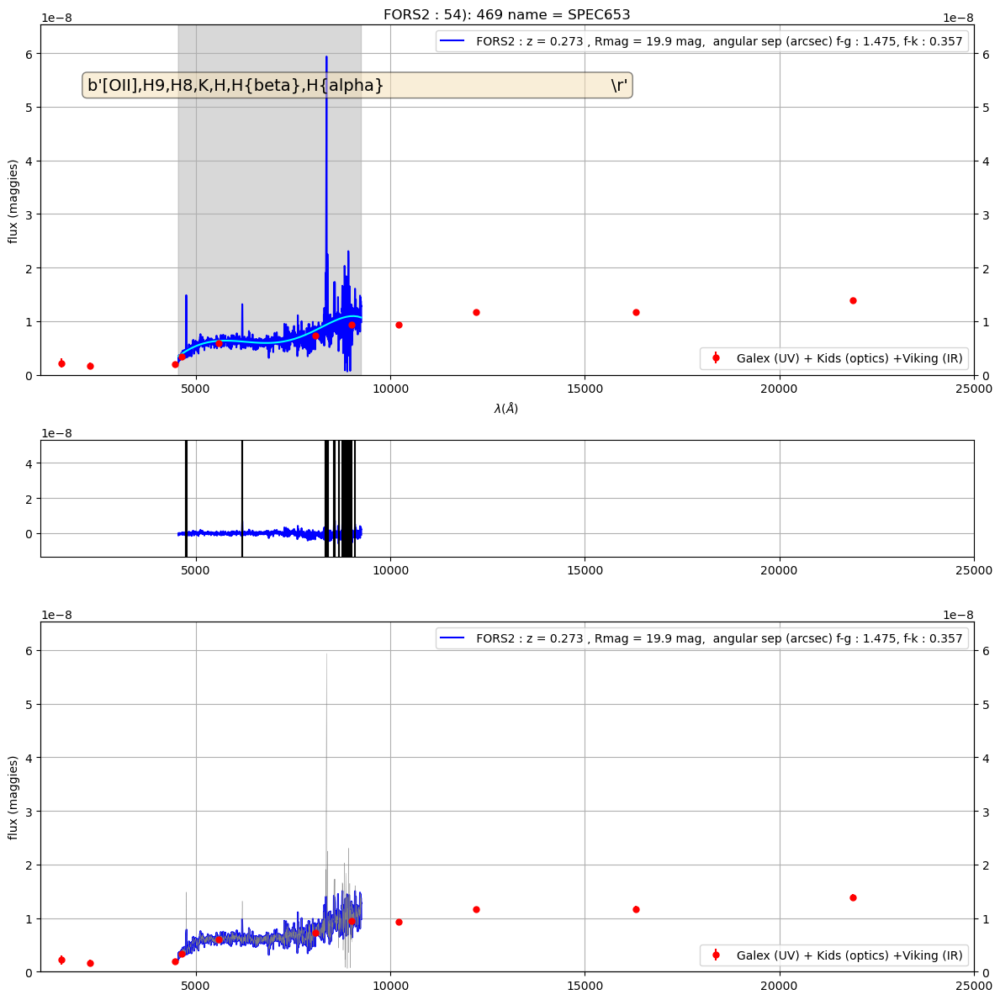

55  ==  SPEC657 657 473
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


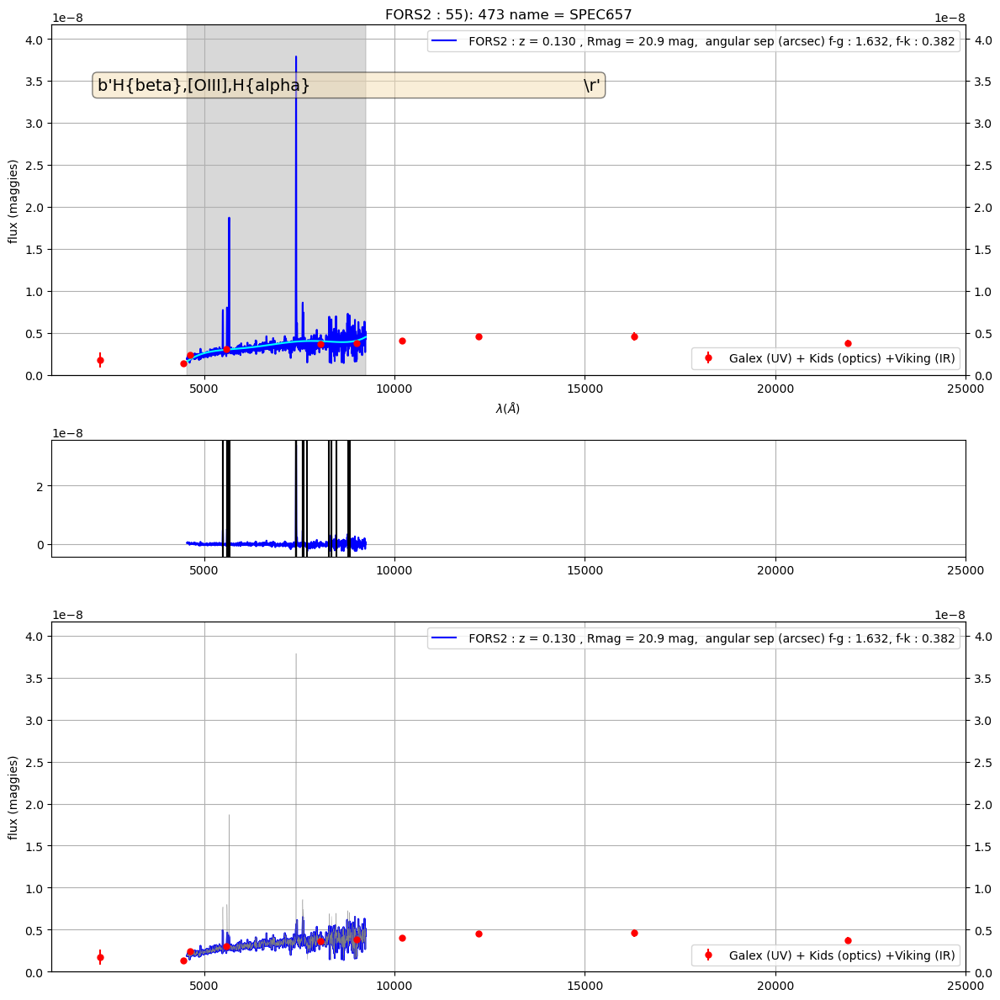

56  ==  SPEC664 664 480
the_lines =  b'[OII],H8,K,H,H{delta},H{beta},[OIII]                                        \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


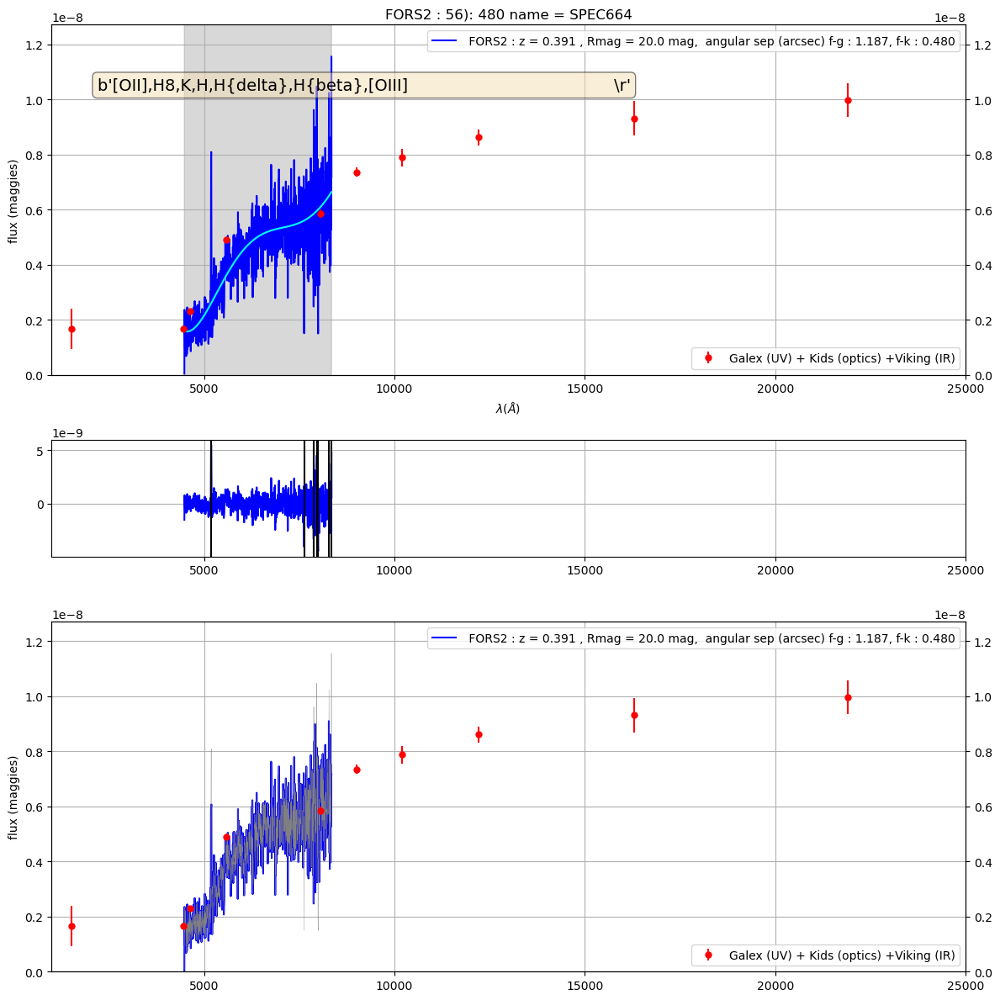

57  ==  SPEC669 669 483
the_lines =  b'[OII],H9,H8,K,H,H{delta}                                                    \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


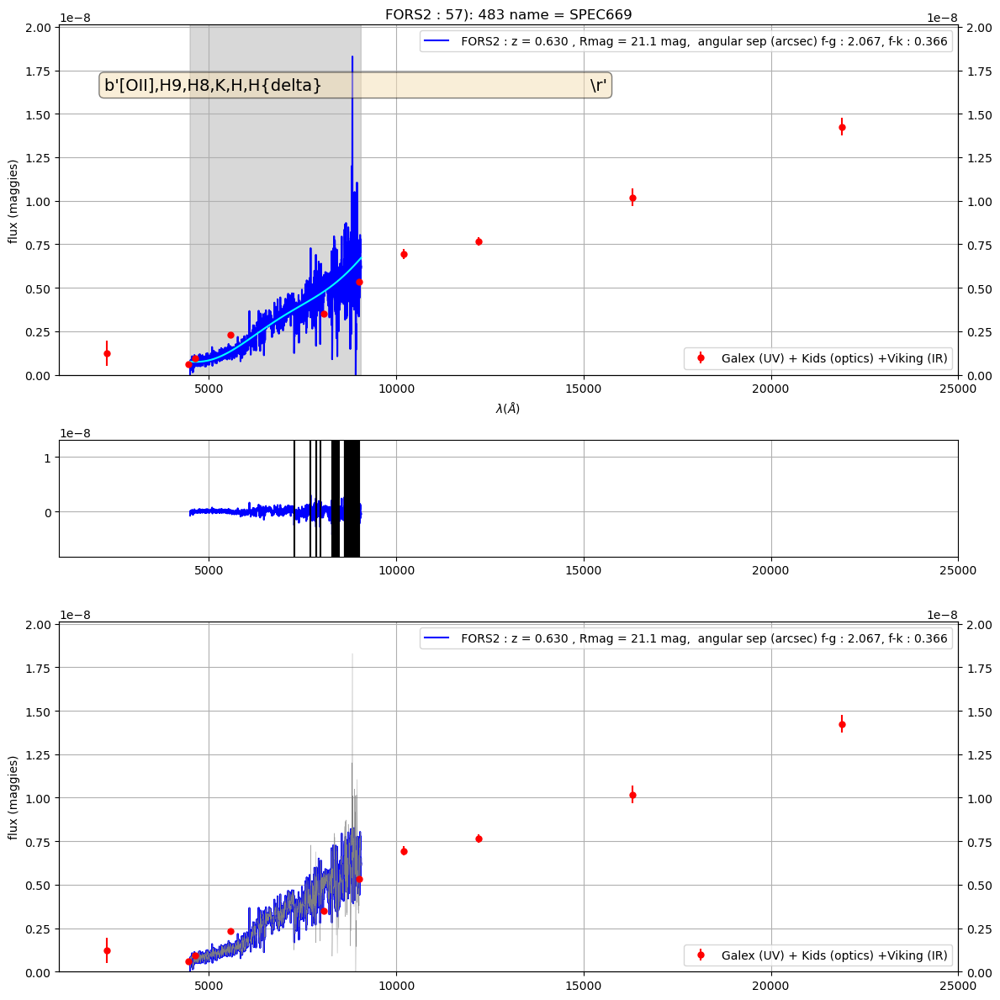

58  ==  SPEC691 691 504
the_lines =  b'[OIII],H{alpha}                                                             \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


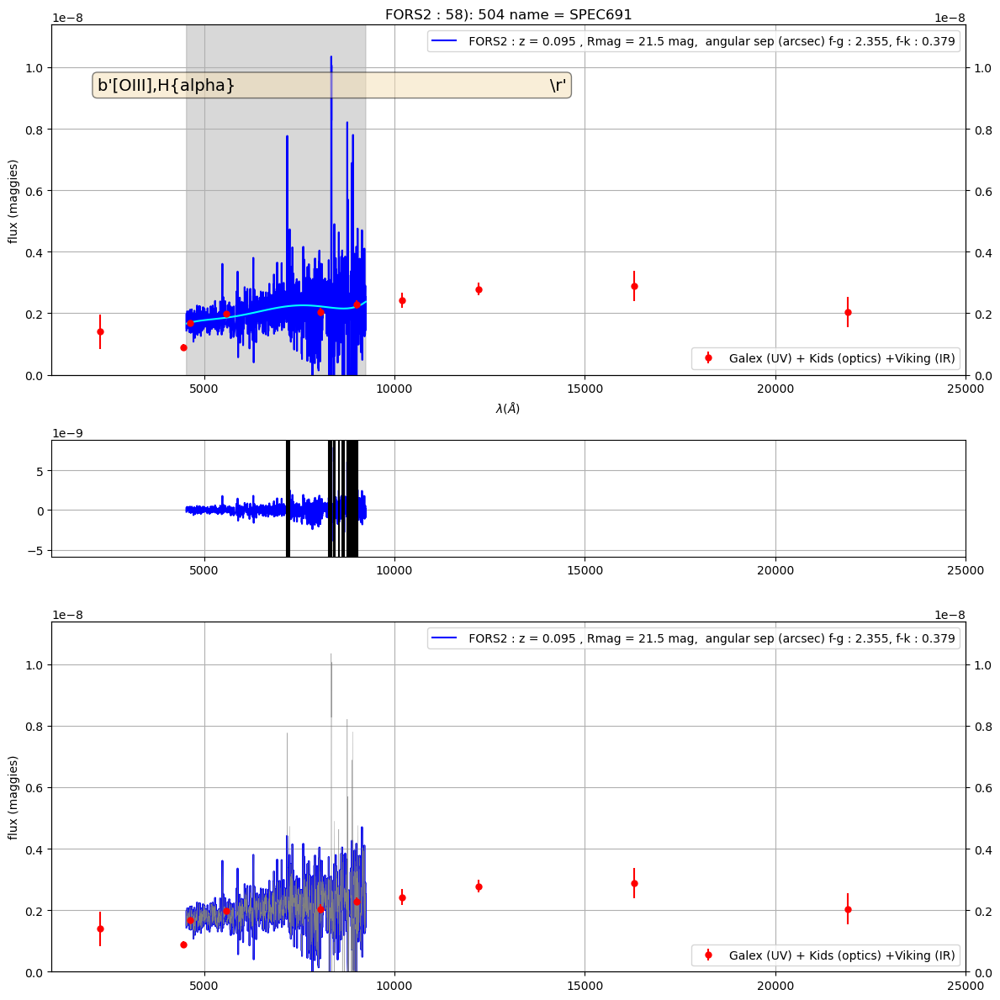

59  ==  SPEC698 698 511
the_lines =  b'H{beta},[OIII],H{alpha}                                                     \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


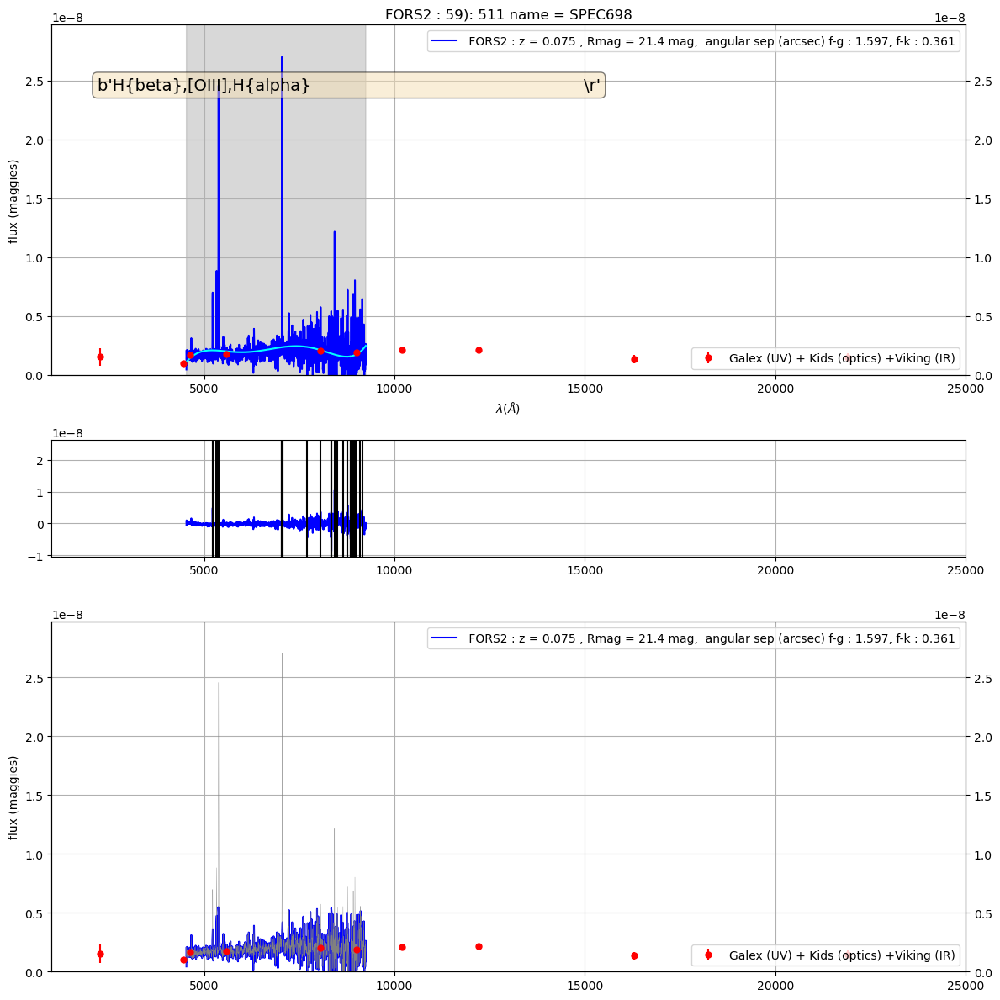

60  ==  SPEC699 699 512
the_lines =  b'H9,H8,K,H,H{delta},H{beta}                                                  \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


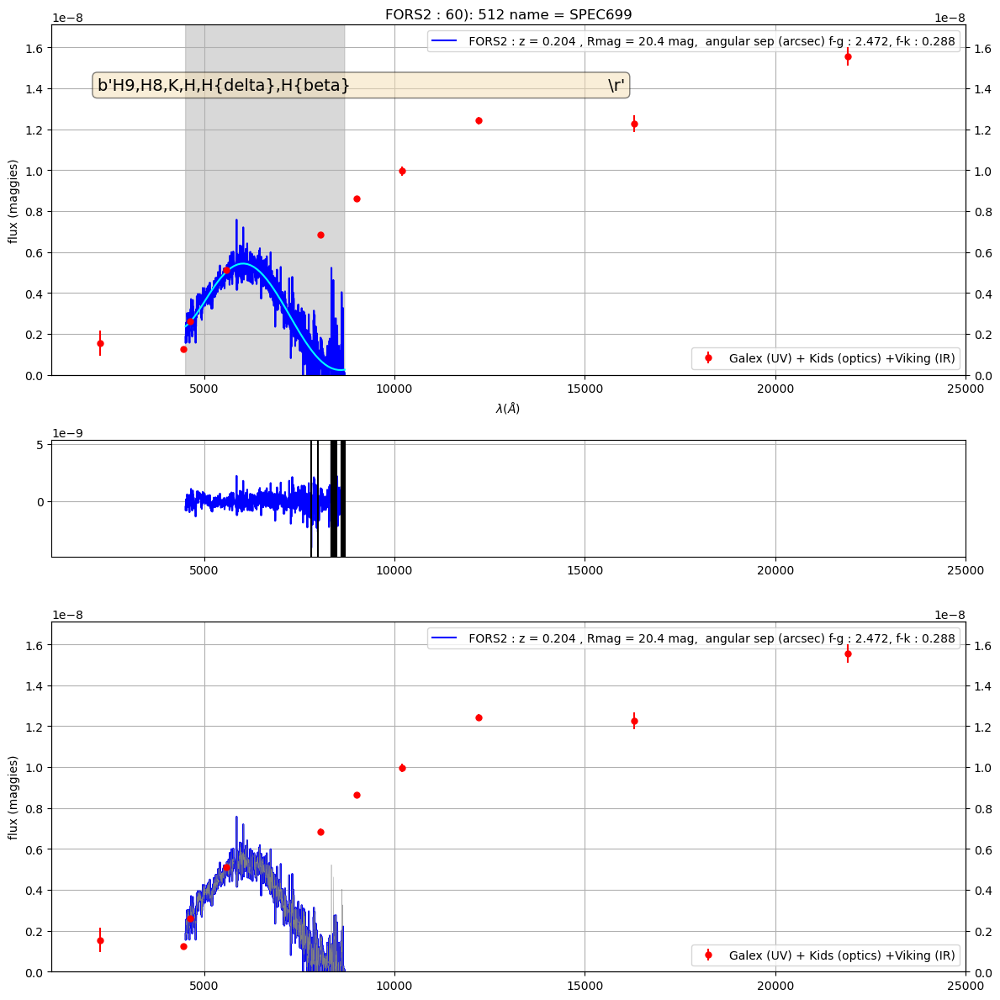

61  ==  SPEC717 717 528
the_lines =  b'[OII]                                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


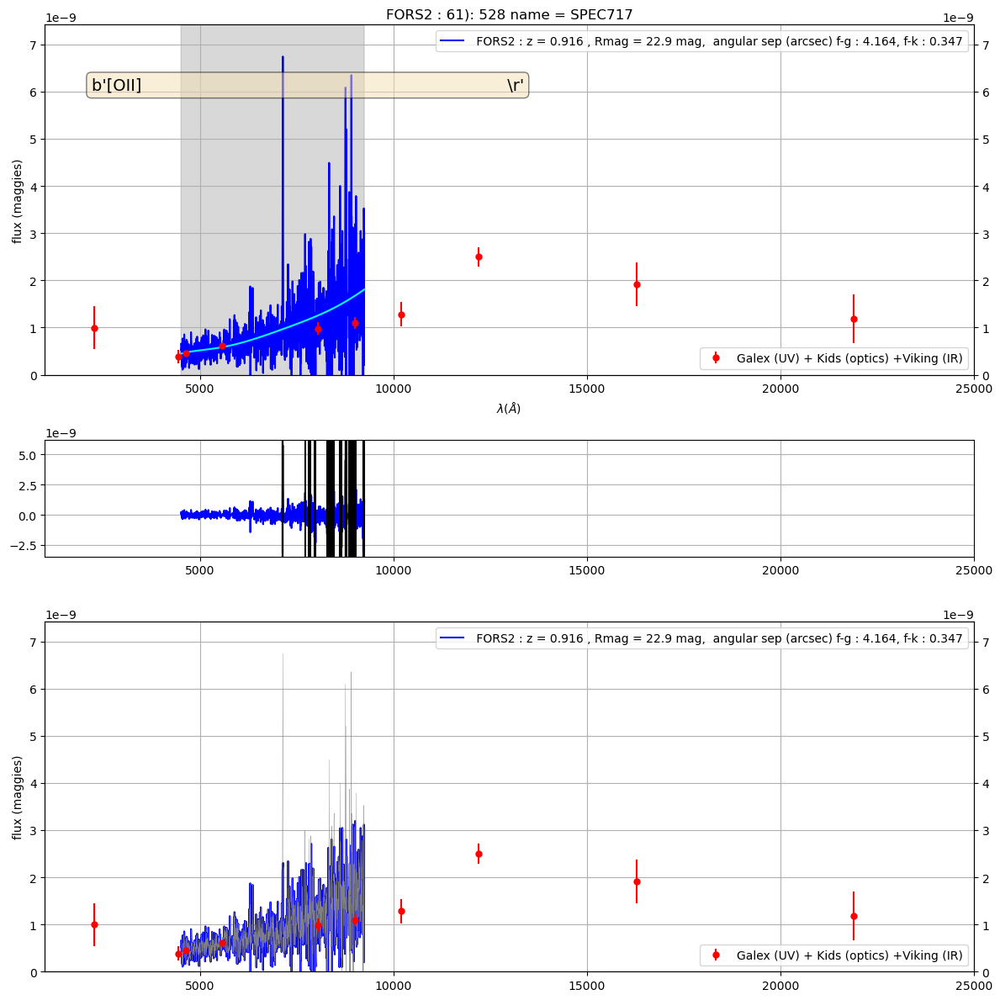

62  ==  SPEC719 719 530
the_lines =  b'[OII],H11,H10,H9,H8,K,H,H{delta},H{beta},[OIII],H{alpha}                    \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


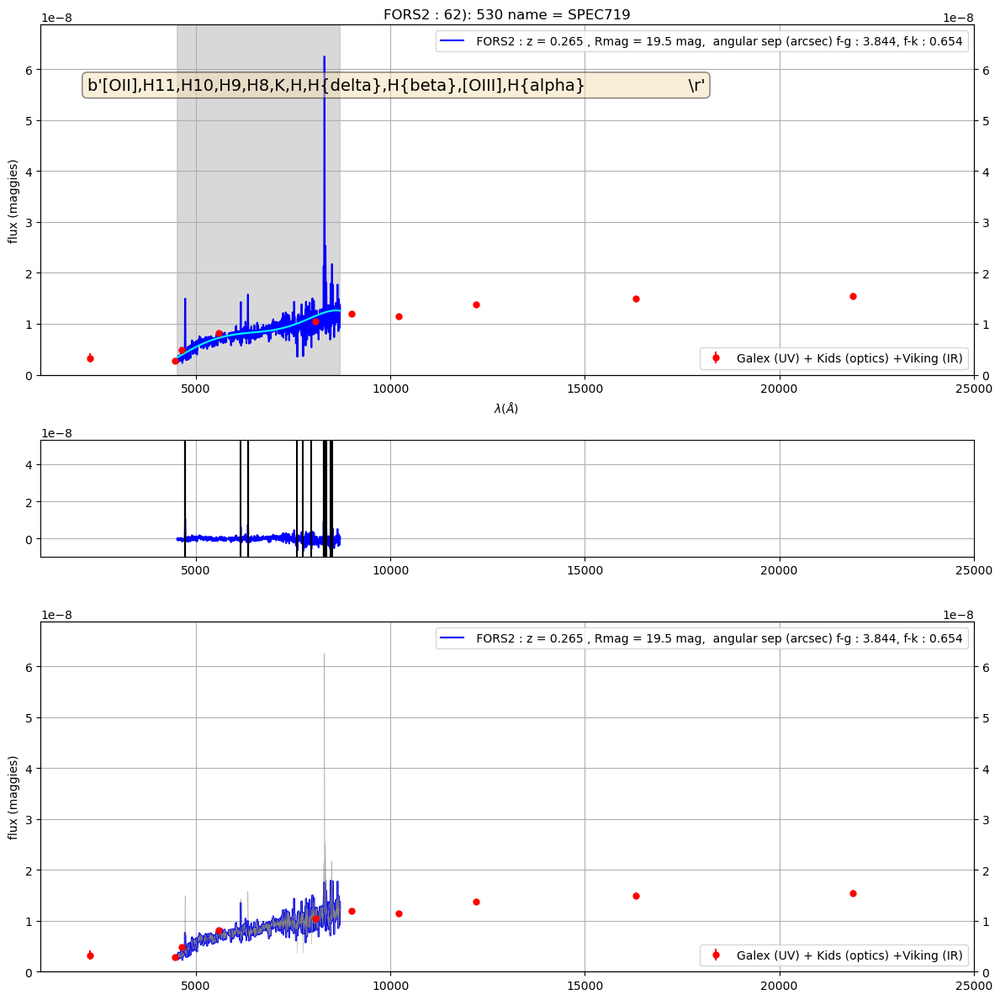

63  ==  SPEC722 722 533
the_lines =  b'broad,MgII,(QSO)                                                            \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


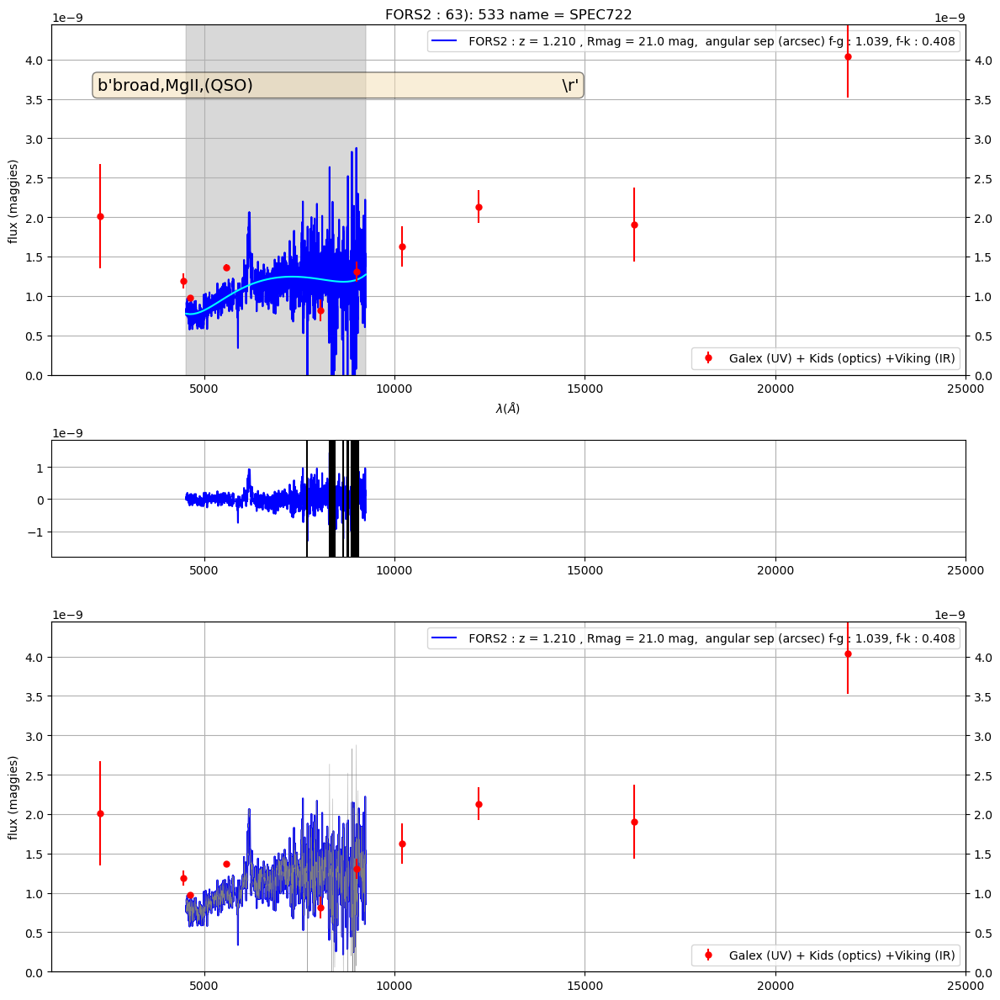

64  ==  SPEC724 724 535
the_lines =  b'[OII],H8,H,H{beta},[OIII],H{alpha}                                          \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


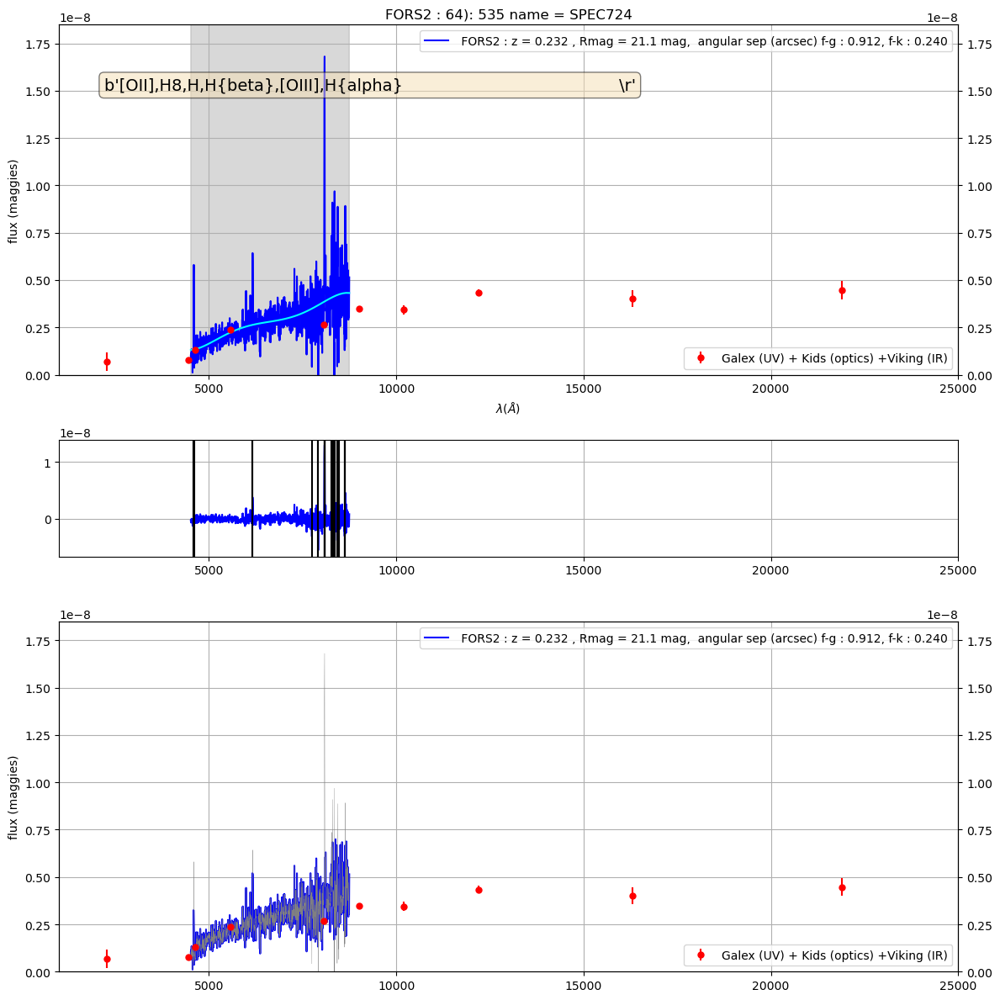

65  ==  SPEC725 725 536
the_lines =  b'[OII],H{beta},[OIII],H{alpha}                                               \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


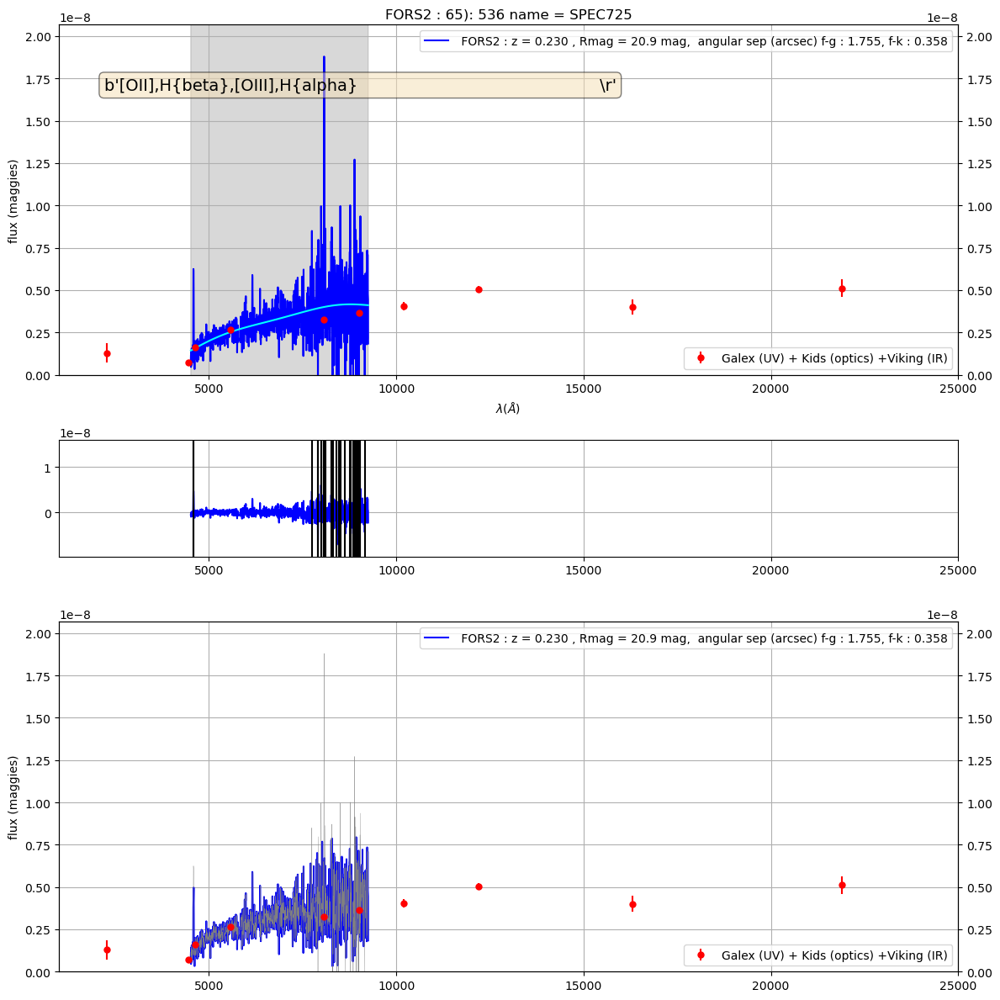

66  ==  SPEC727 727 538
the_lines =  b'[OII],[OIII],H{alpha}                                                       \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


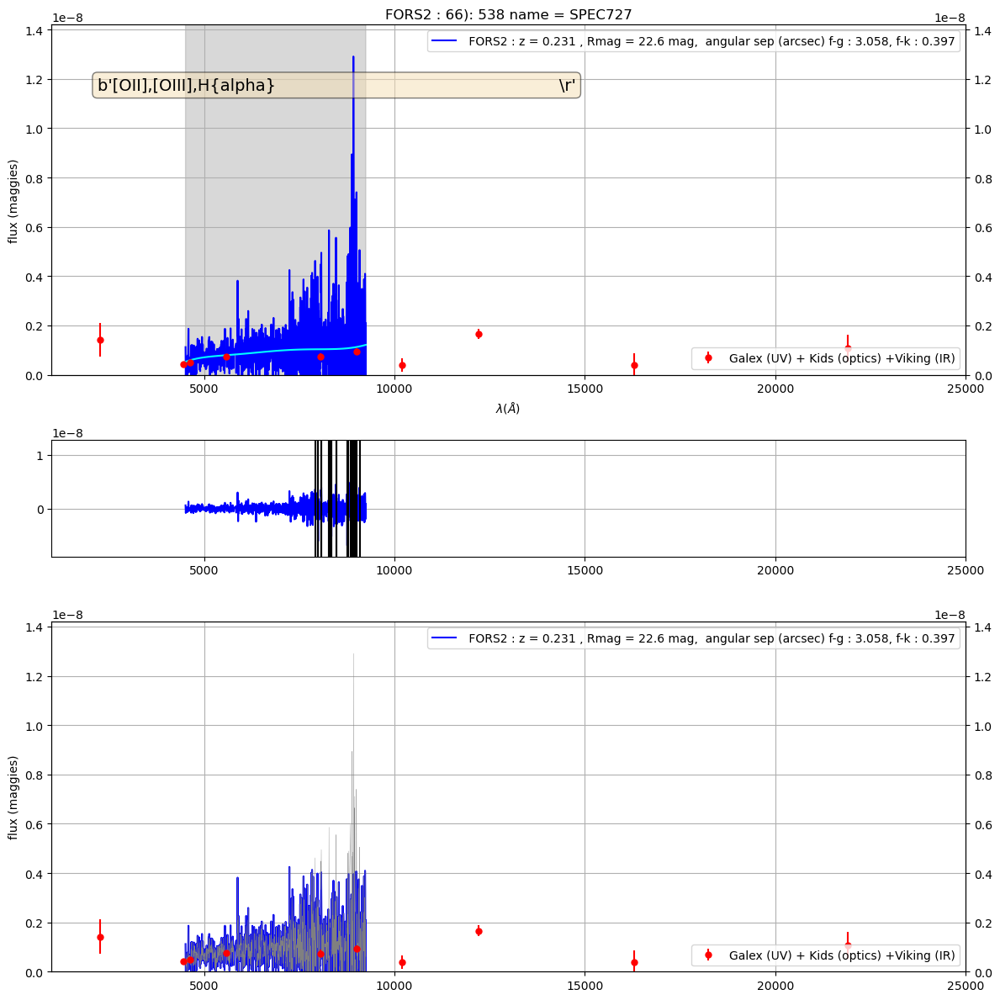

67  ==  SPEC732 732 543
the_lines =  b'H,K,H{gamma},H{beta},[OIII],H{alpha},NII                                    \r'


/Users/dagoret/opt/anaconda3/envs/prospector/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


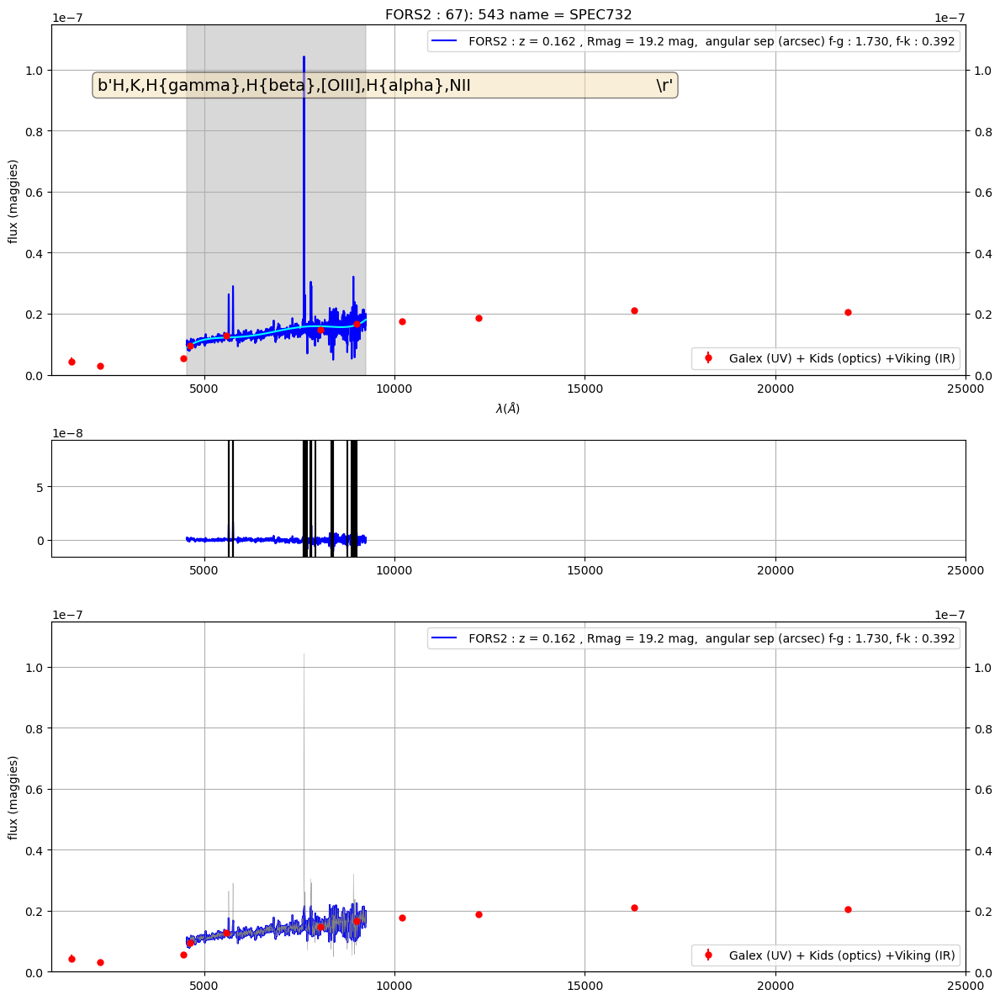

In [41]:
# loop on rows
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
for idx,row in df.iterrows():
    
    print(idx," == ",row["name"],row["num"],row["index0"])
    idx0 = row["index0"] # index for the spectrum
    specname  = row["name"]
    
    mags = [ row["fuv_mag"], row["nuv_mag"], row['MAG_GAAP_u'], row['MAG_GAAP_g'], row['MAG_GAAP_r'], row['MAG_GAAP_i'], row['MAG_GAAP_Z'], row['MAG_GAAP_Y'], 
            row['MAG_GAAP_J'], row['MAG_GAAP_H'],row['MAG_GAAP_Ks'] ]
    
    magserr = [ row["fuv_magerr"], row["nuv_magerr"], row['MAGERR_GAAP_u'], row['MAGERR_GAAP_g'], row['MAGERR_GAAP_r'], row['MAGERR_GAAP_i'], row['MAGERR_GAAP_Z'], row['MAGERR_GAAP_Y'], 
            row['MAGERR_GAAP_J'], row['MAGERR_GAAP_H'],row['MAGERR_GAAP_Ks'] ]
    
    mfluxes = [ 10**(-0.4*m) for m in mags ]
    mfluxeserr = []
    
    for f,em in zip(mfluxes,magserr):
        ferr = 0.4*np.log(10)*em*f
        mfluxeserr.append(ferr)
        
    mfluxes = np.array(mfluxes)
    mfluxeserr = np.array(mfluxeserr)
    
    fluxes =  [ row["fuv_flux"], row["nuv_flux"], row['FLUX_GAAP_u'], row['FLUX_GAAP_g'], row['FLUX_GAAP_r'], row['FLUX_GAAP_i'], row['FLUX_GAAP_Z'], row['FLUX_GAAP_Y'], 
            row['FLUX_GAAP_J'], row['FLUX_GAAP_H'],row['FLUX_GAAP_Ks'] ]
    
    fluxeserr =  [ row["fuv_fluxerr"], row["nuv_fluxerr"], row['FLUXERR_GAAP_u'], row['FLUXERR_GAAP_g'], row['FLUXERR_GAAP_r'], row['FLUXERR_GAAP_i'], row['FLUXERR_GAAP_Z'], row['FLUX_GAAP_Y'], 
            row['FLUXERR_GAAP_J'], row['FLUXERR_GAAP_H'],row['FLUXERR_GAAP_Ks'] ]
    
    
    # The image
    
    fig = plt.figure(figsize=(12,12),tight_layout=True)
    gs = gridspec.GridSpec(3, 1,height_ratios=[3, 1, 3])
    
    
    #top image : original glux
    ax= fig.add_subplot(gs[0, 0])
    
    z = row["redshift"]
    asep_fg = row['asep_galex']
    rmag = row["Rmag"]
    asep_fk = row['asep_kids']
    
  
    the_lines = row['lines']
    print("the_lines = ",the_lines)
    all_elements  = the_lines.decode().split(",")
    
    
    the_label = f" FORS2 : z = {z:.3f} , Rmag = {rmag:.1f} mag,  angular sep (arcsec) f-g : {asep_fg:.3f}, f-k : {asep_fk:.3f}" 
    the_wl = all_df[idx0]["wl"].values
    the_fnu = all_df[idx0]["fnu"].values*10**(-0.4*mags[4])
    
    ax.plot(the_wl,the_fnu,'b-',label=the_label)
    #ax.plot(all_df[idx]["wl"], all_df[idx]["fl"],'b-',label=row["num"])
   


    ax.text(0.05, 0.85, row["lines"], transform=ax.transAxes, fontsize=14,verticalalignment='top', bbox=props)
    
    X = the_wl
    Y = the_fnu
    gp.fit(X[:, None], Y)
    xfit = np.linspace(X.min(),X.max())
    yfit, yfit_err = gp.predict(xfit[:, None], return_std=True)
    ax.plot(xfit, yfit, '-', color='cyan')
    ax.fill_between(xfit, yfit -  yfit_err, yfit +  yfit_err, color='gray', alpha=0.3)
    
    
    
    ax2 = ax.twinx()
    ax2.errorbar(WL,mfluxes,yerr=mfluxeserr,fmt='o',color="r",ecolor="r",ms=5,label='Galex (UV) + Kids (optics) +Viking (IR)')
    #ax2.errorbar(WL, fluxes, yerr=fluxes, xerr=None, fmt='o', color="g",ecolor="g")
    ax2.legend(loc="lower right")
    
    ax.set_xlabel("$\lambda  (\AA)$ ")
    title = f"FORS2 : {idx}): {idx0} name = {specname}"
    ax.set_title(title)
    ax.set_ylabel("flux (maggies)")
    ax.legend(loc="upper right")
    ax.grid()
    
    the_max1 = np.max(the_fnu)
    goodmags = mfluxes[np.isfinite(mfluxes)]
    the_max2 = np.max(goodmags)
    the_max = 1.1*max(the_max1,the_max2)

    ax.set_ylim(0,the_max)
    ax2.set_ylim(0,the_max)

    ax.set_xlim(1000.,25000.)
    
    # Middle image : Fit a gaussian process and compute the residuals
    
    ax3 = fig.add_subplot(gs[1, 0])
    DeltaY,DeltaEY = Y - gp.predict(X[:, None], return_std=True)
    ax3.plot(X,DeltaY,'b')
    ax3.set_xlim(1000.,25000.)
    ax3.grid()
    
    background = np.sqrt(np.median(DeltaY**2))
    indexes_toremove = np.where(np.abs(DeltaY)> 8 * background)[0]
    
    
    for index in indexes_toremove:
        ax3.axvline(X[index],color='k')
        
    # resuting image after removing emission lines
    ax4 = fig.add_subplot(gs[2, 0])
    
    Xclean = np.delete(X,indexes_toremove)
    Yclean  = np.delete(Y,indexes_toremove)
    
    ax4.plot(Xclean, Yclean,'b-',label=the_label)
    ax4.set_ylim(0,the_max)
    ax4.set_xlim(1000.,25000.)
    ax4.grid()
    
    ax5 = ax4.twinx()
    ax5.errorbar(WL,mfluxes,yerr=mfluxeserr,fmt='o',color="r",ecolor="r",ms=5,label='Galex (UV) + Kids (optics) +Viking (IR)')
    #ax2.errorbar(WL, fluxes, yerr=fluxes, xerr=None, fmt='o', color="g",ecolor="g")
    ax5.legend(loc="lower right")
    ax5.set_ylim(0,the_max)
    
   
    ax4.set_ylabel("flux (maggies)")
    ax4.legend(loc="upper right")
    
    spectr = fors2.getspectrumcleanedemissionlines_fromgroup(specname,gp)

    the_wl = all_df[idx0]["wl"].values
    the_fnu = all_df[idx0]["fnu"].values*10**(-0.4*mags[4])
    
    ax4.plot(the_wl,the_fnu,color="grey",lw=0.25)

    
   

    
    plt.show()